In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import os,sys, gc
import keras


dirpath = os.getcwd().split("code")[0]+"code/"
sys.path.append(dirpath)
from pre_process import clean_LC,generate_representation
from evaluation import calculate_metrics, evaluate_metadata, evaluate_metadata_raw


folder = "../../KOI_Data/"
folder_lc = "/work/work_teamEXOPLANET/KOI_LC/"

Using TensorFlow backend.


In [2]:
from autoencoder_utils import Recon_eval
Evaluate = Recon_eval()

def evaluate_reconst(x,xhat):
    print("----- EVALUANDO RECONSTRUCCION DE LA CURVA -----")
    res = Evaluate.get_res(x, xhat)
    plt.figure(figsize=(10,4))
    sns.distplot(res.flatten())
    plt.title("Distribucion de residuos promedio")
    plt.show()
    
    print("------------- Error -------------")
    #print("MSE      = ",Evaluate.MSE_LC(None,None, res))
    print("RMSE (+-) = ",Evaluate.RMSE_LC(None,None, res))
    print("MAE  (+-) = ",Evaluate.MAE_LC(None,None, res))
    
    print("------------- Smoothness -------------")
    xhat = np.squeeze(xhat)
    A = np.mean(np.apply_along_axis(Evaluate.autocorr_func, 1, xhat)[:,1])
    print("AutoCorr lag-one = ",A)
    M = np.mean(np.apply_along_axis(Evaluate.mean_diff, 1, xhat))
    print("Diff MEAN = ",M)
    #S = np.mean(np.apply_along_axis(Evaluate.std_diff, 1, xhat))
    #print("Diff STD = ",S)
    
    print("------------- Residual -------------")
    res = np.squeeze(res)
    R = np.mean(np.apply_along_axis(Evaluate.autocorr_func, 1, res)[:,1])
    print("AutoCorr lag-one = ",R)
    M = np.mean(np.apply_along_axis(np.mean, 1, res))
    S = np.mean(np.apply_along_axis(np.std, 1, res))
    print("Mean (+) STD = %f (+) %f"%(M,S))
    spec = np.mean(np.apply_along_axis(Evaluate.series_entropy, 1, res, which='spec'))
    print("Spectral H = ",spec)
    print("---------------------------------------")

### Create dataset

In [3]:
mask_transit = np.load("data/mask_transit_LC.npy")  #
# datos de abajo debieran ser todas las curvas.. poner mascara sobre los utilziados
mask_transit

array([ True,  True, False, ...,  True,  True,  True])

In [4]:
T = 300
X_fold_lc = np.load("data/LC_global_%dT.npy"%T)
X_fold_lc_aug = np.load("data/LC_globalA_%dT.npy"%T)
X_fold_time = np.load("data/Time_global_%dT.npy"%T)
X_fold_lc.shape

(8054, 300)

In [5]:
## NEW : set mask
X_fold_lc_tr = X_fold_lc[mask_transit]
X_fold_lc_aug_tr = X_fold_lc_aug[mask_transit]
X_fold_time_tr = X_fold_time[mask_transit]
N,T = X_fold_lc_tr.shape
N

4317

In [6]:
mask_train = np.random.rand(X_fold_lc_tr.shape[0])< 1#0.75
mask_test = ~mask_train

In [7]:
X_train_t = np.concatenate([X_fold_time_tr[mask_train], X_fold_time_tr[mask_train]], axis=0)
X_train = np.concatenate([X_fold_lc_tr[mask_train], X_fold_lc_aug_tr[mask_train]], axis=0)

X_test = X_fold_lc_tr[mask_test]
X_test_t = X_fold_time_tr[mask_test]

X_train = np.expand_dims(X_train, axis=-1)
X_test = np.expand_dims(X_test, axis=-1)

X_train_t = np.expand_dims(X_train_t, axis=-1)
X_test_t = np.expand_dims(X_test_t, axis=-1)

print("X train shape: ",X_train.shape)
print("X train time shape: ",X_train_t.shape)
print("X test shape: ",X_test.shape)

X train shape:  (8634, 300, 1)
X train time shape:  (8634, 300, 1)
X test shape:  (0, 300, 1)


###  NEW

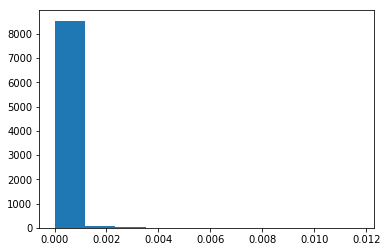

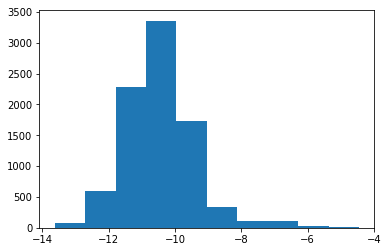

In [8]:
def scaled_MSE(y_true,y_pred,scale):
    return np.mean(np.mean( scale**2 * np.mean( (y_true - y_pred)**2 , axis=1), axis=0))

S_train = np.std(X_train, axis=1)
S_test = np.std(X_test, axis=1)

plt.hist(S_train)
plt.show()
plt.hist(np.log(S_train))
plt.show()

### Keras models

In [9]:
from keras import backend as K
from keras.models import Sequential, Model
from keras.layers import *

from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot
from sklearn.metrics import mean_squared_error
def plot_n_lc(real_lc, decoded_lc, n = 10, s=None):
    for _ in range(n):
        n_sampled = np.random.randint(0, real_lc.shape[0])
        real_lc_n = np.squeeze(real_lc[n_sampled])
        decoded_lc_n = np.squeeze(decoded_lc[n_sampled])
        
        if s !=None:
            print("Real scale = %f\nPred scale = %f"%(s[0][n_sampled], s[1][n_sampled] ))
        f, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=True,figsize= (15,5))
        ax1.plot(real_lc_n, 'b.-')
        ax1.set_title("Real")
        ax2.plot(decoded_lc_n, 'b.-')
        ax2.set_title("Reconstructed")
        ax3.plot(real_lc_n-decoded_lc_n, 'b.-')
        ax3.set_title("Residuo")
        plt.show()  

        plt.figure(figsize=(15,5))
        plt.plot(real_lc_n, 'bo-', label="Real")
        plt.plot(decoded_lc_n, 'g*-', label="Reconstructed")
        plt.title("Over")
        plt.legend()
        plt.show()
        print("----------------------------------------------------------------")

In [22]:
from autoencoder_utils import define_samp_model,  Mul_L,  Div_L, get_GRU
from autoencoder_utils import Norm_L,  RevertNorm_L
BATCH_s = 64
EPOCHS = 300

l = 0.001 #kl weight
latent_dim = 16
_, T, channels = X_train.shape

## SCALED - VAE

Idea: agregar la escala de cada datos como *input* adicional al modelo para obtener representación *raw* como salida **-> inspirador de C-VAE**
 
Idea: aprender el comportamiento/patrones/formas/ de los datos sin su escala (std) - VAE normal ejecutado - de manera simultánea y paralela con la escala de los datos (comúnmente asociada a ruido).

> Ventajas:
* Similar reconstrucción que VAE normal (como es de esperar) -- errores por la prediccion de escala
* reconstruye datos en la escala original (representación raw) de la serie de tiempo, permitiendo generar datos aleatorios en esa escala
* Al añadir la escala se tiene más información para aprender, la representación oculta es mejor para detectar planetas (F1 macro-clasificación)
* Se encuentran grupos de comportamiento en representación.

* Cada dato $x^{(i)}$ tiene su escala $s^{(i)} = std(x^{(i)})$
* Primera capa en la curva de luz, se remueve la escala: $ x_s^{(i)} = \frac{x^{(i)}}{s^{(i)}}$
    * $x_s^{(i)} \sim \mathcal{N}(0,1)$
* Ultima capa de la curva de luz, se recupera la escala (con una reconstrucción de la escala):  $ \hat{x}^{(i)} = \hat{x}_s^{(i)} * \hat{s}^{(i)}$

* La escala también es codificada, para normalizar los altos valores de los bajos se realiza una transformación logarítmica y se normaliza: 
$$
 Norm_L(s) = \frac{ \log{s} - mean(\log{s}) }{ std(\log{s})}
$$
Para revertir la transformación se realiza el proceso inverso: $\hat{s} = Norm_L^{-1}(a) = RevertNorm_L(a) = exp(a*std(\log{a}) + mean(\log{a}))$  
Los valores de media y desviación estándar son calculados sobre todo el *dataset*.

#### Entrenamiento - Optimización
* Para reconstruir la escala se utiliza *Mean squared logarithm error*:
$$
MSLE(S, \hat{S}) = \frac{1}{N} \sum_i^N \left( \log{s^{(i)}} - \log{\hat{s}^{(i)}}  \right)^2
$$

* La función *loss* de la reconstrucción se ve modificada al poner un peso sobre cada dato $w_i$, lo mismo que realiza la técnica de *sample weight*. La idea que debido a la diferente escala de los datos, poner un peso que haga que todos los datos tengan la misma influencia en la función objetivo.
$$
SMSE(X, \hat{X}) = \frac{1}{N} \sum_i^N w_i \frac{1}{T} \sum_t^T \left( x_t^{(i)} - \hat{x}_t^{(i)}  \right)^2
$$
El valor $w_i = 1/var(x^{(i)})$, derivado desde: $w_i = \left(1/s^{(i)}\right)^2$, con la idea de remover la escala a $x^{(i)}$ y tener un valor interpretable.

* La *loss* final para entrenar el VAE corresponde a:
$$
loss = SMSE(X, \hat{X}) + \lambda*KL + \alpha*MSLE(S_{inv}, \hat{S}_{inv})
$$
El valor de $\lambda $ para el factor de regularización KL, es un valor pequeño de $10^{-3}$, para lograr que el modelo aprenda los otros valores correctamente. El valor de $\alpha$ es de $10^{-1}/var(\log{(S)})$, el valor de $10^{-1}$ es para disminuir y  dejarle todo el peso a la reconstrucción $SMSE$, mientras que el valor de $var(\log{(S)})$ es para remover la escala y dejar en la mismas proporciones que la métrica $SMSE$, viene desde $\left(std(\log{(S)})\right)^2$

In [11]:
def KL_loss(z_mean,z_log_var):
    #the mean and log-var of the latent distribution
    def KL(y_true, y_pred):
        return - 0.5 * K.sum(1 + z_log_var - K.square(z_mean) - K.exp(z_log_var), axis=-1)
    return KL

def MSLE_scale_loss(s_true, s_hat): #Mean squared logarithm error
    def MSLE_scale(y_true, y_pred):
        mse_SCALE = K.mean(K.square( K.log(s_true) - K.log(s_hat) ), axis=-1)
        return mse_SCALE / (Slog_std)**2 #divide in order to MSLE does not have scale
    return MSLE_scale

def SMSE_loss(s_lc):
    def SMSE(y_true, y_pred):
        mse_LC = K.mean( K.square( y_true - y_pred ), axis=1) #on time axis..    
        mse_LC = K.flatten(mse_LC)
        #mse_LC = K.squeeze(mse_LC, axis=-1)
        weights = K.square(s_lc)[:,0]
        return mse_LC / weights #both values has to be on same shape
    return SMSE
  
S_mu = np.mean(S_train)
S_std = np.std(S_train)

Slog_mu = np.mean(np.log(S_train))
Slog_std = np.std(np.log(S_train))

S_train.shape

(8634, 1)

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
T_inp (InputLayer)              (None, 300, 1)       0                                            
__________________________________________________________________________________________________
LC_inp (InputLayer)             (None, 300, 1)       0                                            
__________________________________________________________________________________________________
scale_inp (InputLayer)          (None, 1)            0                                            
__________________________________________________________________________________________________
encoder (Model)                 [(None, 32), (None,  108930      T_inp[0][0]                      
                                                                 LC_inp[0][0]                     
          

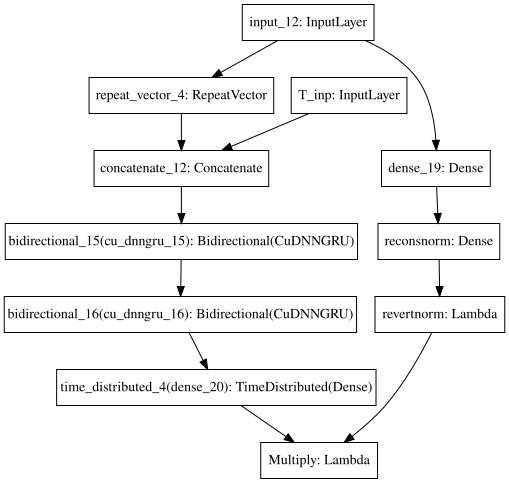

In [23]:
##### INPUTS ENCODER ######
x_lc = Input(shape = (T, channels) , name="LC_inp")
x_t = Input(shape = (T, 1) , name ="T_inp")
s_lc = Input(shape= (1,), name="scale_inp") #para pesar loss
x_lc_s = Lambda(Div_L, name="Divide")([x_lc, s_lc]) #NEW: quitar escala del dato (o escalar a una version normal)

##### CODIFY LIGHT CURVE ######
x = Concatenate(axis=-1)([x_t, x_lc_s]) 
f1 = Bidirectional(CuDNNGRU(64, return_sequences=True))(x)
f1 = Bidirectional(CuDNNGRU(64, return_sequences=False))(f1) 

##### CODIFY SCALE AND CONCATENATE ######
f1_s = Lambda(Norm_L, arguments={'mu':Slog_mu,'std':Slog_std}, name="norm")(s_lc) #mas capas?
f1_s = Dense(1, activation='tanh')(f1_s) #o tanh

f1 = Concatenate(axis=-1)([f1, f1_s]) #NEW: agregar escala a codificar

##### GET THE LATENT VARIABLE ######
z_mean = Dense(latent_dim,activation='linear')(f1)
z_log_var = Dense(latent_dim,activation='linear')(f1)
encoder = Model([x_t, x_lc, s_lc], [z_mean,z_log_var], name="encoder")
samp_model = define_samp_model(latent_dim) #model to sample


##### INPUTS DECODER ######
decoder_input = Input(shape=(latent_dim,))

##### RECONSTRCT SCALE ######
s_out = Dense(1, activation='tanh')(decoder_input)
s_out = Dense(1, activation='linear', name="reconsnorm")(s_out) #NEW: aprende s 
s_out = Lambda(RevertNorm_L, arguments={'mu':Slog_mu,'std':Slog_std},name="revertnorm")(s_out) #NEW: volver a escala normal 
s_hat = Model(decoder_input, s_out)(samp_model(encoder([x_t, x_lc, s_lc])))
S_model = Model([x_t, x_lc, s_lc], s_hat)

##### RECONSTRUCT LIGHT CURVE ######
decode = RepeatVector(T)(decoder_input)
decode = Concatenate(axis=-1)([x_t, decode]) #add time decode
decode = Bidirectional(CuDNNGRU(64, return_sequences=True))(decode) #bidirectional
decode = Bidirectional(CuDNNGRU(64, return_sequences=True))(decode) #bidirectional

decode = TimeDistributed(Dense(1, activation='linear'))(decode)
decode = Lambda(Mul_L, name="Multiply")([decode, s_out]) #NEW: recuperar escala de dato (multiplicar por std)
generator = Model([x_t, decoder_input], decode, name="generator")


##### VAE MODEL ######
out = generator([x_t, samp_model(encoder([x_t, x_lc, s_lc])) ])
vae = Model([x_t, x_lc, s_lc], out)

#define loss functions over model components
smse_LC = SMSE_loss(s_lc)
mse_S = MSLE_scale_loss(s_lc, s_hat) 
kl_loss = KL_loss(z_mean, z_log_var)

def Wvae_loss(y_true, y_pred):    
    return smse_LC(y_true, y_pred) + l*kl_loss(y_true, y_pred) +0.1*mse_S(y_true, y_pred)

vae.compile(optimizer='adam', loss=Wvae_loss, metrics = [smse_LC,kl_loss, mse_S])
vae.summary()

#vae.get_layer("encoder").load_weights("./models/VAEscaleLow_S_%dT_%dD_%de_E.h5"%(T,latent_dim,400))
#vae.get_layer("generator").load_weights("./models/VAEscaleLow_S_%dT_%dD_%de_D.h5"%(T,latent_dim,400))

SVG(model_to_dot(generator).create(prog='dot', format='svg'))

In [16]:
hist = vae.fit([X_train_t, X_train, S_train], X_train, epochs=EPOCHS, batch_size=BATCH_s)

Epoch 1/400
8634/8634 [==============================] - 33s 4ms/step - loss: 1.2376 - SMSE: 1.0981 - KL: 3.4807 - MSLE_scale: 1.3604
Epoch 2/400
8634/8634 [==============================] - 26s 3ms/step - loss: 1.1417 - SMSE: 1.0186 - KL: 1.3042 - MSLE_scale: 1.2171
Epoch 3/400
8634/8634 [==============================] - 27s 3ms/step - loss: 1.1182 - SMSE: 1.0177 - KL: 3.4440 - MSLE_scale: 0.9705
Epoch 4/400
8634/8634 [==============================] - 27s 3ms/step - loss: 1.0858 - SMSE: 1.0075 - KL: 4.9755 - MSLE_scale: 0.7328
Epoch 5/400
8634/8634 [==============================] - 27s 3ms/step - loss: 1.0722 - SMSE: 1.0037 - KL: 5.3199 - MSLE_scale: 0.6315
Epoch 6/400
8634/8634 [==============================] - 27s 3ms/step - loss: 1.0594 - SMSE: 1.0027 - KL: 6.4431 - MSLE_scale: 0.5031
Epoch 7/400
8634/8634 [==============================] - 28s 3ms/step - loss: 1.0539 - SMSE: 1.0028 - KL: 5.8793 - MSLE_scale: 0.4517
Epoch 8/400
8634/8634 [==============================] - 27s 3

8634/8634 [==============================] - 26s 3ms/step - loss: 0.7402 - SMSE: 0.7253 - KL: 11.9159 - MSLE_scale: 0.0299
Epoch 122/400
8634/8634 [==============================] - 28s 3ms/step - loss: 0.7433 - SMSE: 0.7283 - KL: 12.3526 - MSLE_scale: 0.0264
Epoch 123/400
8634/8634 [==============================] - 27s 3ms/step - loss: 0.7490 - SMSE: 0.7346 - KL: 12.0856 - MSLE_scale: 0.0225
Epoch 124/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7492 - SMSE: 0.7354 - KL: 11.7383 - MSLE_scale: 0.0202
Epoch 125/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7656 - SMSE: 0.7515 - KL: 11.5810 - MSLE_scale: 0.0255
Epoch 126/400
8634/8634 [==============================] - 27s 3ms/step - loss: 0.7411 - SMSE: 0.7271 - KL: 11.9521 - MSLE_scale: 0.0204
Epoch 127/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7313 - SMSE: 0.7174 - KL: 11.7455 - MSLE_scale: 0.0213
Epoch 128/400
8634/8634 [==============================

8634/8634 [==============================] - 26s 3ms/step - loss: 0.7898 - SMSE: 0.7730 - KL: 11.9947 - MSLE_scale: 0.0481
Epoch 240/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.7503 - SMSE: 0.7356 - KL: 12.1328 - MSLE_scale: 0.0253
Epoch 241/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7296 - SMSE: 0.7149 - KL: 12.3424 - MSLE_scale: 0.0240
Epoch 242/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.7433 - SMSE: 0.7285 - KL: 12.5677 - MSLE_scale: 0.0219
Epoch 243/400
8634/8634 [==============================] - 25s 3ms/step - loss: 0.6915 - SMSE: 0.6772 - KL: 12.2870 - MSLE_scale: 0.0199
Epoch 244/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7278 - SMSE: 0.7138 - KL: 11.9998 - MSLE_scale: 0.0203
Epoch 245/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7310 - SMSE: 0.7165 - KL: 12.1392 - MSLE_scale: 0.0231
Epoch 246/400
8634/8634 [==============================

8634/8634 [==============================] - 26s 3ms/step - loss: 0.7270 - SMSE: 0.7112 - KL: 12.9044 - MSLE_scale: 0.0283
Epoch 358/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7569 - SMSE: 0.7403 - KL: 13.6723 - MSLE_scale: 0.0298
Epoch 359/400
8634/8634 [==============================] - 27s 3ms/step - loss: 0.7293 - SMSE: 0.7130 - KL: 13.2727 - MSLE_scale: 0.0303
Epoch 360/400
8634/8634 [==============================] - 27s 3ms/step - loss: 0.7490 - SMSE: 0.7341 - KL: 12.9147 - MSLE_scale: 0.0200
Epoch 361/400
8634/8634 [==============================] - 27s 3ms/step - loss: 0.6751 - SMSE: 0.6601 - KL: 13.2348 - MSLE_scale: 0.0181
Epoch 362/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7194 - SMSE: 0.7045 - KL: 12.8845 - MSLE_scale: 0.0205
Epoch 363/400
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7325 - SMSE: 0.7175 - KL: 12.9935 - MSLE_scale: 0.0205
Epoch 364/400
8634/8634 [==============================

/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


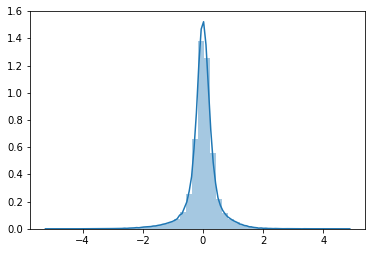

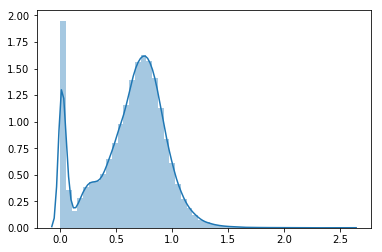

In [17]:
z_aux, z_var_aux = encoder.predict([X_train_t,X_train, S_train], batch_size=512)

sns.distplot(z_aux.flatten())
plt.show()
sns.distplot(np.exp(z_var_aux.flatten()))
plt.show()

----- EVALUANDO RECONSTRUCCION DE LA CURVA -----


/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


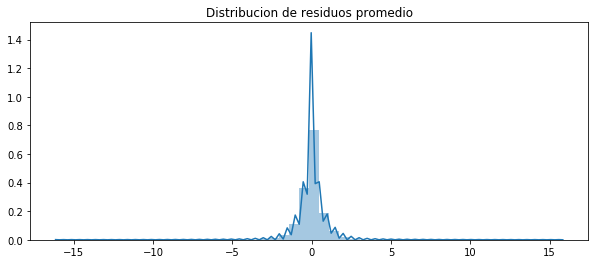

------------- Error -------------
RMSE (+-) =  0.6886044370602805
MAE  (+-) =  0.4821491070020168
------------- Smoothness -------------
AutoCorr lag-one =  0.6064027728923207
Diff MEAN =  0.07757293424452172
------------- Residual -------------
AutoCorr lag-one =  -0.04960860915201043
Permutation H =  0.9955791889633716
Spectral H =  0.8994862736520525
---------------------------------------
MSE de escala escalado=  0.2334101274849772


array([[1.0489828e-03],
       [4.7135352e-05],
       [1.3084722e-05],
       ...,
       [5.9733909e-05],
       [2.0036268e-05],
       [7.3932737e-05]], dtype=float32)

In [35]:
X_train_hat = vae.predict([X_train_t[:N], X_train[:N], S_train[:N]], batch_size=512)
evaluate_reconst(X_train[:N]/S_train[:N,None,:], X_train_hat/S_train[:N,None,:])

S_train_hat = S_model.predict([X_train_t[:N],X_train[:N], S_train[:N]], batch_size=512)
print("MSE de escala escalado= ",mean_squared_error(S_train[:N], S_train_hat)*(1/S_std)**2)
S_train_hat ## no predice valores negativos

Real scale = 0.000036
Pred scale = 0.000038


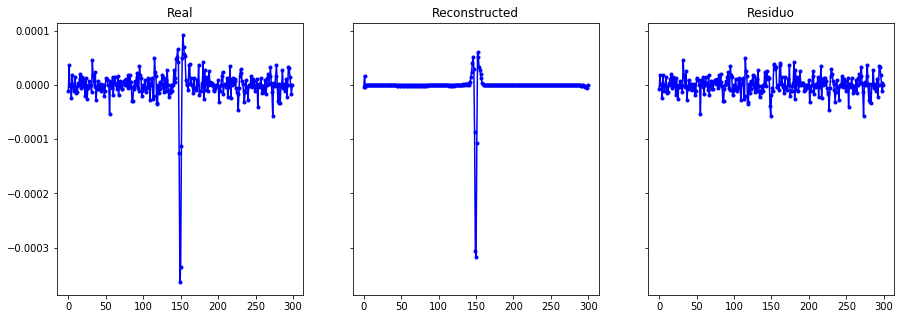

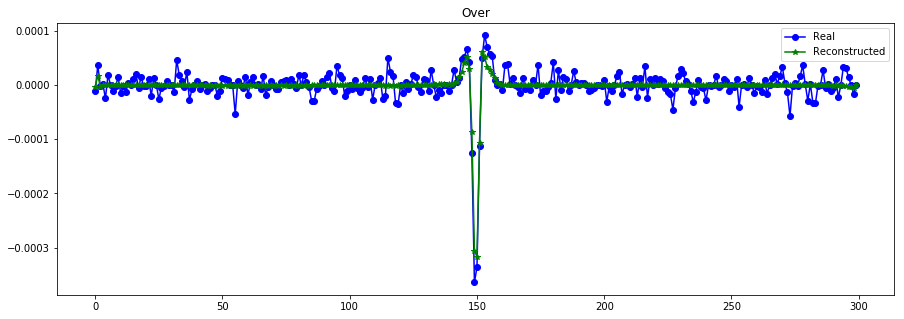

----------------------------------------------------------------
Real scale = 0.000015
Pred scale = 0.000015


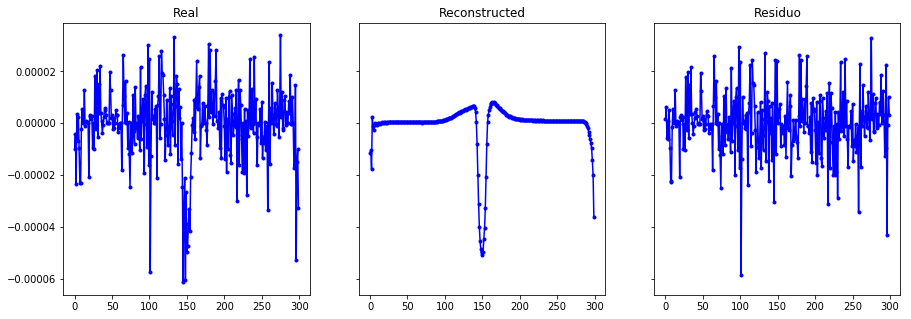

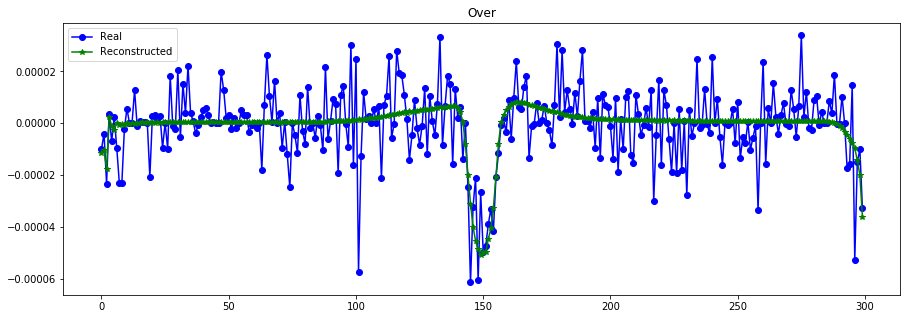

----------------------------------------------------------------
Real scale = 0.000111
Pred scale = 0.000134


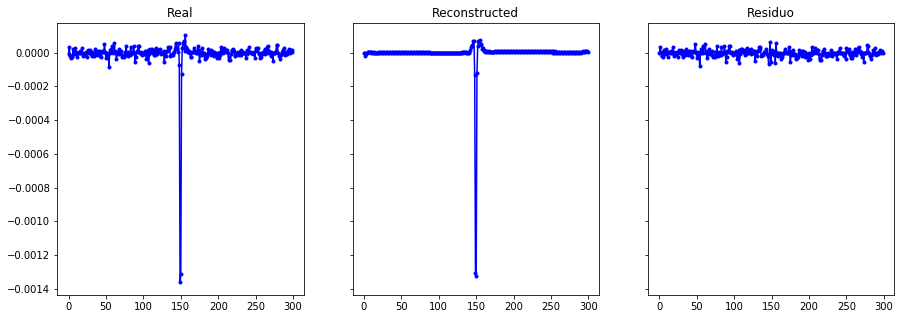

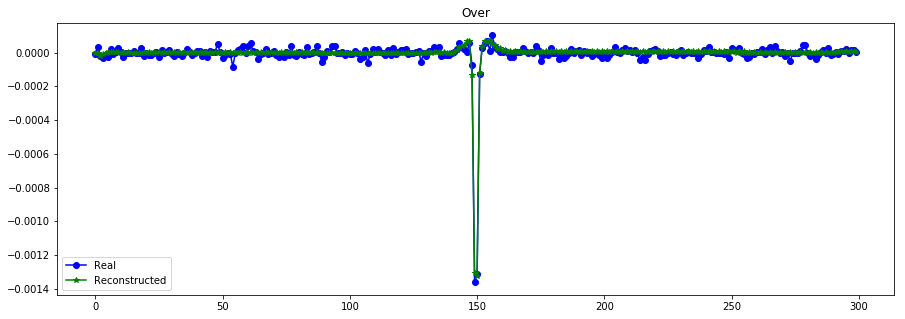

----------------------------------------------------------------
Real scale = 0.000016
Pred scale = 0.000016


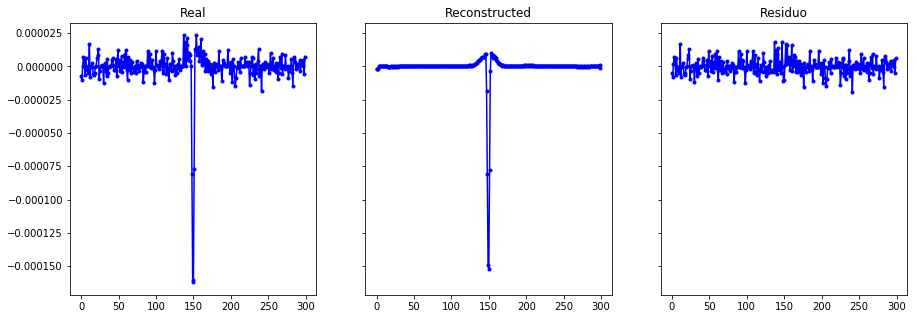

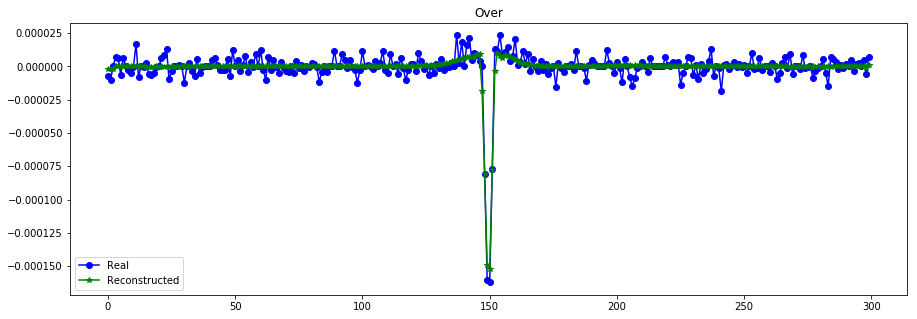

----------------------------------------------------------------
Real scale = 0.000009
Pred scale = 0.000009


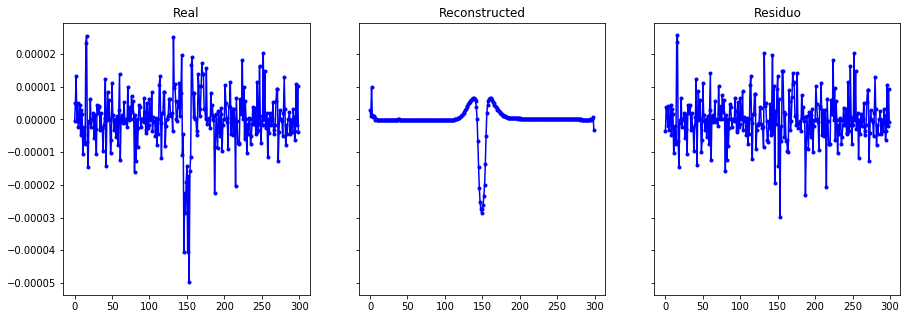

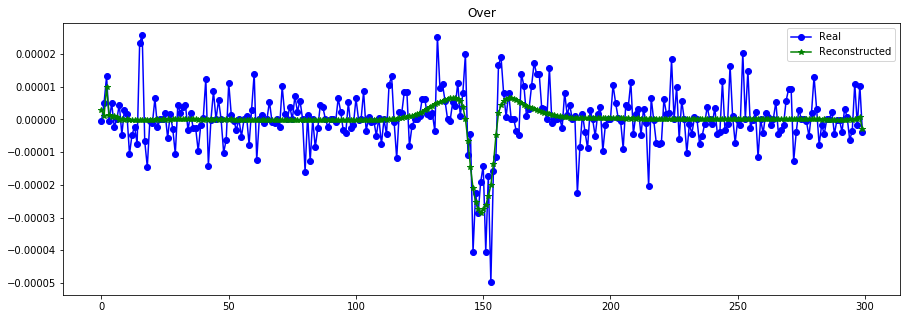

----------------------------------------------------------------
Real scale = 0.000040
Pred scale = 0.000040


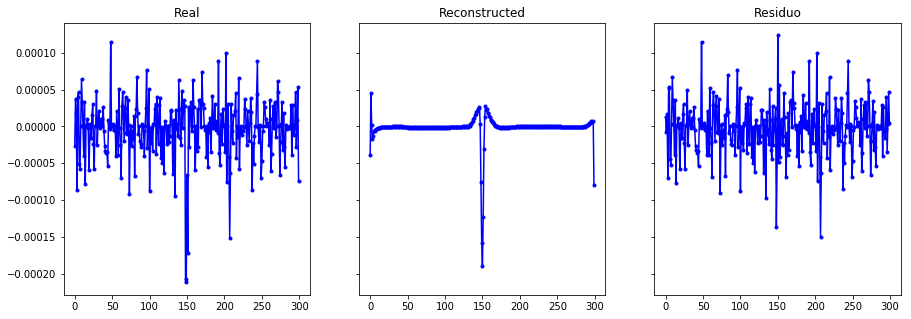

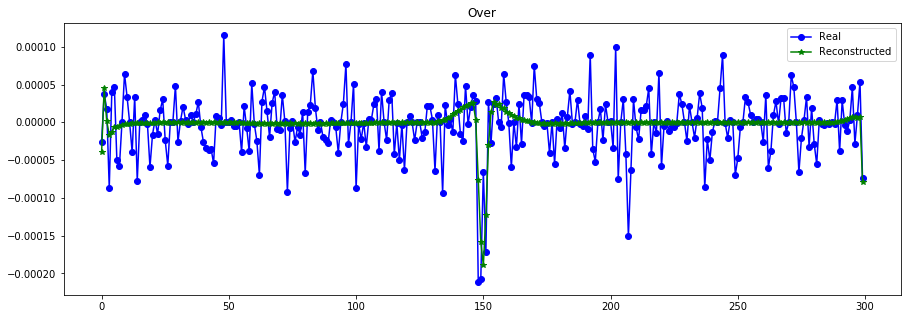

----------------------------------------------------------------
Real scale = 0.000127
Pred scale = 0.000156


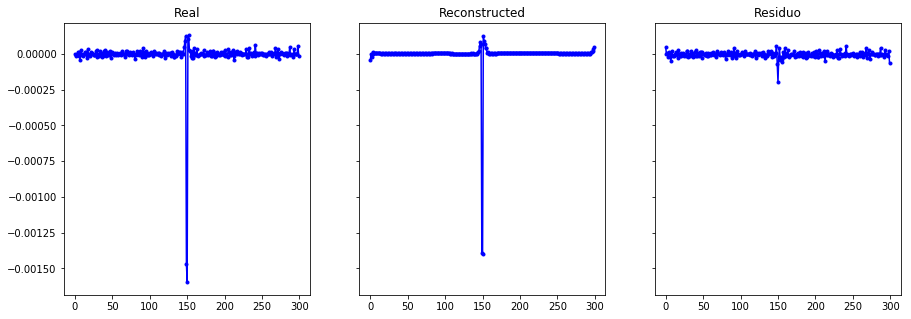

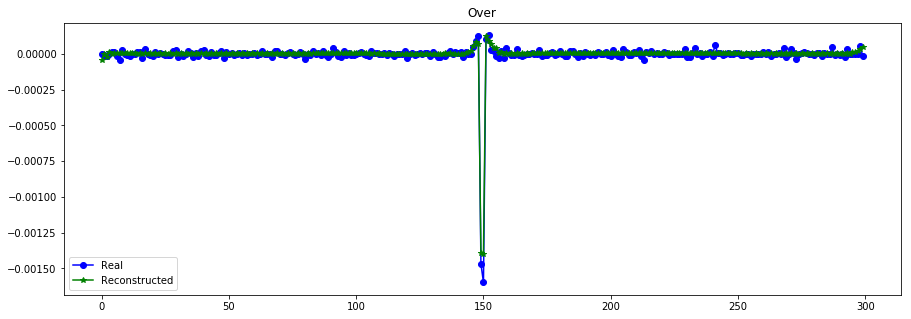

----------------------------------------------------------------
Real scale = 0.000012
Pred scale = 0.000013


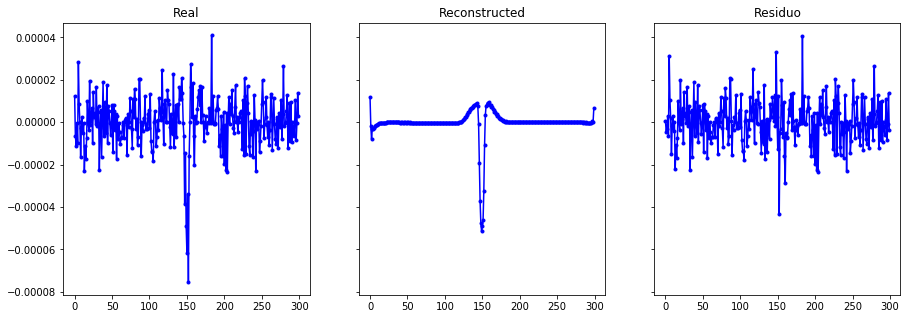

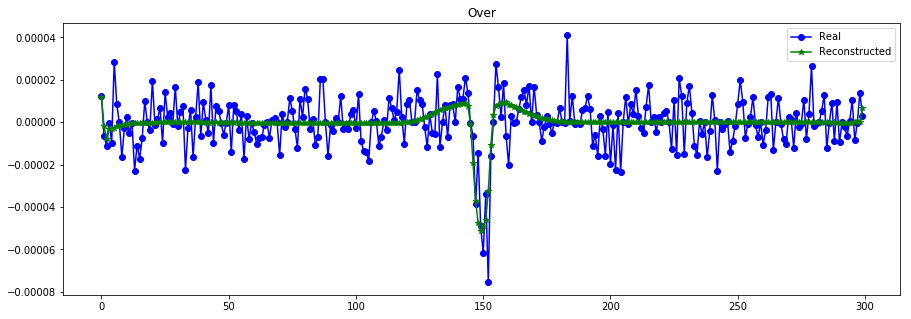

----------------------------------------------------------------
Real scale = 0.000421
Pred scale = 0.000393


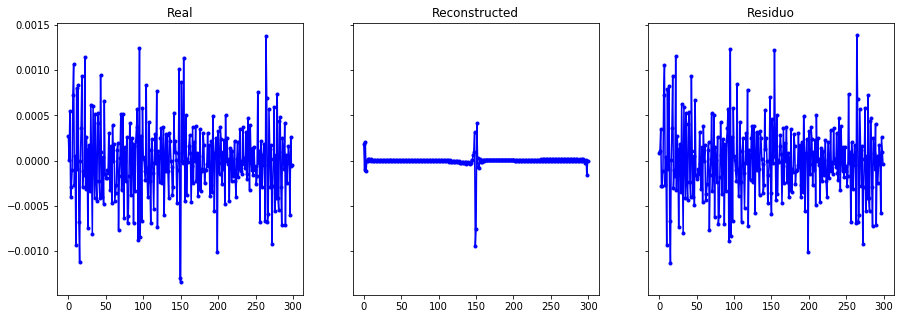

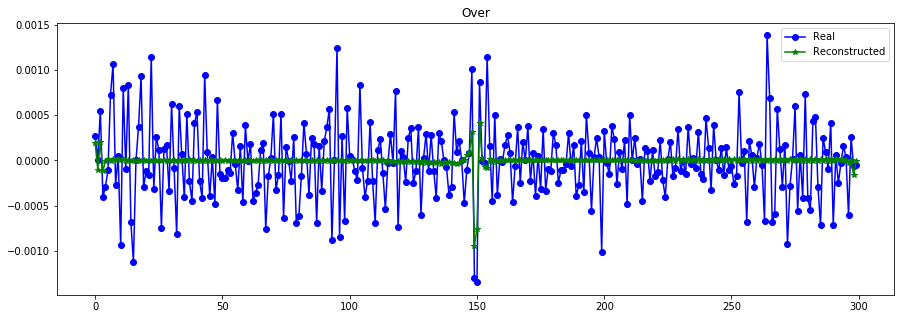

----------------------------------------------------------------
Real scale = 0.000039
Pred scale = 0.000036


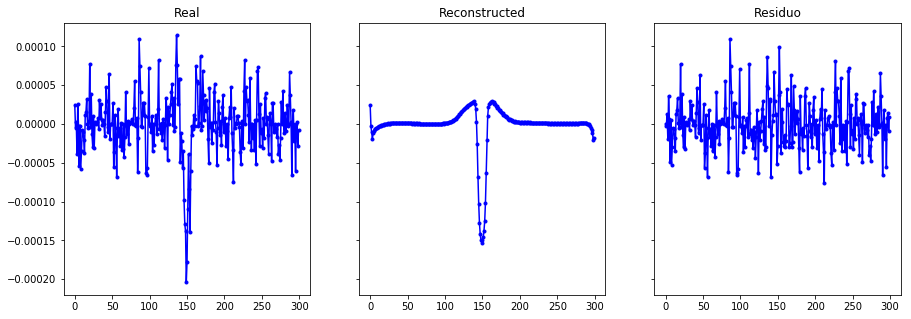

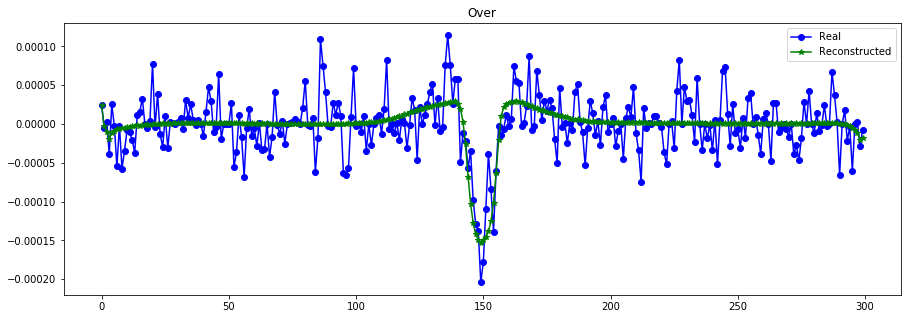

----------------------------------------------------------------
Real scale = 0.000035
Pred scale = 0.000032


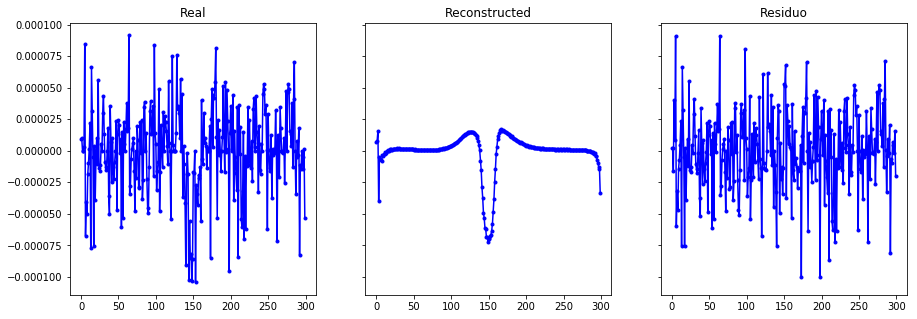

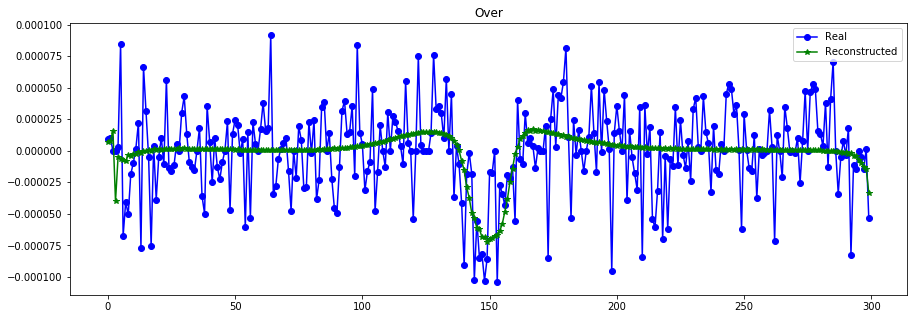

----------------------------------------------------------------
Real scale = 0.000004
Pred scale = 0.000005


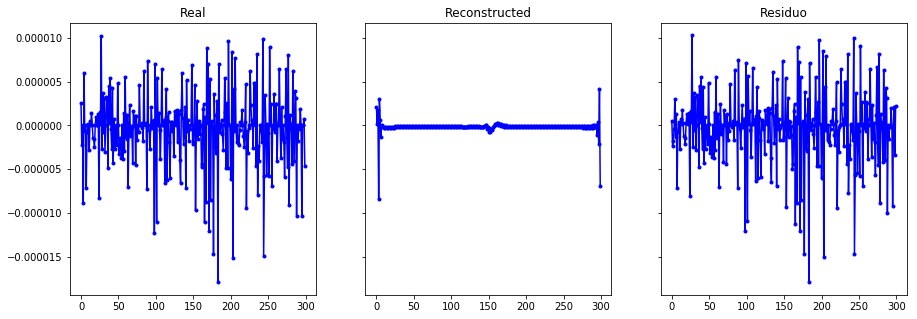

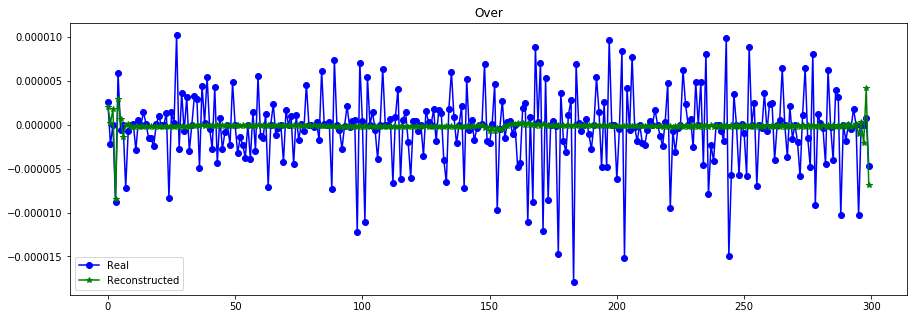

----------------------------------------------------------------
Real scale = 0.000049
Pred scale = 0.000057


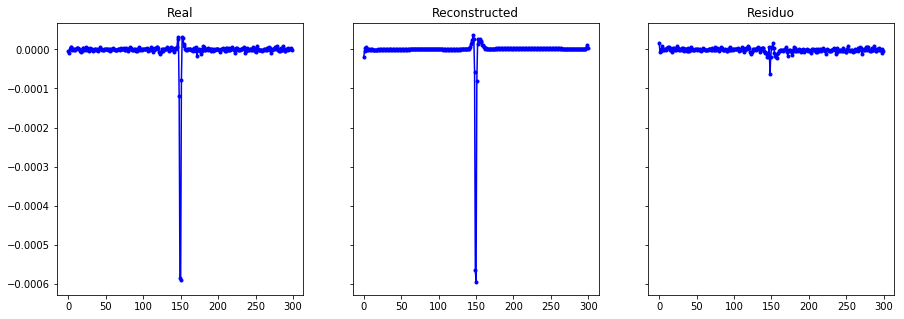

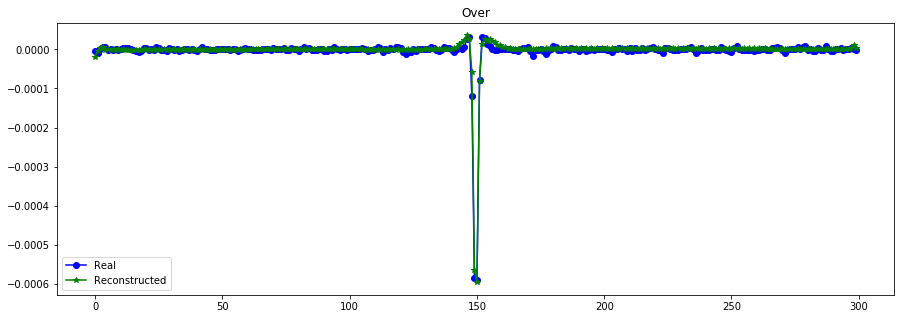

----------------------------------------------------------------
Real scale = 0.000037
Pred scale = 0.000043


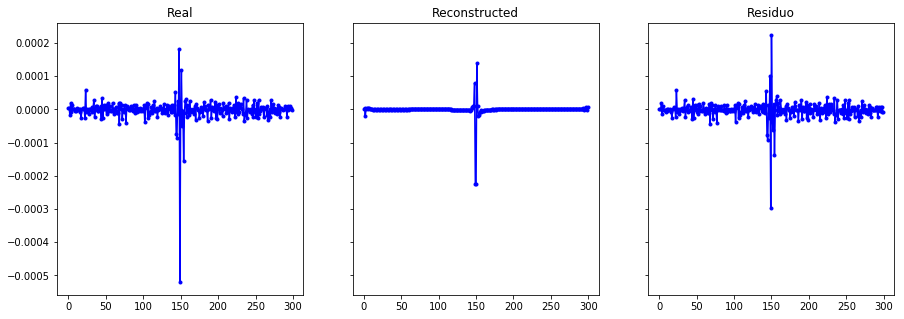

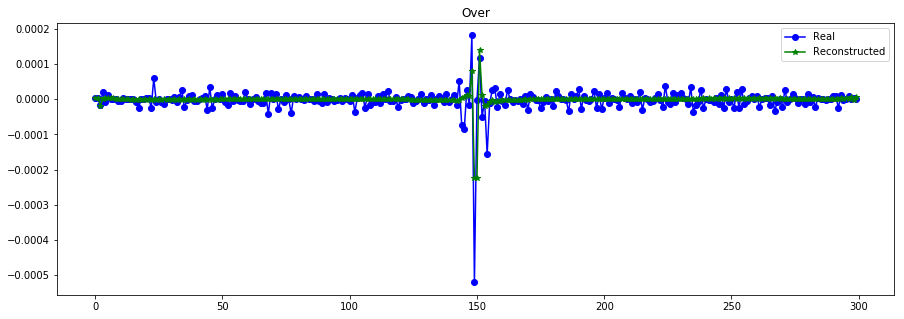

----------------------------------------------------------------
Real scale = 0.000045
Pred scale = 0.000046


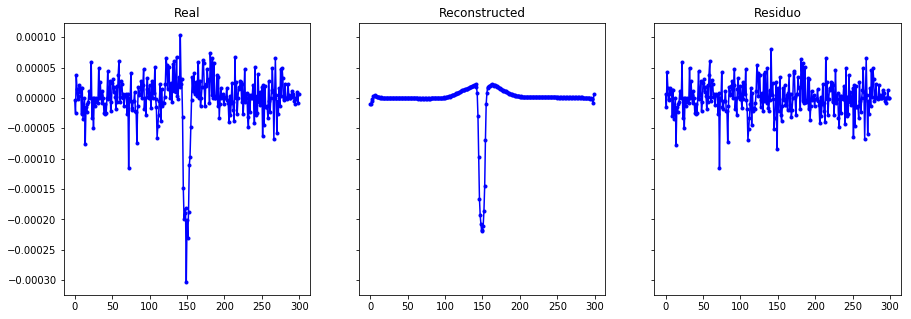

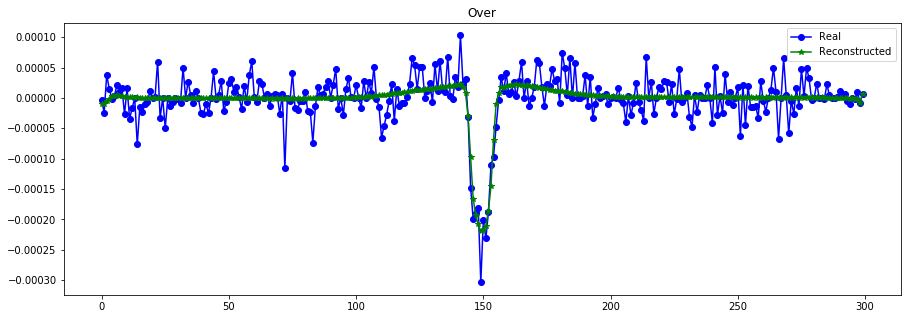

----------------------------------------------------------------


In [19]:
plot_n_lc(X_train[:N,:,0], X_train_hat, n= 15, s=[S_train[:N],S_train_hat]) #

In [20]:
vae.get_layer("encoder").save_weights("./models/VAEscaleLow_S_%dT_%dD_%de_E.h5"%(T,latent_dim,400))
vae.get_layer("generator").save_weights("./models/VAEscaleLow_S_%dT_%dD_%de_D.h5"%(T,latent_dim,400))

In [18]:
hist = vae.fit([X_train_t, X_train, S_train], X_train, epochs=400, batch_size=batch_size)

Epoch 1/400
8634/8634 [==============================] - 24s 3ms/step - loss: 1.2621 - SMSE: 1.1029 - KL: 1.6911 - MSLE_scale: 1.5753
Epoch 2/400
8634/8634 [==============================] - 17s 2ms/step - loss: 1.1481 - SMSE: 1.0146 - KL: 0.7714 - MSLE_scale: 1.3267
Epoch 3/400
8634/8634 [==============================] - 18s 2ms/step - loss: 1.1155 - SMSE: 1.0080 - KL: 5.0362 - MSLE_scale: 1.0253
Epoch 4/400
8634/8634 [==============================] - 17s 2ms/step - loss: 1.0898 - SMSE: 1.0027 - KL: 9.1982 - MSLE_scale: 0.7793
Epoch 5/400
8634/8634 [==============================] - 17s 2ms/step - loss: 1.0835 - SMSE: 1.0030 - KL: 8.4104 - MSLE_scale: 0.7205
Epoch 6/400
8634/8634 [==============================] - 17s 2ms/step - loss: 1.0786 - SMSE: 1.0025 - KL: 7.4973 - MSLE_scale: 0.6858
Epoch 7/400
8634/8634 [==============================] - 17s 2ms/step - loss: 1.0786 - SMSE: 1.0026 - KL: 7.6243 - MSLE_scale: 0.6836
Epoch 8/400
8634/8634 [==============================] - 17s 2

8634/8634 [==============================] - 18s 2ms/step - loss: 0.7606 - SMSE: 0.7431 - KL: 15.3174 - MSLE_scale: 0.0218
Epoch 122/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.7527 - SMSE: 0.7349 - KL: 15.4334 - MSLE_scale: 0.0240
Epoch 123/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.7613 - SMSE: 0.7438 - KL: 15.3048 - MSLE_scale: 0.0221
Epoch 124/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.7621 - SMSE: 0.7445 - KL: 15.3348 - MSLE_scale: 0.0226
Epoch 125/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.7481 - SMSE: 0.7305 - KL: 15.2612 - MSLE_scale: 0.0228
Epoch 126/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.7611 - SMSE: 0.7439 - KL: 15.2339 - MSLE_scale: 0.0194
Epoch 127/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.7768 - SMSE: 0.7594 - KL: 14.6025 - MSLE_scale: 0.0270
Epoch 128/400
8634/8634 [==============================

8634/8634 [==============================] - 18s 2ms/step - loss: 0.7119 - SMSE: 0.6963 - KL: 14.0462 - MSLE_scale: 0.0156
Epoch 240/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.7194 - SMSE: 0.7037 - KL: 14.0823 - MSLE_scale: 0.0163
Epoch 241/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.7243 - SMSE: 0.7088 - KL: 14.0777 - MSLE_scale: 0.0141
Epoch 242/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.7121 - SMSE: 0.6963 - KL: 14.2370 - MSLE_scale: 0.0153
Epoch 243/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.7101 - SMSE: 0.6947 - KL: 13.8168 - MSLE_scale: 0.0161
Epoch 244/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.7204 - SMSE: 0.7050 - KL: 14.0515 - MSLE_scale: 0.0138
Epoch 245/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.7235 - SMSE: 0.7080 - KL: 13.9770 - MSLE_scale: 0.0154
Epoch 246/400
8634/8634 [==============================

8634/8634 [==============================] - 17s 2ms/step - loss: 0.6921 - SMSE: 0.6761 - KL: 14.4836 - MSLE_scale: 0.0151
Epoch 358/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.7566 - SMSE: 0.7394 - KL: 13.8894 - MSLE_scale: 0.0330
Epoch 359/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.7182 - SMSE: 0.7022 - KL: 14.4204 - MSLE_scale: 0.0156
Epoch 360/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.7319 - SMSE: 0.7165 - KL: 13.7935 - MSLE_scale: 0.0167
Epoch 361/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.7157 - SMSE: 0.7002 - KL: 13.9684 - MSLE_scale: 0.0151
Epoch 362/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.6847 - SMSE: 0.6686 - KL: 14.6323 - MSLE_scale: 0.0144
Epoch 363/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.7173 - SMSE: 0.7010 - KL: 14.1983 - MSLE_scale: 0.0213
Epoch 364/400
8634/8634 [==============================

/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


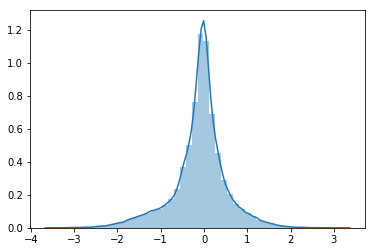

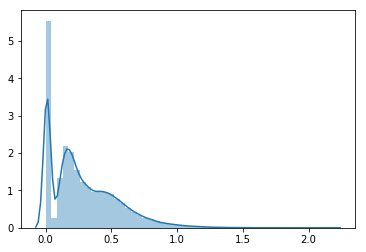

In [19]:
z_aux, z_var_aux = encoder.predict([X_train_t,X_train, S_train], batch_size=512)

sns.distplot(z_aux.flatten())
plt.show()
sns.distplot(np.exp(z_var_aux.flatten()))
plt.show()

----- EVALUANDO RECONSTRUCCION DE LA CURVA -----


/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


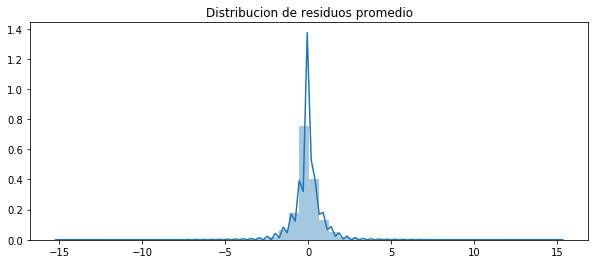

------------- Error -------------
RMSE (+-) =  0.7571971796138021
MAE  (+-) =  0.49717420541098567
------------- Smoothness -------------
AutoCorr lag-one =  0.6930625008227665
Diff MEAN =  0.05220103074831906
------------- Residual -------------
AutoCorr lag-one =  -0.007083657006924288
Permutation H =  0.9957190518957035
Spectral H =  0.8980032201488253
---------------------------------------
MSE de escala escalado=  0.31851598151016314


array([[1.0648126e-03],
       [3.9718452e-05],
       [1.1840975e-05],
       ...,
       [6.7898800e-05],
       [2.0197343e-05],
       [6.9587237e-05]], dtype=float32)

In [20]:
X_train_hat = vae.predict([X_train_t[:N], X_train[:N], S_train[:N]], batch_size=512)
evaluate_reconst(X_train[:N]/S_train[:N,None,:], X_train_hat/S_train[:N,None,:])

S_train_hat = S_model.predict([X_train_t[:N],X_train[:N], S_train[:N]], batch_size=512)
print("MSE de escala escalado= ",mean_squared_error(S_train[:N], S_train_hat)*(1/S_std)**2)
S_train_hat ## no predice valores negativos

Real scale = 0.000016
Pred scale = 0.000015


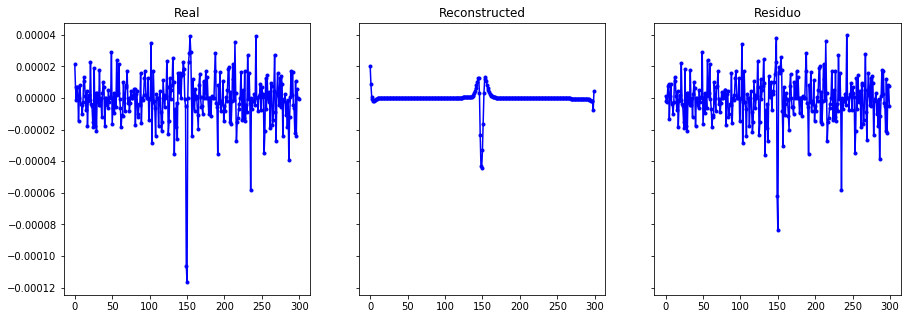

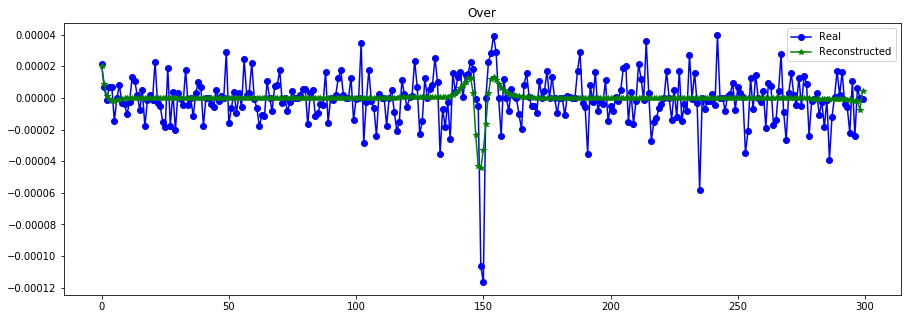

----------------------------------------------------------------
Real scale = 0.000083
Pred scale = 0.000091


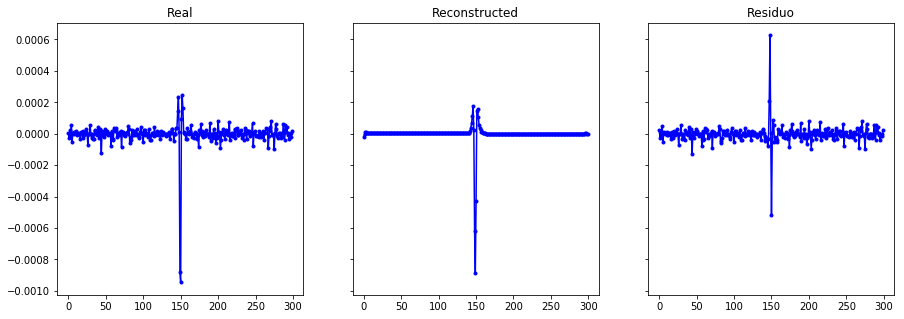

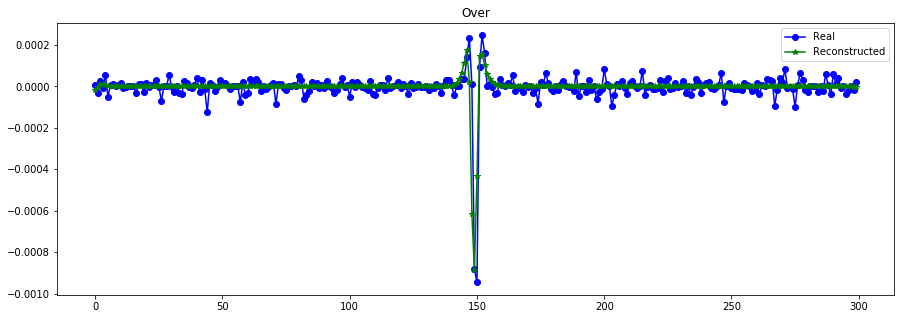

----------------------------------------------------------------
Real scale = 0.000091
Pred scale = 0.000091


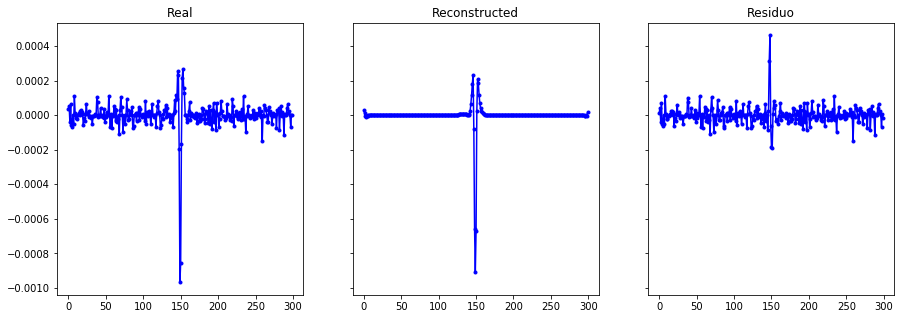

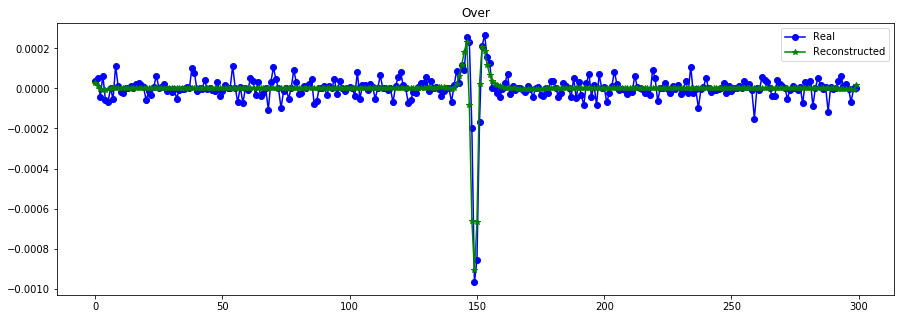

----------------------------------------------------------------
Real scale = 0.000084
Pred scale = 0.000094


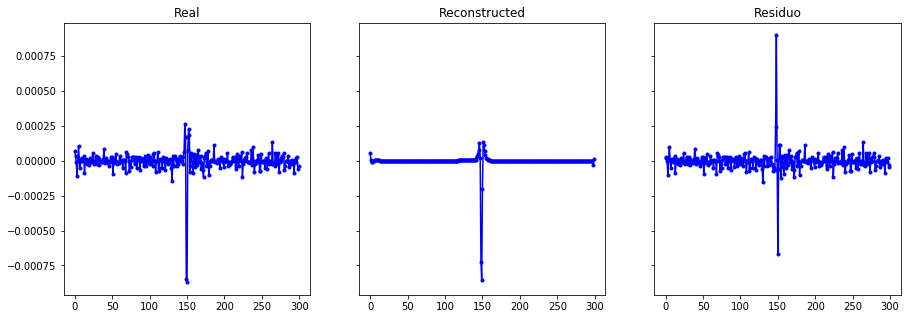

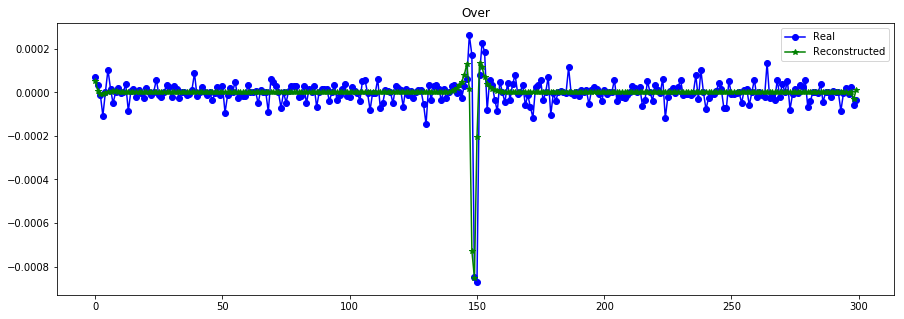

----------------------------------------------------------------
Real scale = 0.000036
Pred scale = 0.000032


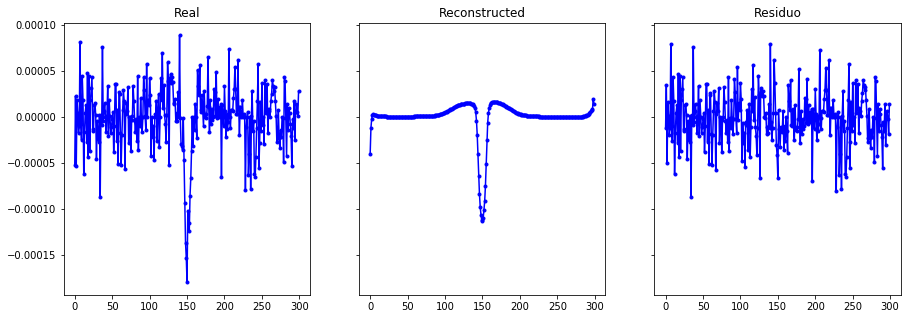

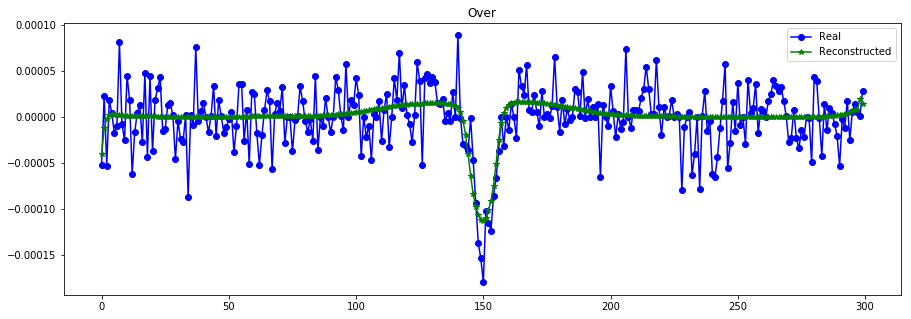

----------------------------------------------------------------
Real scale = 0.000027
Pred scale = 0.000024


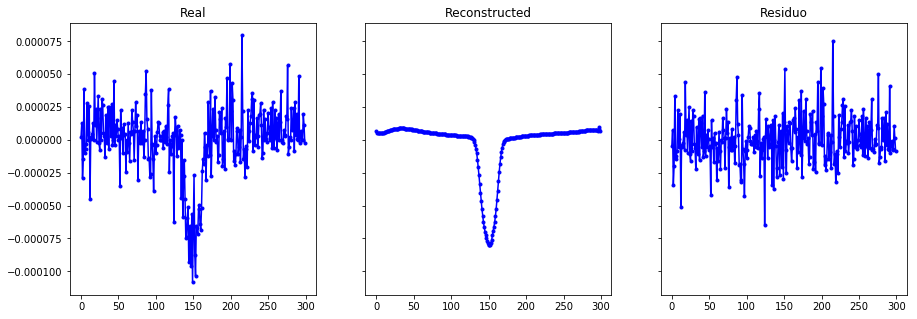

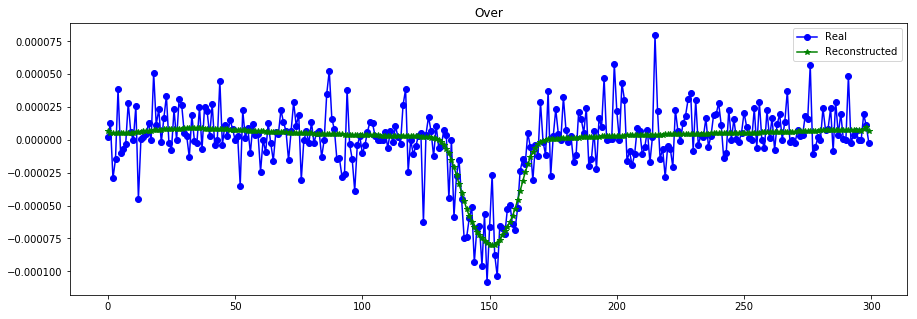

----------------------------------------------------------------
Real scale = 0.000067
Pred scale = 0.000066


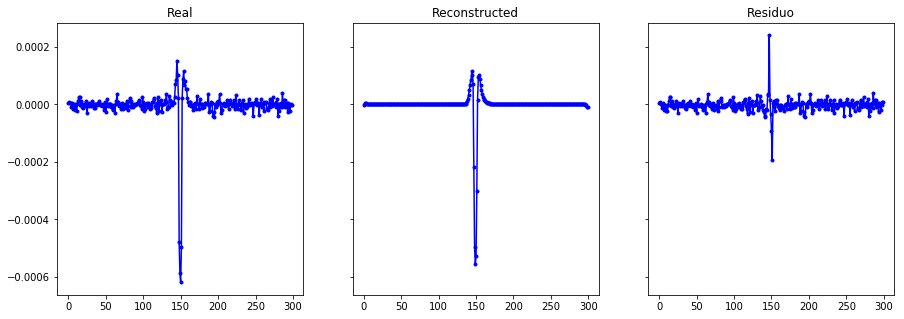

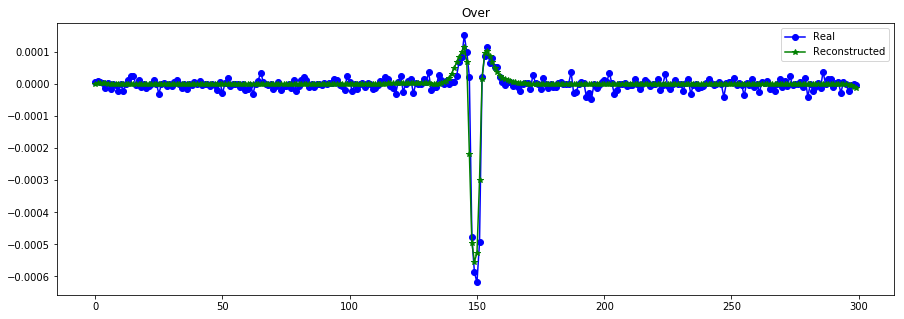

----------------------------------------------------------------
Real scale = 0.000054
Pred scale = 0.000050


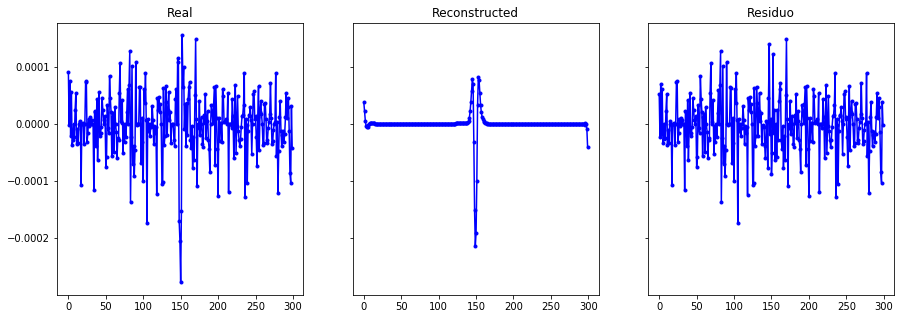

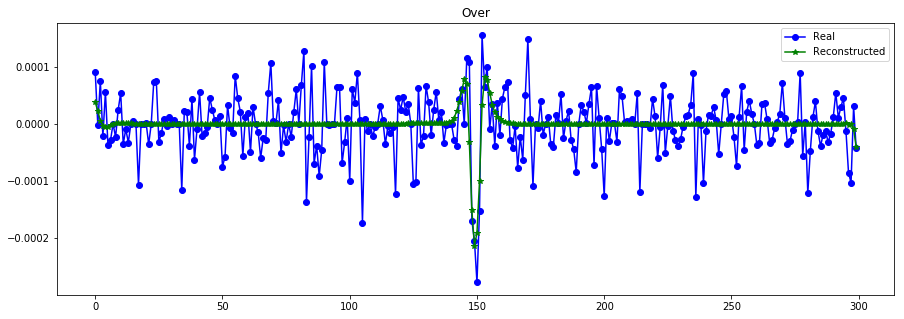

----------------------------------------------------------------
Real scale = 0.000102
Pred scale = 0.000115


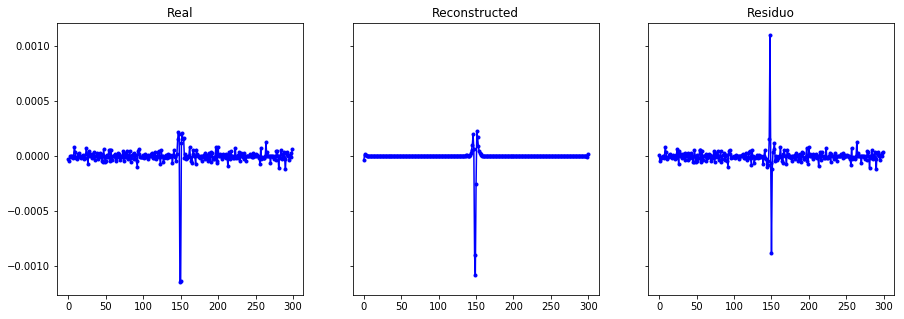

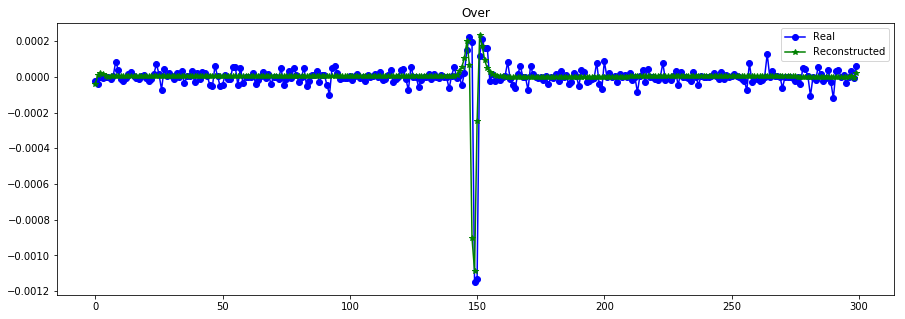

----------------------------------------------------------------
Real scale = 0.000069
Pred scale = 0.000072


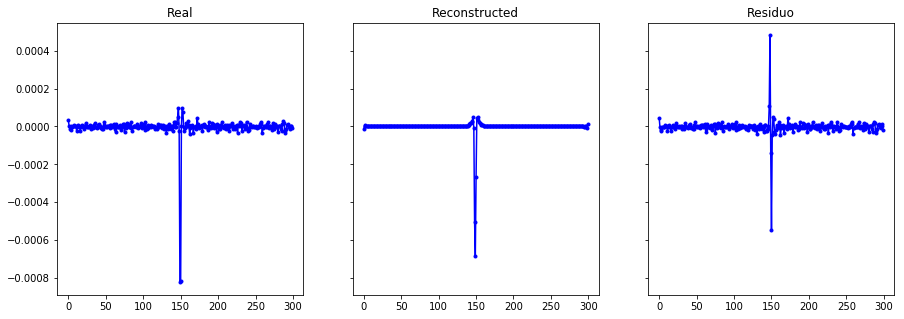

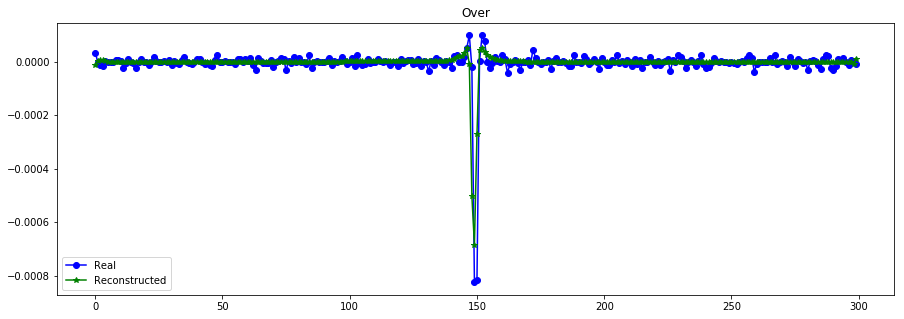

----------------------------------------------------------------
Real scale = 0.000125
Pred scale = 0.000125


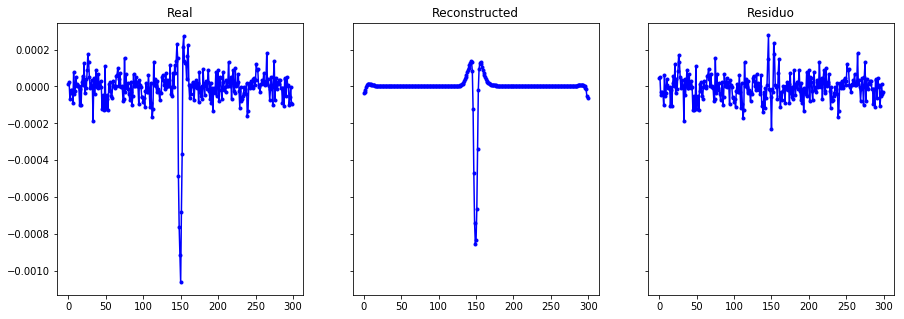

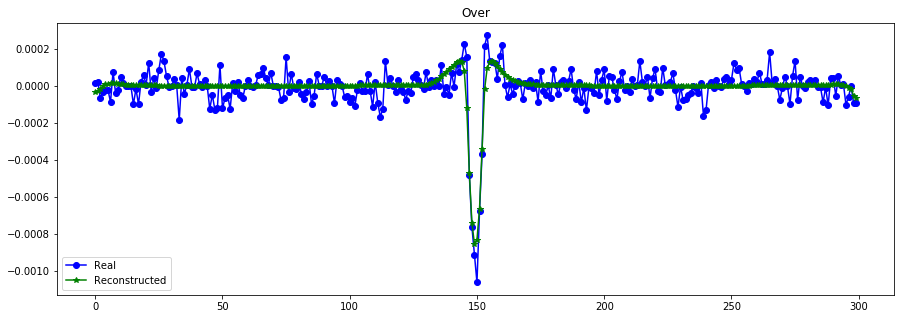

----------------------------------------------------------------
Real scale = 0.000034
Pred scale = 0.000033


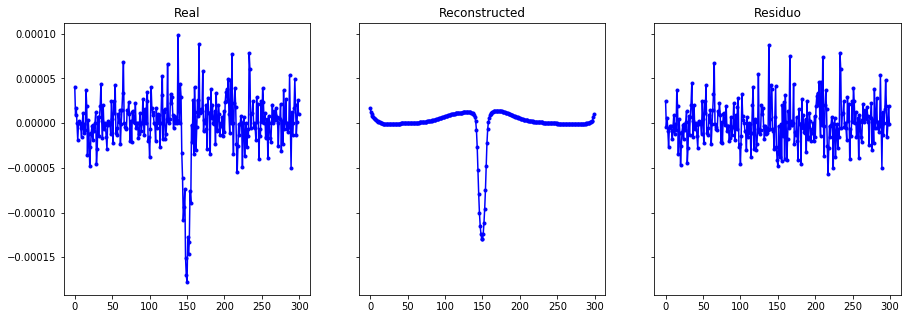

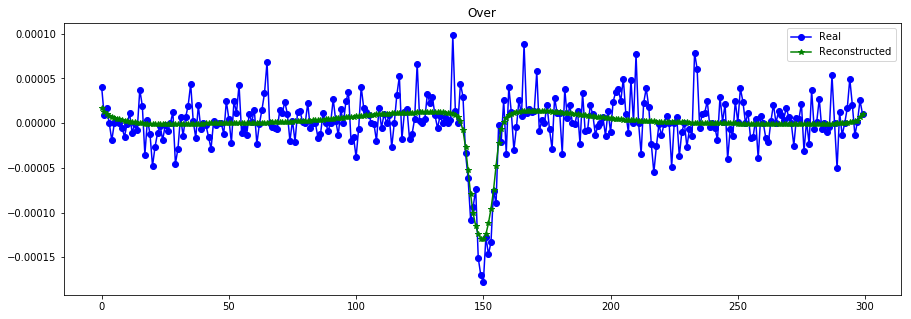

----------------------------------------------------------------
Real scale = 0.000012
Pred scale = 0.000012


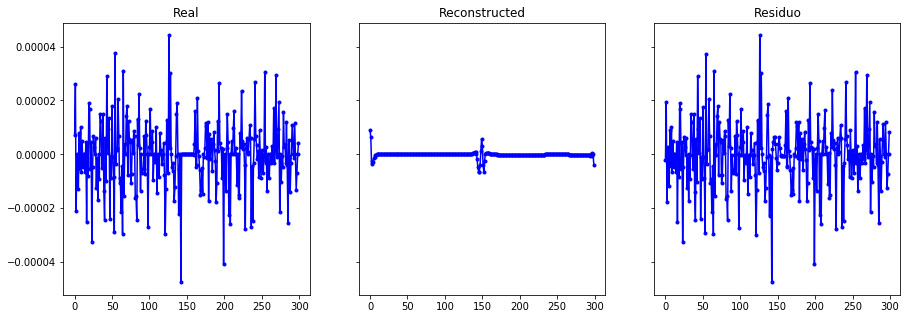

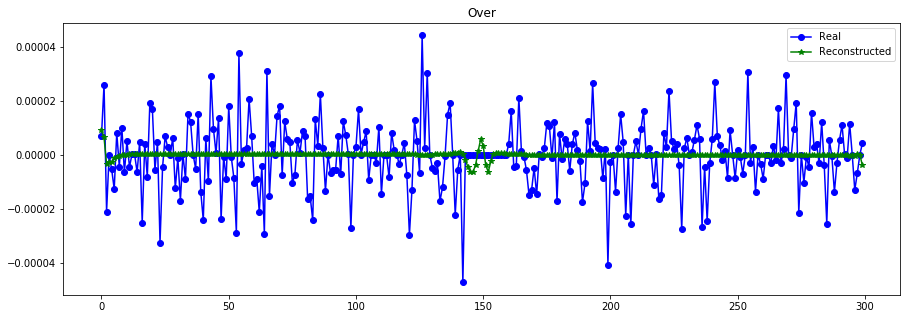

----------------------------------------------------------------
Real scale = 0.000011
Pred scale = 0.000010


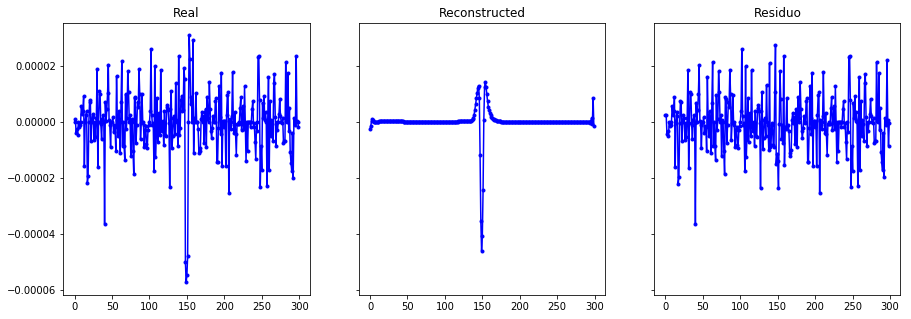

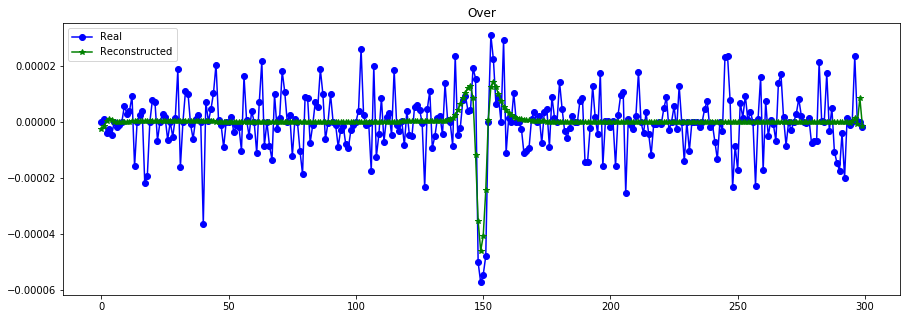

----------------------------------------------------------------
Real scale = 0.000009
Pred scale = 0.000008


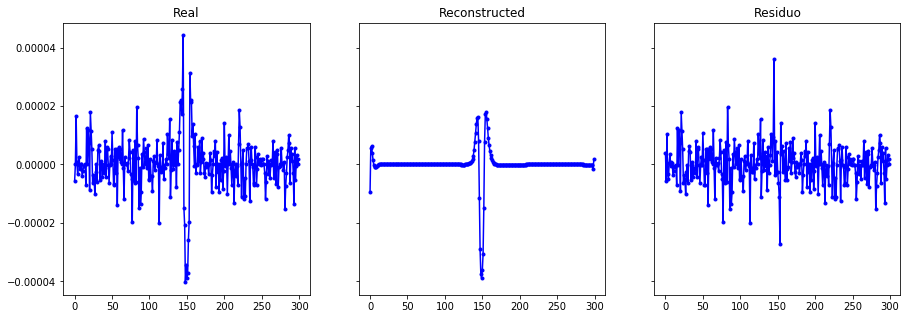

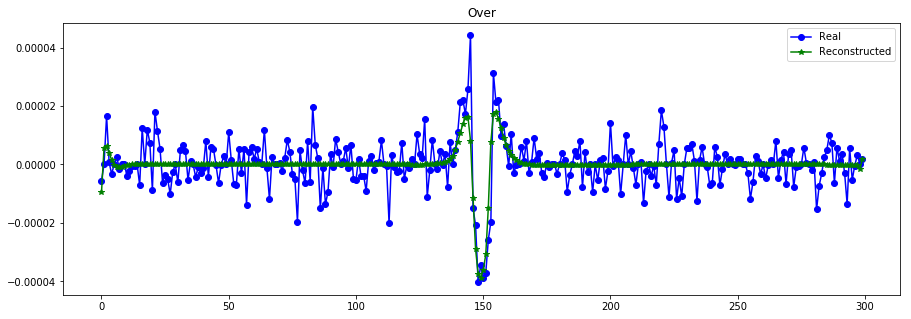

----------------------------------------------------------------


In [21]:
plot_n_lc(X_train[:N,:,0], X_train_hat, n= 15, s=[S_train[:N],S_train_hat]) #

In [22]:
vae.get_layer("encoder").save_weights("./models/VAEscaleLow_S_%dT_%dD_%de_E.h5"%(T,latent_dim,400))
vae.get_layer("generator").save_weights("./models/VAEscaleLow_S_%dT_%dD_%de_D.h5"%(T,latent_dim,400))

#### KL mas alta

In [26]:
hist = vae.fit([X_train_t, X_train, S_train], X_train, epochs=400, batch_size=batch_size)

Epoch 1/400
8634/8634 [==============================] - 21s 2ms/step - loss: 1.6778 - SMSE: 1.5358 - KL: 2.4151 - MSLE_scale: 1.1780
Epoch 2/400
8634/8634 [==============================] - 18s 2ms/step - loss: 1.1679 - SMSE: 1.0394 - KL: 1.5957 - MSLE_scale: 1.1254
Epoch 3/400
8634/8634 [==============================] - 17s 2ms/step - loss: 1.1372 - SMSE: 1.0248 - KL: 0.7443 - MSLE_scale: 1.0486
Epoch 4/400
8634/8634 [==============================] - 17s 2ms/step - loss: 1.1307 - SMSE: 1.0245 - KL: 0.5849 - MSLE_scale: 1.0033
Epoch 5/400
8634/8634 [==============================] - 18s 2ms/step - loss: 1.1369 - SMSE: 1.0331 - KL: 0.5783 - MSLE_scale: 0.9802
Epoch 6/400
8634/8634 [==============================] - 18s 2ms/step - loss: 1.1161 - SMSE: 1.0138 - KL: 0.6320 - MSLE_scale: 0.9591
Epoch 7/400
8634/8634 [==============================] - 18s 2ms/step - loss: 1.1160 - SMSE: 1.0187 - KL: 0.5351 - MSLE_scale: 0.9194
Epoch 8/400
8634/8634 [==============================] - 18s 2

8634/8634 [==============================] - 17s 2ms/step - loss: 0.8532 - SMSE: 0.8111 - KL: 3.2720 - MSLE_scale: 0.0933
Epoch 122/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.8441 - SMSE: 0.8013 - KL: 3.3294 - MSLE_scale: 0.0950
Epoch 123/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.8354 - SMSE: 0.7931 - KL: 3.3837 - MSLE_scale: 0.0852
Epoch 124/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.8409 - SMSE: 0.7987 - KL: 3.3775 - MSLE_scale: 0.0845
Epoch 125/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.8216 - SMSE: 0.7787 - KL: 3.4529 - MSLE_scale: 0.0842
Epoch 126/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.8260 - SMSE: 0.7838 - KL: 3.4079 - MSLE_scale: 0.0821
Epoch 127/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.8273 - SMSE: 0.7851 - KL: 3.4289 - MSLE_scale: 0.0784
Epoch 128/400
8634/8634 [==============================] - 17s

8634/8634 [==============================] - 17s 2ms/step - loss: 0.7642 - SMSE: 0.7216 - KL: 3.5431 - MSLE_scale: 0.0712
Epoch 242/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.7545 - SMSE: 0.7118 - KL: 3.6040 - MSLE_scale: 0.0670
Epoch 243/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.7791 - SMSE: 0.7377 - KL: 3.4803 - MSLE_scale: 0.0656
Epoch 244/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.7600 - SMSE: 0.7180 - KL: 3.5268 - MSLE_scale: 0.0677
Epoch 245/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.7680 - SMSE: 0.7251 - KL: 3.5654 - MSLE_scale: 0.0728
Epoch 246/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.7618 - SMSE: 0.7198 - KL: 3.5073 - MSLE_scale: 0.0687
Epoch 247/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.7450 - SMSE: 0.7019 - KL: 3.6225 - MSLE_scale: 0.0684
Epoch 248/400
8634/8634 [==============================] - 18s

8634/8634 [==============================] - 17s 2ms/step - loss: 0.7771 - SMSE: 0.7345 - KL: 3.4943 - MSLE_scale: 0.0761
Epoch 362/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.7810 - SMSE: 0.7389 - KL: 3.5204 - MSLE_scale: 0.0690
Epoch 363/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.7420 - SMSE: 0.6996 - KL: 3.5437 - MSLE_scale: 0.0696
Epoch 364/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.7337 - SMSE: 0.6902 - KL: 3.6437 - MSLE_scale: 0.0703
Epoch 365/400
8634/8634 [==============================] - 18s 2ms/step - loss: 0.7306 - SMSE: 0.6873 - KL: 3.6372 - MSLE_scale: 0.0694
Epoch 366/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.7303 - SMSE: 0.6871 - KL: 3.6495 - MSLE_scale: 0.0680
Epoch 367/400
8634/8634 [==============================] - 17s 2ms/step - loss: 0.7301 - SMSE: 0.6864 - KL: 3.6987 - MSLE_scale: 0.0662
Epoch 368/400
8634/8634 [==============================] - 17s

/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


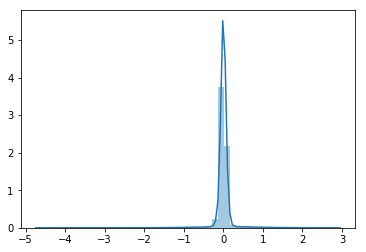

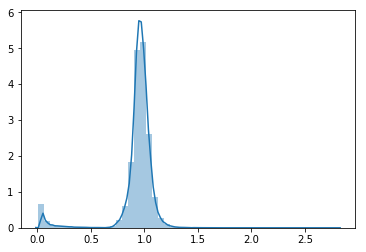

In [27]:
z_aux, z_var_aux = encoder.predict([X_train_t,X_train, S_train], batch_size=512)

sns.distplot(z_aux.flatten())
plt.show()
sns.distplot(np.exp(z_var_aux.flatten()))
plt.show()

----- EVALUANDO RECONSTRUCCION DE LA CURVA -----


/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


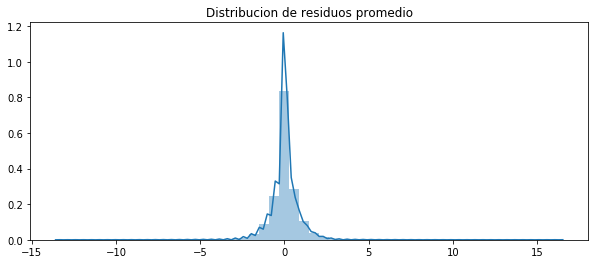

------------- Error -------------
RMSE (+-) =  0.7700443834000463
MAE  (+-) =  0.5077770062780069
------------- Smoothness -------------
AutoCorr lag-one =  0.816761350555478
Diff MEAN =  0.047691336840032725
------------- Residual -------------
AutoCorr lag-one =  0.03536787444311509
Permutation H =  0.9958466379709912
Spectral H =  0.8937505648606666
---------------------------------------
MSE de escala escalado=  0.3162767333809346


array([[9.2020526e-04],
       [5.6903118e-05],
       [1.4995156e-05],
       ...,
       [6.2446939e-05],
       [2.2961816e-05],
       [6.9666916e-05]], dtype=float32)

In [28]:
X_train_hat = vae.predict([X_train_t[:N], X_train[:N], S_train[:N]], batch_size=512)
evaluate_reconst(X_train[:N]/S_train[:N,None,:], X_train_hat/S_train[:N,None,:])

S_train_hat = S_model.predict([X_train_t[:N],X_train[:N], S_train[:N]], batch_size=512)
print("MSE de escala escalado= ",mean_squared_error(S_train[:N], S_train_hat)*(1/S_std)**2)
S_train_hat ## no predice valores negativos

Real scale = 0.000051
Pred scale = 0.000073


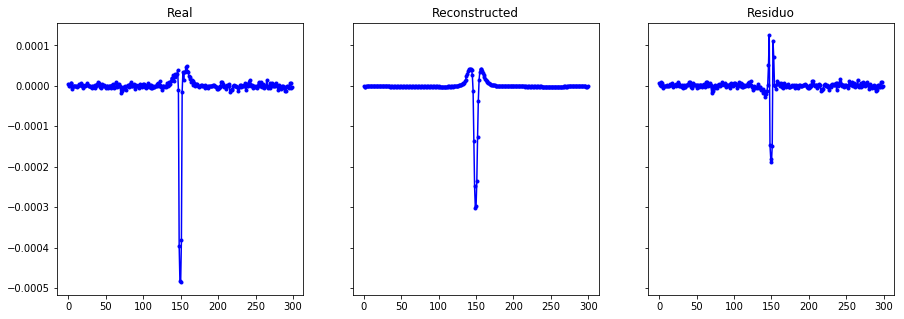

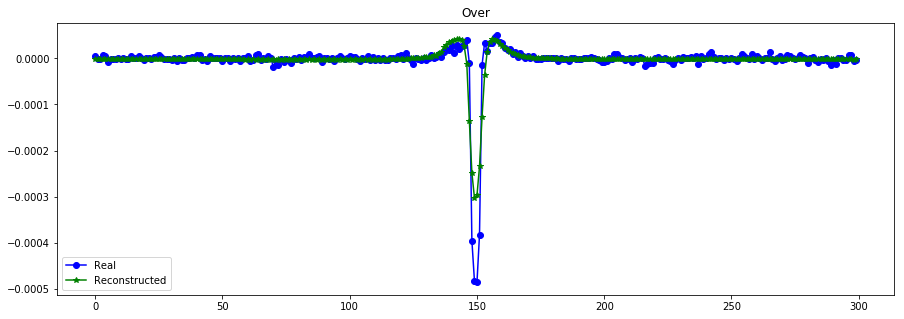

----------------------------------------------------------------
Real scale = 0.000039
Pred scale = 0.000059


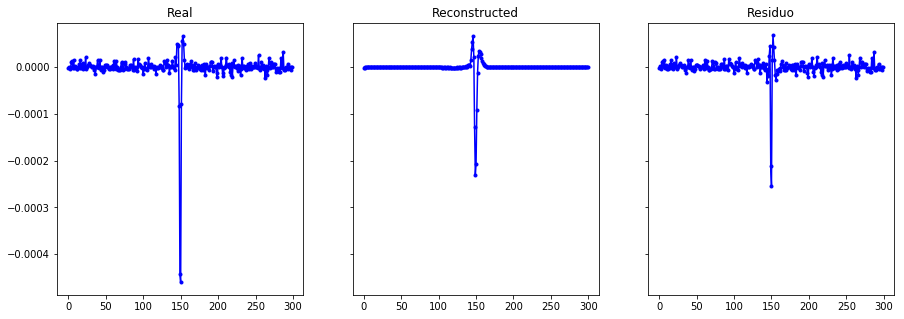

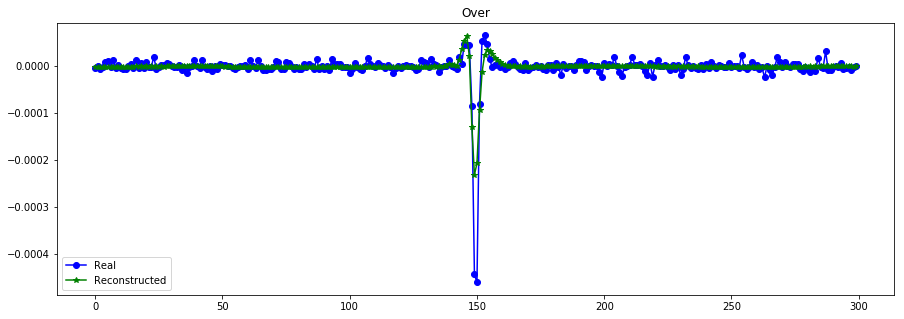

----------------------------------------------------------------
Real scale = 0.000077
Pred scale = 0.000083


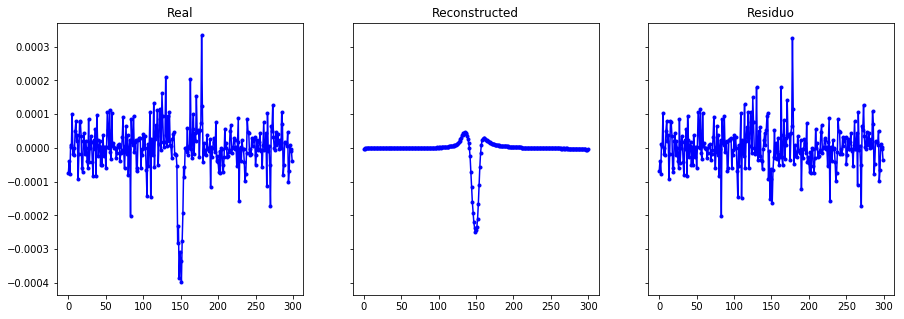

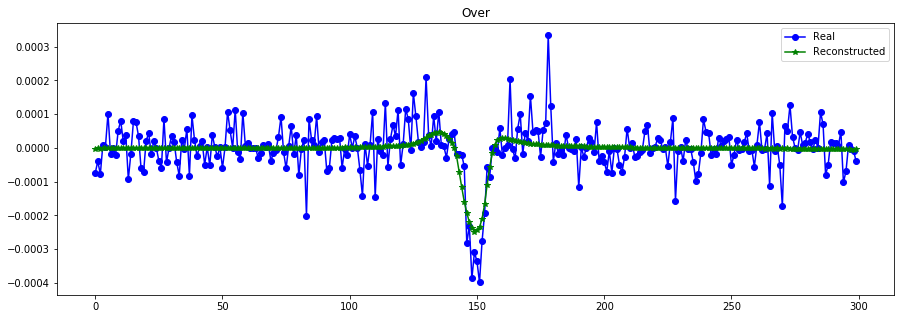

----------------------------------------------------------------
Real scale = 0.000147
Pred scale = 0.000238


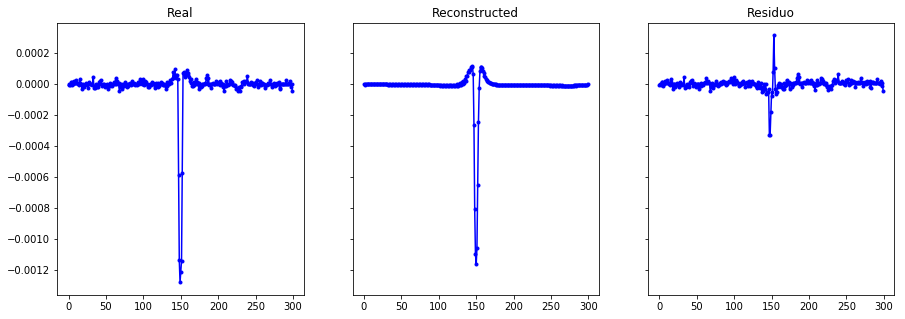

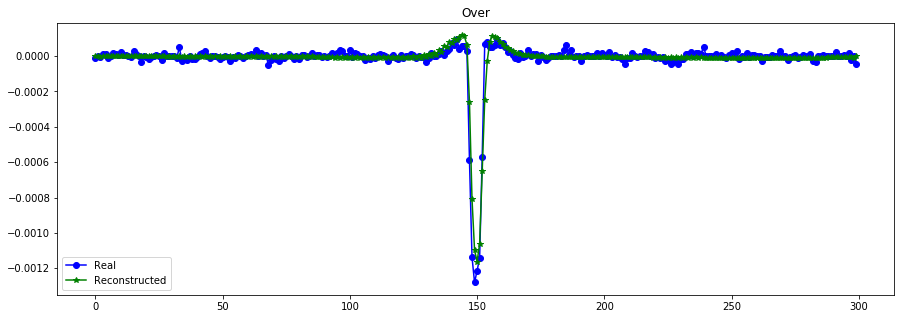

----------------------------------------------------------------
Real scale = 0.000146
Pred scale = 0.000176


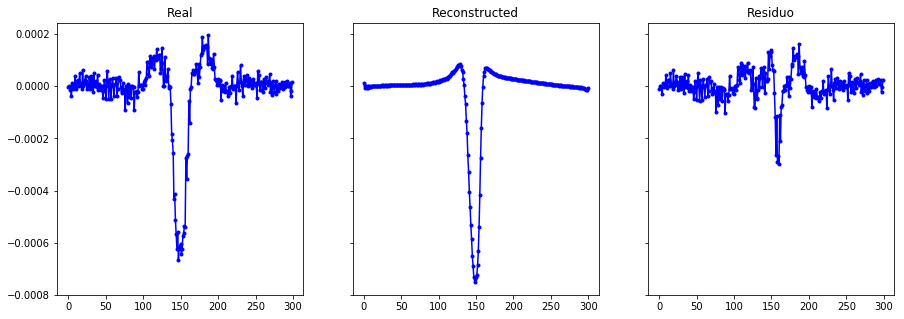

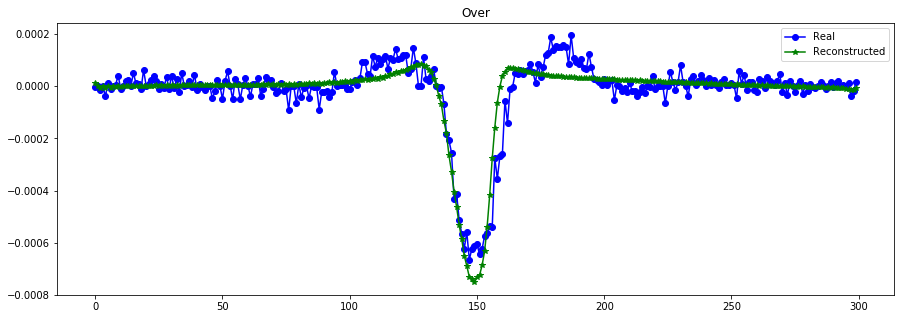

----------------------------------------------------------------
Real scale = 0.000725
Pred scale = 0.000697


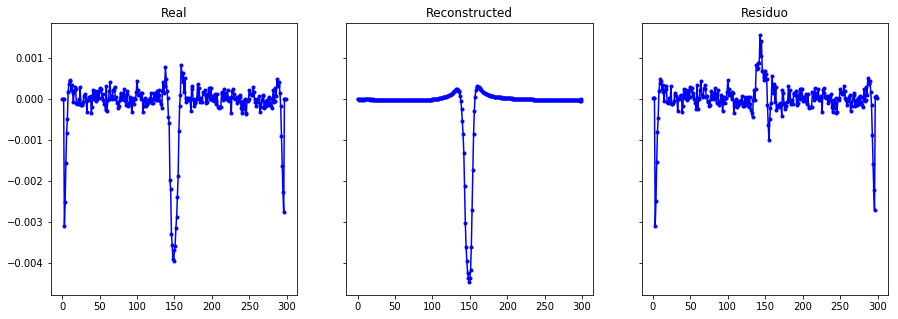

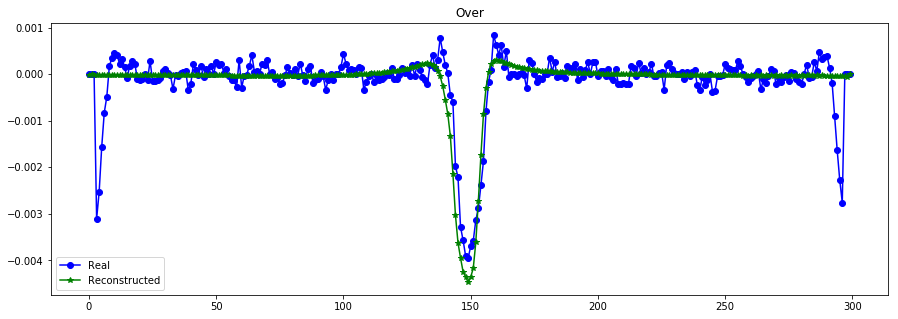

----------------------------------------------------------------
Real scale = 0.000016
Pred scale = 0.000013


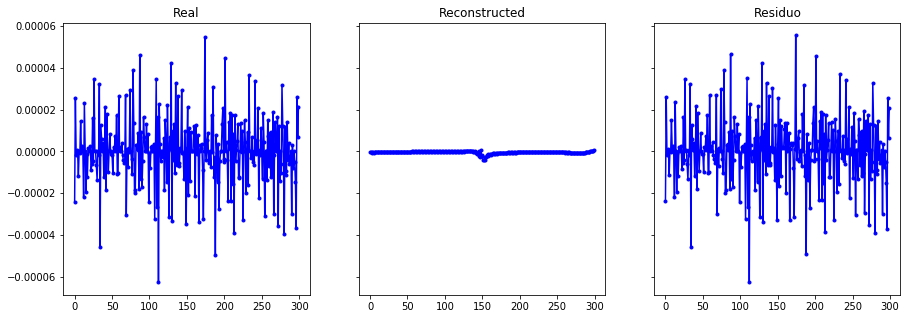

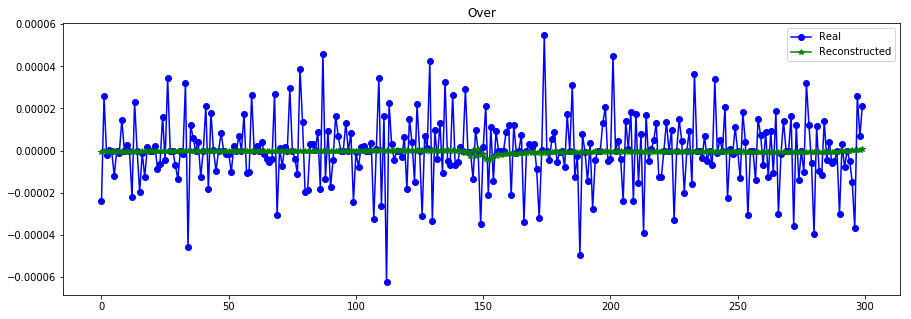

----------------------------------------------------------------
Real scale = 0.000015
Pred scale = 0.000021


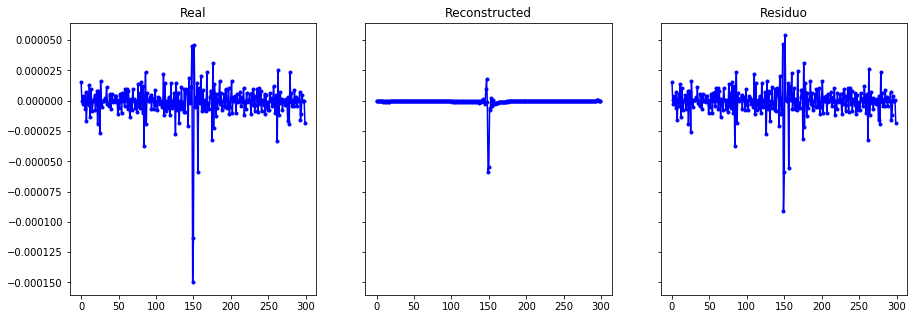

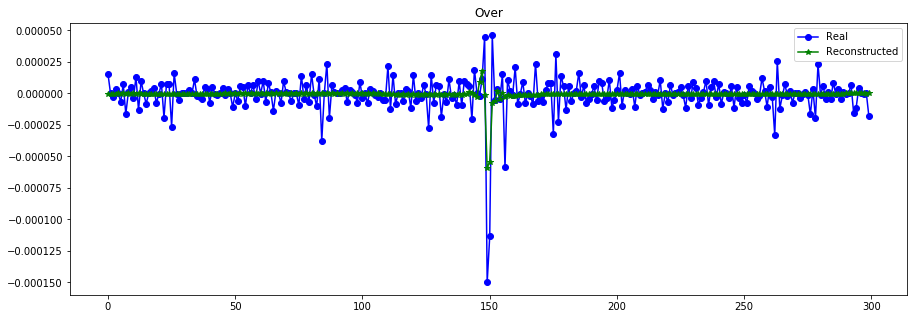

----------------------------------------------------------------
Real scale = 0.000028
Pred scale = 0.000023


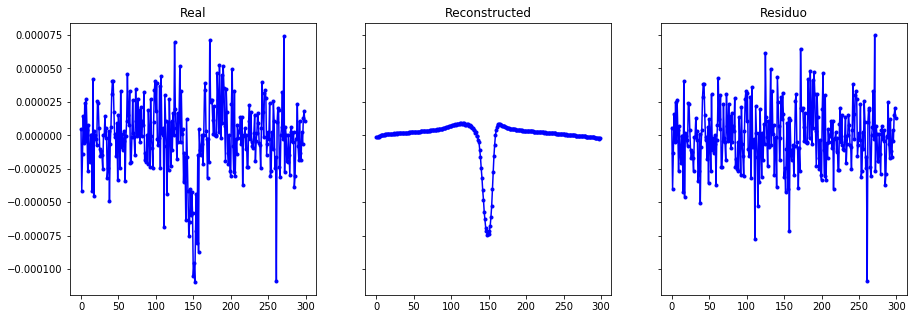

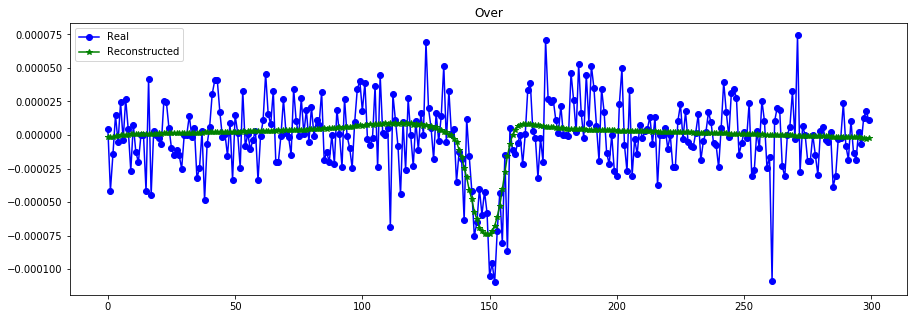

----------------------------------------------------------------
Real scale = 0.000040
Pred scale = 0.000039


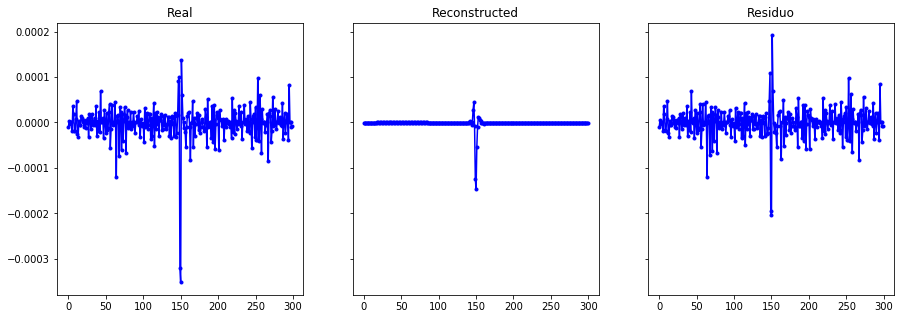

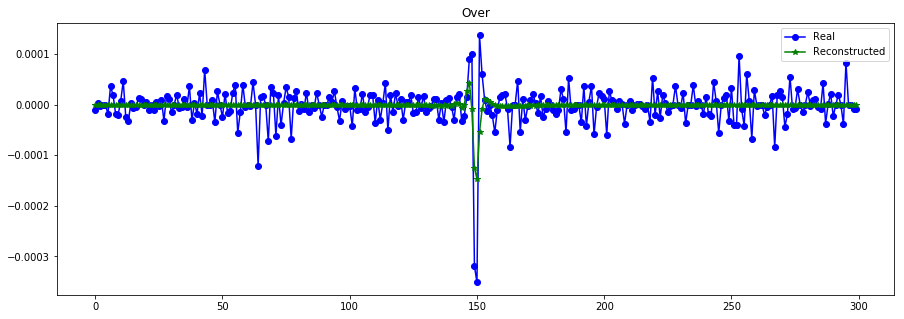

----------------------------------------------------------------
Real scale = 0.000046
Pred scale = 0.000059


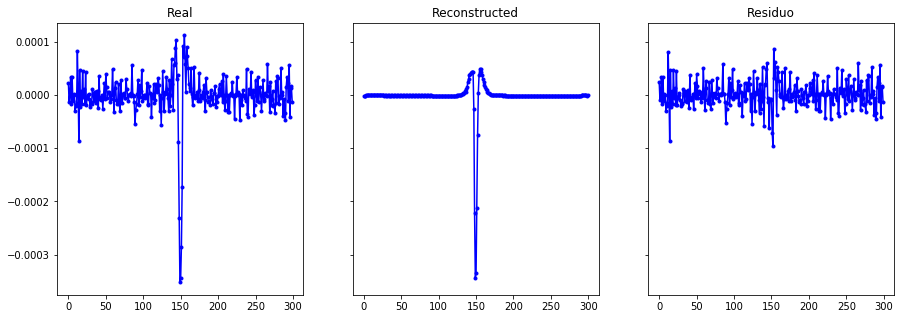

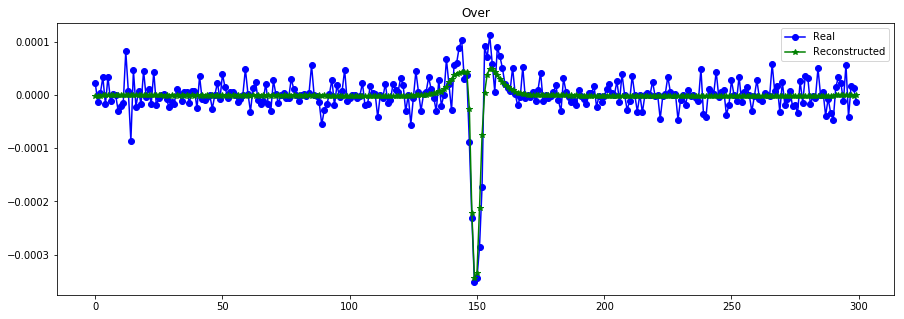

----------------------------------------------------------------
Real scale = 0.000059
Pred scale = 0.000082


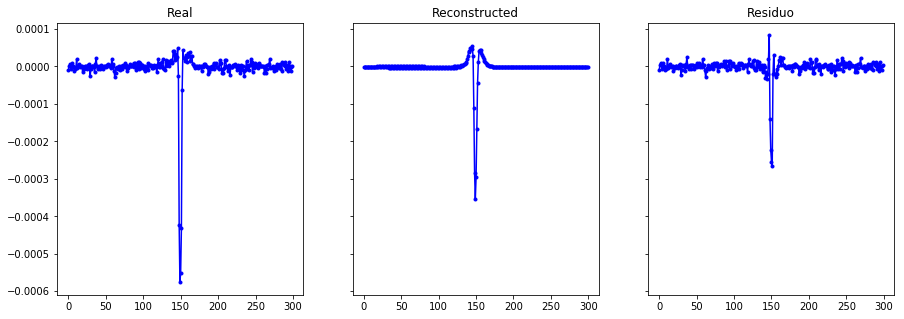

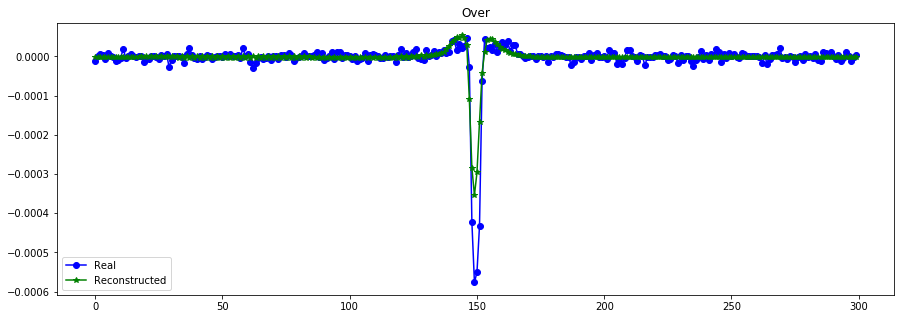

----------------------------------------------------------------
Real scale = 0.000022
Pred scale = 0.000017


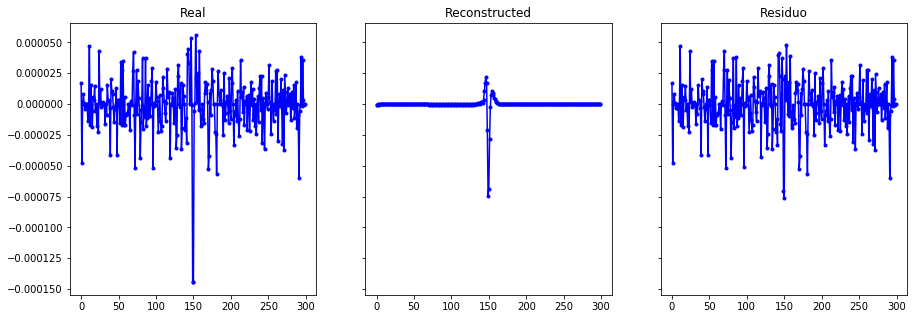

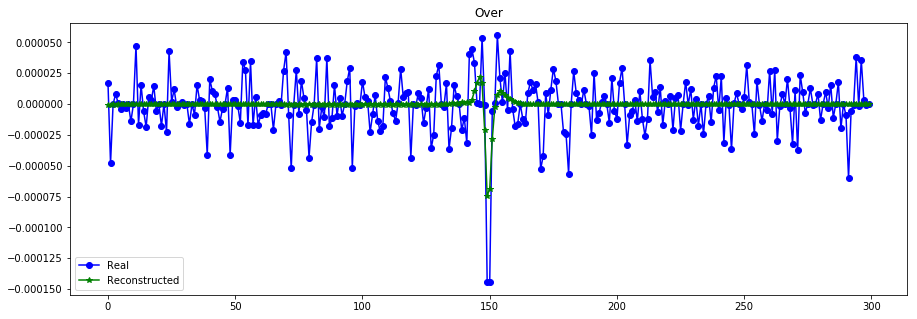

----------------------------------------------------------------
Real scale = 0.000049
Pred scale = 0.000061


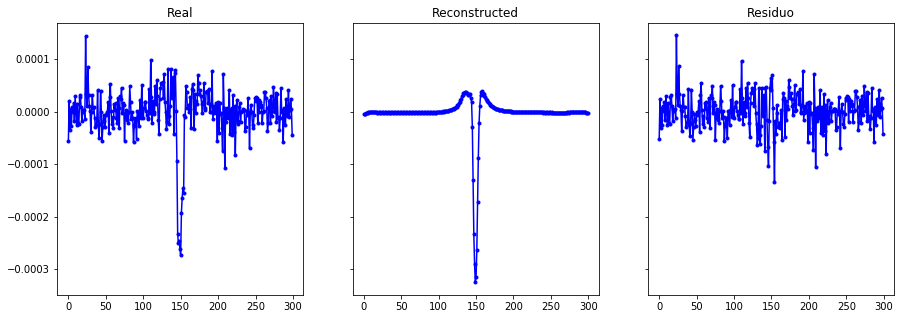

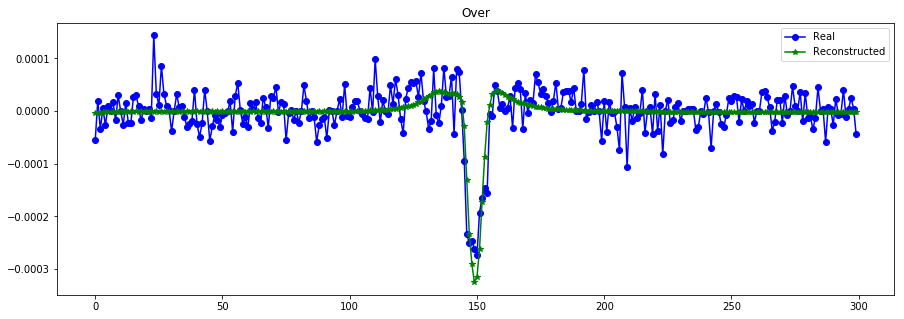

----------------------------------------------------------------
Real scale = 0.000059
Pred scale = 0.000078


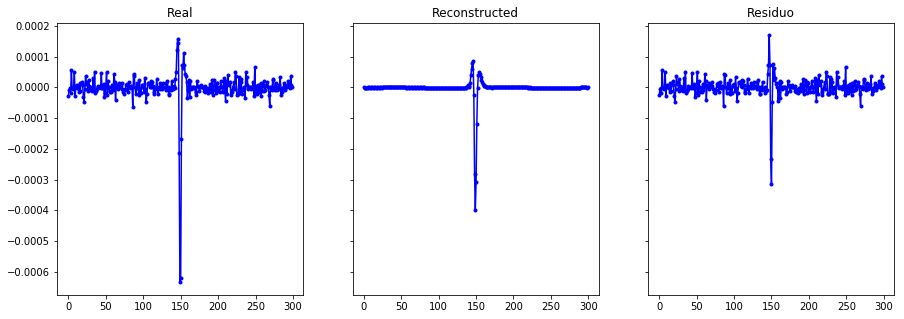

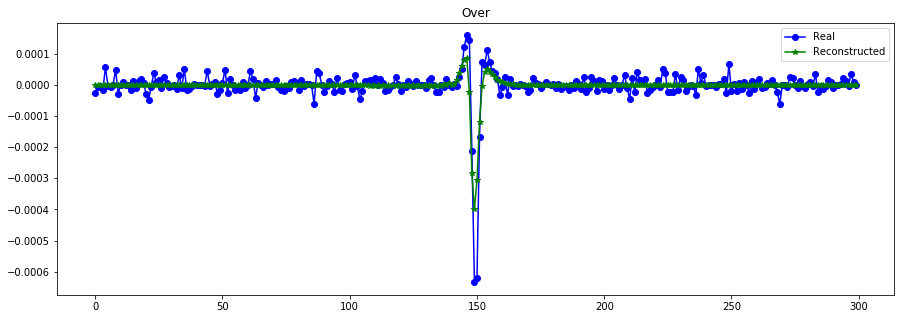

----------------------------------------------------------------


In [29]:
plot_n_lc(X_train[:N,:,0], X_train_hat, n= 15, s=[S_train[:N],S_train_hat]) #

In [16]:
### Mas info de la escala

##### INPUTS ENCODER ######
x_lc = Input(shape = (T, channels) , name="LC_inp")
x_t = Input(shape = (T, 1) , name ="T_inp")
s_lc = Input(shape= (1,), name="scale_inp") #para pesar loss
x_lc_s = Lambda(Div_L, name="Divide")([x_lc, s_lc]) #NEW: quitar escala del dato (o escalar a una version normal)

##### CODIFY LIGHT CURVE ######
x = Concatenate(axis=-1)([x_t, x_lc_s]) 
f1 = Bidirectional(CuDNNGRU(64, return_sequences=True))(x)
f1 = Bidirectional(CuDNNGRU(64, return_sequences=False))(f1) 

##### CODIFY SCALE AND CONCATENATE ######
f1_s = Lambda(Norm_L, arguments={'mu':Slog_mu,'std':Slog_std}, name="norm")(s_lc) #mas capas?
#f1_s = Dense(4, activation='tanh')(f1_s) #o tanh
f1_s = Dense(2, activation='tanh')(f1_s) #o tanh

f1 = Concatenate(axis=-1)([f1, f1_s]) #NEW: agregar escala a codificar

##### GET THE LATENT VARIABLE ######
z_mean = Dense(latent_dim,activation='linear')(f1)
z_log_var = Dense(latent_dim,activation='linear')(f1)
encoder = Model([x_t, x_lc, s_lc], [z_mean,z_log_var], name="encoder")
samp_model = define_samp_model(latent_dim) #model to sample


##### INPUTS DECODER ######
decoder_input = Input(shape=(latent_dim,))

##### RECONSTRCT SCALE ######
s_out = Dense(2, activation='tanh')(decoder_input)
#s_out = Dense(4, activation='tanh')(s_out)
s_out = Dense(1, activation='linear', name="reconsnorm")(s_out) #NEW: aprende s 
s_out = Lambda(RevertNorm_L, arguments={'mu':Slog_mu,'std':Slog_std},name="revertnorm")(s_out) #NEW: volver a escala normal 
s_hat = Model(decoder_input, s_out)(samp_model(encoder([x_t, x_lc, s_lc])))
S_model = Model([x_t, x_lc, s_lc], s_hat)

##### RECONSTRUCT LIGHT CURVE ######
decode = RepeatVector(T)(decoder_input)
decode = Concatenate(axis=-1)([x_t, decode]) #add time decode
decode = Bidirectional(CuDNNGRU(64, return_sequences=True))(decode) #bidirectional
decode = Bidirectional(CuDNNGRU(64, return_sequences=True))(decode) #bidirectional

decode = TimeDistributed(Dense(1, activation='linear'))(decode)
decode = Lambda(Mul_L, name="Multiply")([decode, s_out]) #NEW: recuperar escala de dato (multiplicar por std)
generator = Model([x_t, decoder_input], decode, name="generator")


##### VAE MODEL ######
out = generator([x_t, samp_model(encoder([x_t, x_lc, s_lc])) ])
vae = Model([x_t, x_lc, s_lc], out)

#define loss functions over model components
smse_LC = SMSE_loss(s_lc)
mse_S = MSLE_scale_loss(s_lc, s_hat) 
kl_loss = KL_loss(z_mean, z_log_var)

Epoch 1/300
8634/8634 [==============================] - 32s 4ms/step - loss: 4.8997 - SMSE: 2.6192 - KL: 3.6181 - MSLE_scale: 2.2769
Epoch 2/300
8634/8634 [==============================] - 26s 3ms/step - loss: 1.9876 - SMSE: 1.0474 - KL: 27.0485 - MSLE_scale: 0.9131
Epoch 3/300
8634/8634 [==============================] - 27s 3ms/step - loss: 1.5609 - SMSE: 1.0060 - KL: 52.8547 - MSLE_scale: 0.5021
Epoch 4/300
8634/8634 [==============================] - 26s 3ms/step - loss: 1.4342 - SMSE: 1.0025 - KL: 59.2809 - MSLE_scale: 0.3724
Epoch 5/300
8634/8634 [==============================] - 25s 3ms/step - loss: 1.3817 - SMSE: 1.0024 - KL: 57.1477 - MSLE_scale: 0.3222
Epoch 6/300
8634/8634 [==============================] - 26s 3ms/step - loss: 1.3559 - SMSE: 1.0022 - KL: 54.0060 - MSLE_scale: 0.2997
Epoch 7/300
8634/8634 [==============================] - 26s 3ms/step - loss: 1.3315 - SMSE: 1.0022 - KL: 51.9626 - MSLE_scale: 0.2774
Epoch 8/300
8634/8634 [==============================] -

8634/8634 [==============================] - 25s 3ms/step - loss: 0.7909 - SMSE: 0.7546 - KL: 31.5346 - MSLE_scale: 0.0048
Epoch 122/300
8634/8634 [==============================] - 25s 3ms/step - loss: 0.7831 - SMSE: 0.7474 - KL: 31.5343 - MSLE_scale: 0.0042
Epoch 123/300
8634/8634 [==============================] - 25s 3ms/step - loss: 0.7887 - SMSE: 0.7520 - KL: 31.4943 - MSLE_scale: 0.0052
Epoch 124/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7980 - SMSE: 0.7627 - KL: 30.7562 - MSLE_scale: 0.0045
Epoch 125/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7845 - SMSE: 0.7482 - KL: 31.7205 - MSLE_scale: 0.0046
Epoch 126/300
8634/8634 [==============================] - 25s 3ms/step - loss: 0.7628 - SMSE: 0.7265 - KL: 31.8076 - MSLE_scale: 0.0045
Epoch 127/300
8634/8634 [==============================] - 25s 3ms/step - loss: 0.8008 - SMSE: 0.7660 - KL: 29.7567 - MSLE_scale: 0.0051
Epoch 128/300
8634/8634 [==============================

8634/8634 [==============================] - 26s 3ms/step - loss: 0.7224 - SMSE: 0.6934 - KL: 26.4923 - MSLE_scale: 0.0025
Epoch 240/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7111 - SMSE: 0.6816 - KL: 27.0341 - MSLE_scale: 0.0025
Epoch 241/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7346 - SMSE: 0.7060 - KL: 25.8670 - MSLE_scale: 0.0027
Epoch 242/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7291 - SMSE: 0.7007 - KL: 25.6837 - MSLE_scale: 0.0027
Epoch 243/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7047 - SMSE: 0.6762 - KL: 25.9602 - MSLE_scale: 0.0026
Epoch 244/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7033 - SMSE: 0.6748 - KL: 26.1317 - MSLE_scale: 0.0024
Epoch 245/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7274 - SMSE: 0.6988 - KL: 25.8724 - MSLE_scale: 0.0028
Epoch 246/300
8634/8634 [==============================

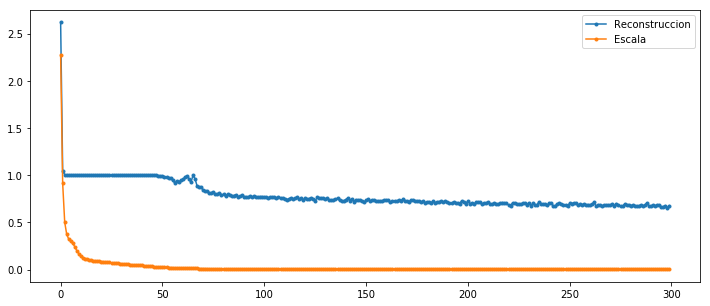

In [13]:
def Wvae_loss(y_true, y_pred):    
    return smse_LC(y_true, y_pred) + l*kl_loss(y_true, y_pred) + mse_S(y_true, y_pred)

vae.compile(optimizer='adam', loss=Wvae_loss, metrics = [smse_LC,kl_loss, mse_S])
hist = vae.fit([X_train_t, X_train, S_train], X_train, epochs=EPOCHS, batch_size=BATCH_s)

plt.figure(figsize=(12,5))
plt.plot(hist.history["SMSE"], '.-', label="Reconstruccion")
plt.plot(hist.history["MSLE_scale"], '.-', label="Escala")
plt.legend()
plt.show()

----- EVALUANDO RECONSTRUCCION DE LA CURVA -----


/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


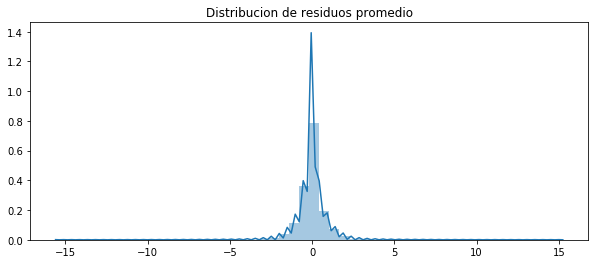

------------- Error -------------
RMSE (+-) =  0.7264703802935781
MAE  (+-) =  0.49351198691078635
------------- Smoothness -------------
AutoCorr lag-one =  0.6540550913686746
Diff MEAN =  0.059099671404623765
------------- Residual -------------
AutoCorr lag-one =  -0.008850982456735738
Mean (+) STD = -0.019535 (+) 0.725691
Spectral H =  0.8968236265713321
---------------------------------------
MSE de escala escalado=  0.04091343176460606


array([[1.2498813e-03],
       [4.7554222e-05],
       [1.1892354e-05],
       ...,
       [6.0920651e-05],
       [2.2443732e-05],
       [6.7691130e-05]], dtype=float32)

In [14]:
X_train_hat = vae.predict([X_train_t[:N], X_train[:N], S_train[:N]], batch_size=512)
evaluate_reconst(X_train[:N]/S_train[:N,None,:], X_train_hat/S_train[:N,None,:])

S_train_hat = S_model.predict([X_train_t[:N],X_train[:N], S_train[:N]], batch_size=512)
print("MSE de escala escalado= ",mean_squared_error(S_train[:N], S_train_hat)*(1/S_std)**2)
S_train_hat ## no predice valores negativos

In [15]:
vae.get_layer("encoder").save_weights("./aux_models/VAE_S_2tanh_W1_E.h5")
vae.get_layer("generator").save_weights("./aux_models/VAE_S_2tanh_W1_D.h5")

Epoch 1/300
8634/8634 [==============================] - 30s 3ms/step - loss: 1.2365 - SMSE: 1.1168 - KL: 2.9108 - MSLE_scale: 1.1679
Epoch 2/300
8634/8634 [==============================] - 26s 3ms/step - loss: 1.1091 - SMSE: 1.0146 - KL: 1.8070 - MSLE_scale: 0.9268
Epoch 3/300
8634/8634 [==============================] - 26s 3ms/step - loss: 1.0817 - SMSE: 1.0077 - KL: 6.8731 - MSLE_scale: 0.6712
Epoch 4/300
8634/8634 [==============================] - 26s 3ms/step - loss: 1.0611 - SMSE: 1.0031 - KL: 8.5178 - MSLE_scale: 0.4947
Epoch 5/300
8634/8634 [==============================] - 26s 3ms/step - loss: 1.0510 - SMSE: 1.0028 - KL: 8.0659 - MSLE_scale: 0.4008
Epoch 6/300
8634/8634 [==============================] - 26s 3ms/step - loss: 1.0444 - SMSE: 1.0027 - KL: 7.3613 - MSLE_scale: 0.3427
Epoch 7/300
8634/8634 [==============================] - 26s 3ms/step - loss: 1.0412 - SMSE: 1.0027 - KL: 6.9962 - MSLE_scale: 0.3153
Epoch 8/300
8634/8634 [==============================] - 26s 3

8634/8634 [==============================] - 26s 3ms/step - loss: 0.7534 - SMSE: 0.7387 - KL: 13.3582 - MSLE_scale: 0.0140
Epoch 122/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7469 - SMSE: 0.7318 - KL: 13.5215 - MSLE_scale: 0.0151
Epoch 123/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7437 - SMSE: 0.7287 - KL: 13.5029 - MSLE_scale: 0.0145
Epoch 124/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7340 - SMSE: 0.7193 - KL: 13.2708 - MSLE_scale: 0.0143
Epoch 125/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7531 - SMSE: 0.7374 - KL: 14.0487 - MSLE_scale: 0.0156
Epoch 126/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7453 - SMSE: 0.7295 - KL: 14.2161 - MSLE_scale: 0.0167
Epoch 127/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7396 - SMSE: 0.7248 - KL: 13.4104 - MSLE_scale: 0.0140
Epoch 128/300
8634/8634 [==============================

8634/8634 [==============================] - 26s 3ms/step - loss: 0.6736 - SMSE: 0.6577 - KL: 14.6166 - MSLE_scale: 0.0136
Epoch 240/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.6824 - SMSE: 0.6665 - KL: 14.5833 - MSLE_scale: 0.0137
Epoch 241/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.6930 - SMSE: 0.6767 - KL: 14.7962 - MSLE_scale: 0.0150
Epoch 242/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7184 - SMSE: 0.7023 - KL: 14.1947 - MSLE_scale: 0.0196
Epoch 243/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.6938 - SMSE: 0.6780 - KL: 14.3927 - MSLE_scale: 0.0139
Epoch 244/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7186 - SMSE: 0.7028 - KL: 14.1200 - MSLE_scale: 0.0166
Epoch 245/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.6962 - SMSE: 0.6804 - KL: 14.3414 - MSLE_scale: 0.0145
Epoch 246/300
8634/8634 [==============================

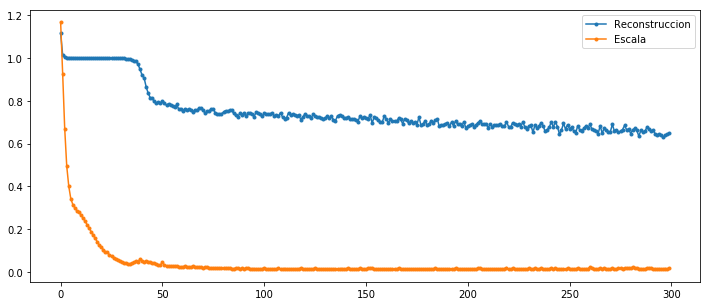

In [17]:
def Wvae_loss(y_true, y_pred):    
    return smse_LC(y_true, y_pred) + l*kl_loss(y_true, y_pred) +0.1*mse_S(y_true, y_pred)

vae.compile(optimizer='adam', loss=Wvae_loss, metrics = [smse_LC,kl_loss, mse_S])
hist = vae.fit([X_train_t, X_train, S_train], X_train, epochs=EPOCHS, batch_size=BATCH_s)

plt.figure(figsize=(12,5))
plt.plot(hist.history["SMSE"], '.-', label="Reconstruccion")
plt.plot(hist.history["MSLE_scale"], '.-', label="Escala")
plt.legend()
plt.show()

----- EVALUANDO RECONSTRUCCION DE LA CURVA -----


/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


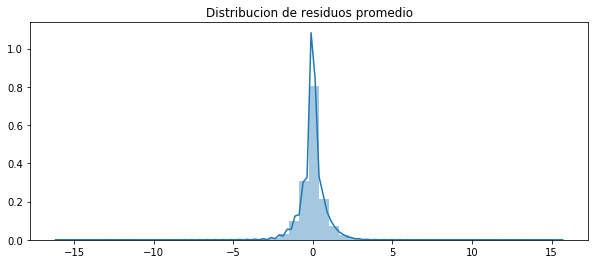

------------- Error -------------
RMSE (+-) =  0.6921019674697027
MAE  (+-) =  0.4830503127031561
------------- Smoothness -------------
AutoCorr lag-one =  0.6317421306310376
Diff MEAN =  0.06493532708781462
------------- Residual -------------
AutoCorr lag-one =  -0.03789195947076848
Mean (+) STD = -0.009861 (+) 0.691590
Spectral H =  0.8995114387093672
---------------------------------------
MSE de escala escalado=  0.2301291576911849


array([[1.1113357e-03],
       [5.1130359e-05],
       [1.1465672e-05],
       ...,
       [6.3863234e-05],
       [2.2769616e-05],
       [7.4677999e-05]], dtype=float32)

In [18]:
X_train_hat = vae.predict([X_train_t[:N], X_train[:N], S_train[:N]], batch_size=512)
evaluate_reconst(X_train[:N]/S_train[:N,None,:], X_train_hat/S_train[:N,None,:])

S_train_hat = S_model.predict([X_train_t[:N],X_train[:N], S_train[:N]], batch_size=512)
print("MSE de escala escalado= ",mean_squared_error(S_train[:N], S_train_hat)*(1/S_std)**2)
S_train_hat ## no predice valores negativos

In [19]:
vae.get_layer("encoder").save_weights("./aux_models/VAE_S_2tanh_E.h5")
vae.get_layer("generator").save_weights("./aux_models/VAE_S_2tanh_D.h5")

In [15]:
def Wvae_loss(y_true, y_pred):    
    return smse_LC(y_true, y_pred) + l*kl_loss(y_true, y_pred) + 0.01*mse_S(y_true, y_pred)

vae.compile(optimizer='adam', loss=Wvae_loss, metrics = [smse_LC,kl_loss, mse_S])
vae.fit([X_train_t, X_train, S_train], X_train, epochs=EPOCHS, batch_size=BATCH_s)

Epoch 1/300
8634/8634 [==============================] - 42s 5ms/step - loss: 1.2665 - SMSE: 1.2296 - KL: 9.9037 - MSLE_scale: 2.7015
Epoch 2/300
8634/8634 [==============================] - 26s 3ms/step - loss: 1.0419 - SMSE: 1.0095 - KL: 6.1617 - MSLE_scale: 2.6210
Epoch 3/300
8634/8634 [==============================] - 26s 3ms/step - loss: 1.0306 - SMSE: 1.0061 - KL: 3.2016 - MSLE_scale: 2.1371
Epoch 4/300
8634/8634 [==============================] - 26s 3ms/step - loss: 1.0260 - SMSE: 1.0067 - KL: 1.9875 - MSLE_scale: 1.7300
Epoch 5/300
8634/8634 [==============================] - 26s 3ms/step - loss: 1.0298 - SMSE: 1.0098 - KL: 2.2881 - MSLE_scale: 1.7757
Epoch 6/300
8634/8634 [==============================] - 26s 3ms/step - loss: 1.0248 - SMSE: 1.0060 - KL: 2.4224 - MSLE_scale: 1.6320
Epoch 7/300
8634/8634 [==============================] - 26s 3ms/step - loss: 1.0250 - SMSE: 1.0078 - KL: 2.4589 - MSLE_scale: 1.4703
Epoch 8/300
8634/8634 [==============================] - 26s 3

8634/8634 [==============================] - 26s 3ms/step - loss: 0.7480 - SMSE: 0.7320 - KL: 14.5155 - MSLE_scale: 0.1438
Epoch 122/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7510 - SMSE: 0.7356 - KL: 14.0805 - MSLE_scale: 0.1278
Epoch 123/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7646 - SMSE: 0.7484 - KL: 14.7656 - MSLE_scale: 0.1477
Epoch 124/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7487 - SMSE: 0.7335 - KL: 13.8750 - MSLE_scale: 0.1320
Epoch 125/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7399 - SMSE: 0.7244 - KL: 14.2522 - MSLE_scale: 0.1313
Epoch 126/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7459 - SMSE: 0.7301 - KL: 14.4368 - MSLE_scale: 0.1353
Epoch 127/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7456 - SMSE: 0.7299 - KL: 14.2786 - MSLE_scale: 0.1362
Epoch 128/300
8634/8634 [==============================

8634/8634 [==============================] - 26s 3ms/step - loss: 0.7525 - SMSE: 0.7379 - KL: 13.3603 - MSLE_scale: 0.1203
Epoch 240/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.6893 - SMSE: 0.6745 - KL: 13.5538 - MSLE_scale: 0.1268
Epoch 241/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7047 - SMSE: 0.6903 - KL: 13.1962 - MSLE_scale: 0.1186
Epoch 242/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7377 - SMSE: 0.7225 - KL: 13.9269 - MSLE_scale: 0.1260
Epoch 243/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7875 - SMSE: 0.7735 - KL: 12.7194 - MSLE_scale: 0.1338
Epoch 244/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7557 - SMSE: 0.7407 - KL: 13.6969 - MSLE_scale: 0.1309
Epoch 245/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.6910 - SMSE: 0.6766 - KL: 13.1239 - MSLE_scale: 0.1351
Epoch 246/300
8634/8634 [==============================

----- EVALUANDO RECONSTRUCCION DE LA CURVA -----


/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


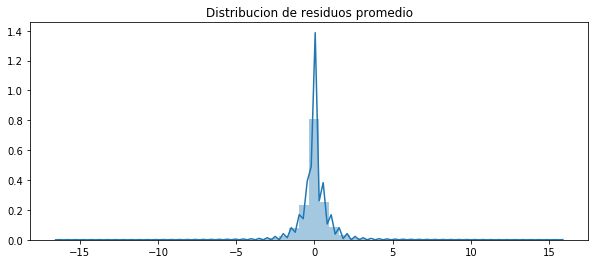

------------- Error -------------
RMSE (+-) =  0.7365569061461766
MAE  (+-) =  0.4963381859956003
------------- Smoothness -------------
AutoCorr lag-one =  0.6491835558272296
Diff MEAN =  0.05316763876345675
------------- Residual -------------
AutoCorr lag-one =  0.01727956787709827
Mean (+) STD = 0.011139 (+) 0.735962
Spectral H =  0.8956968991738612
---------------------------------------
MSE de escala escalado=  0.445500942656104


array([[1.3294681e-03],
       [4.9909591e-05],
       [1.8953213e-05],
       ...,
       [7.3544485e-05],
       [2.2603477e-05],
       [5.3256223e-05]], dtype=float32)

In [19]:
X_train_hat = vae.predict([X_train_t[:N], X_train[:N], S_train[:N]], batch_size=512)
evaluate_reconst(X_train[:N]/S_train[:N,None,:], X_train_hat/S_train[:N,None,:])

S_train_hat = S_model.predict([X_train_t[:N],X_train[:N], S_train[:N]], batch_size=512)
print("MSE de escala escalado= ",mean_squared_error(S_train[:N], S_train_hat)*(1/S_std)**2)
S_train_hat ## no predice valores negativos

In [17]:
vae.get_layer("encoder").save_weights("./aux_models/VAE_S_2tanh_W01_E.h5")
vae.get_layer("generator").save_weights("./aux_models/VAE_S_2tanh_W01_D.h5")

In [19]:
def Wvae_loss(y_true, y_pred):    
    return smse_LC(y_true, y_pred) + l*kl_loss(y_true, y_pred) + l*mse_S(y_true, y_pred)

vae.compile(optimizer='adam', loss=Wvae_loss, metrics = [smse_LC,kl_loss, mse_S])
vae.fit([X_train_t, X_train, S_train], X_train, epochs=EPOCHS, batch_size=BATCH_s)

Epoch 1/300
8634/8634 [==============================] - 29s 3ms/step - loss: 1.4848 - SMSE: 1.4786 - KL: 4.4936 - MSLE_scale: 1.6471
Epoch 2/300
8634/8634 [==============================] - 26s 3ms/step - loss: 1.0169 - SMSE: 1.0095 - KL: 5.5830 - MSLE_scale: 1.7737
Epoch 3/300
8634/8634 [==============================] - 26s 3ms/step - loss: 1.0142 - SMSE: 1.0084 - KL: 4.0585 - MSLE_scale: 1.7267
Epoch 4/300
8634/8634 [==============================] - 26s 3ms/step - loss: 1.0163 - SMSE: 1.0105 - KL: 4.0756 - MSLE_scale: 1.7365
Epoch 5/300
8634/8634 [==============================] - 26s 3ms/step - loss: 1.0110 - SMSE: 1.0058 - KL: 3.5177 - MSLE_scale: 1.7129
Epoch 6/300
8634/8634 [==============================] - 26s 3ms/step - loss: 1.0105 - SMSE: 1.0059 - KL: 2.8933 - MSLE_scale: 1.6658
Epoch 7/300
8634/8634 [==============================] - 26s 3ms/step - loss: 1.0106 - SMSE: 1.0062 - KL: 2.7476 - MSLE_scale: 1.6730
Epoch 8/300
8634/8634 [==============================] - 26s 3

8634/8634 [==============================] - 26s 3ms/step - loss: 0.7618 - SMSE: 0.7513 - KL: 10.0312 - MSLE_scale: 0.4247
Epoch 122/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7649 - SMSE: 0.7543 - KL: 10.1673 - MSLE_scale: 0.4514
Epoch 123/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7559 - SMSE: 0.7456 - KL: 9.9087 - MSLE_scale: 0.4702
Epoch 124/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7590 - SMSE: 0.7483 - KL: 10.2771 - MSLE_scale: 0.4990
Epoch 125/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7628 - SMSE: 0.7526 - KL: 9.6850 - MSLE_scale: 0.4741
Epoch 126/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7682 - SMSE: 0.7583 - KL: 9.3818 - MSLE_scale: 0.4882
Epoch 127/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7722 - SMSE: 0.7623 - KL: 9.4687 - MSLE_scale: 0.4761
Epoch 128/300
8634/8634 [==============================] - 

8634/8634 [==============================] - 26s 3ms/step - loss: 1.0341 - SMSE: 0.9042 - KL: 129.3977 - MSLE_scale: 0.5722
Epoch 241/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.9806 - SMSE: 0.8842 - KL: 96.0567 - MSLE_scale: 0.3724
Epoch 242/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.9920 - SMSE: 0.8879 - KL: 103.7405 - MSLE_scale: 0.4068
Epoch 243/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.9785 - SMSE: 0.8707 - KL: 107.6156 - MSLE_scale: 0.2097
Epoch 244/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.9487 - SMSE: 0.8479 - KL: 100.6045 - MSLE_scale: 0.2523
Epoch 245/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.9425 - SMSE: 0.8463 - KL: 95.9402 - MSLE_scale: 0.2313
Epoch 246/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.9342 - SMSE: 0.8444 - KL: 89.5555 - MSLE_scale: 0.2558
Epoch 247/300
8634/8634 [==========================

----- EVALUANDO RECONSTRUCCION DE LA CURVA -----


/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


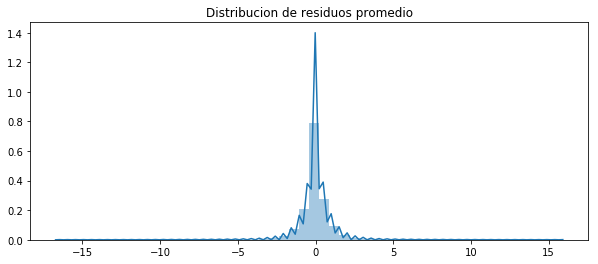

------------- Error -------------
RMSE (+-) =  0.8833584021716832
MAE  (+-) =  0.541047964530005
------------- Smoothness -------------
AutoCorr lag-one =  0.9350604378379413
Diff MEAN =  0.023138655114709736
------------- Residual -------------
AutoCorr lag-one =  0.16050949304812118
Mean (+) STD = -0.010403 (+) 0.882723
Spectral H =  0.8738430708240031
---------------------------------------
MSE de escala escalado=  0.46103436232355066


array([[1.1596989e-03],
       [6.3159365e-05],
       [1.0781639e-05],
       ...,
       [2.2575611e-04],
       [1.2618255e-05],
       [2.0083837e-04]], dtype=float32)

In [21]:
X_train_hat = vae.predict([X_train_t[:N], X_train[:N], S_train[:N]], batch_size=512)
evaluate_reconst(X_train[:N]/S_train[:N,None,:], X_train_hat/S_train[:N,None,:])

S_train_hat = S_model.predict([X_train_t[:N],X_train[:N], S_train[:N]], batch_size=512)
print("MSE de escala escalado= ",mean_squared_error(S_train[:N], S_train_hat)*(1/S_std)**2)
S_train_hat ## no predice valores negativos

In [21]:
vae.get_layer("encoder").save_weights("./aux_models/VAE_S_2tanh_W001_E.h5")
vae.get_layer("generator").save_weights("./aux_models/VAE_S_2tanh_W001_D.h5")

In [23]:
def Wvae_loss(y_true, y_pred):    
    return smse_LC(y_true, y_pred) + l*kl_loss(y_true, y_pred)

vae.compile(optimizer='adam', loss=Wvae_loss, metrics = [smse_LC,kl_loss, mse_S])
vae.fit([X_train_t, X_train, S_train], X_train, epochs=EPOCHS, batch_size=BATCH_s)

Epoch 1/300
8634/8634 [==============================] - 30s 3ms/step - loss: 1.9109 - SMSE: 1.9021 - KL: 8.8110 - MSLE_scale: 2.7805
Epoch 2/300
8634/8634 [==============================] - 26s 3ms/step - loss: 1.0224 - SMSE: 1.0115 - KL: 10.8647 - MSLE_scale: 3.0712
Epoch 3/300
8634/8634 [==============================] - 26s 3ms/step - loss: 1.0175 - SMSE: 1.0085 - KL: 8.9365 - MSLE_scale: 3.0378
Epoch 4/300
8634/8634 [==============================] - 26s 3ms/step - loss: 1.0147 - SMSE: 1.0069 - KL: 7.8151 - MSLE_scale: 3.0148
Epoch 5/300
8634/8634 [==============================] - 26s 3ms/step - loss: 1.0125 - SMSE: 1.0061 - KL: 6.4365 - MSLE_scale: 2.9713
Epoch 6/300
8634/8634 [==============================] - 26s 3ms/step - loss: 1.0103 - SMSE: 1.0048 - KL: 5.4890 - MSLE_scale: 2.9170
Epoch 7/300
8634/8634 [==============================] - 26s 3ms/step - loss: 1.0097 - SMSE: 1.0048 - KL: 4.9230 - MSLE_scale: 2.8683
Epoch 8/300
8634/8634 [==============================] - 26s 

8634/8634 [==============================] - 26s 3ms/step - loss: 0.7860 - SMSE: 0.7722 - KL: 13.8333 - MSLE_scale: 0.6814
Epoch 122/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7893 - SMSE: 0.7762 - KL: 13.1491 - MSLE_scale: 0.6991
Epoch 123/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7737 - SMSE: 0.7601 - KL: 13.5876 - MSLE_scale: 0.7858
Epoch 124/300
8634/8634 [==============================] - 25s 3ms/step - loss: 0.7784 - SMSE: 0.7652 - KL: 13.1874 - MSLE_scale: 0.7916
Epoch 125/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7877 - SMSE: 0.7750 - KL: 12.7364 - MSLE_scale: 0.7664
Epoch 126/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7715 - SMSE: 0.7593 - KL: 12.2858 - MSLE_scale: 0.7580
Epoch 127/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7792 - SMSE: 0.7649 - KL: 14.2990 - MSLE_scale: 0.7662
Epoch 128/300
8634/8634 [==============================

8634/8634 [==============================] - 26s 3ms/step - loss: 0.7368 - SMSE: 0.7252 - KL: 11.6116 - MSLE_scale: 1.0102
Epoch 240/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7361 - SMSE: 0.7240 - KL: 12.1314 - MSLE_scale: 1.0574
Epoch 241/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7597 - SMSE: 0.7486 - KL: 11.0631 - MSLE_scale: 0.9305
Epoch 242/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7184 - SMSE: 0.7068 - KL: 11.6393 - MSLE_scale: 1.0619
Epoch 243/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7405 - SMSE: 0.7290 - KL: 11.5506 - MSLE_scale: 1.0379
Epoch 244/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7420 - SMSE: 0.7305 - KL: 11.5362 - MSLE_scale: 0.9907
Epoch 245/300
8634/8634 [==============================] - 26s 3ms/step - loss: 0.7305 - SMSE: 0.7190 - KL: 11.5272 - MSLE_scale: 1.0684
Epoch 246/300
8634/8634 [==============================

----- EVALUANDO RECONSTRUCCION DE LA CURVA -----


/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


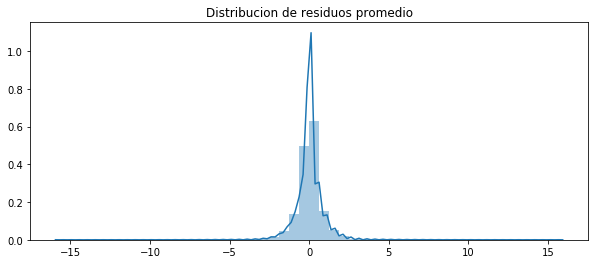

------------- Error -------------
RMSE (+-) =  0.8156983147946191
MAE  (+-) =  0.5197734764418107
------------- Smoothness -------------
AutoCorr lag-one =  0.7387635900832611
Diff MEAN =  0.041365480738744485
------------- Residual -------------
AutoCorr lag-one =  0.10104275697151974
Mean (+) STD = 0.012448 (+) 0.815060
Spectral H =  0.8806461080935396
---------------------------------------
MSE de escala escalado=  0.5627420675349574


array([[3.0215112e-03],
       [6.7008688e-05],
       [5.8779897e-05],
       ...,
       [9.2894668e-05],
       [4.5848542e-06],
       [7.5156902e-05]], dtype=float32)

In [23]:
X_train_hat = vae.predict([X_train_t[:N], X_train[:N], S_train[:N]], batch_size=512)
evaluate_reconst(X_train[:N]/S_train[:N,None,:], X_train_hat/S_train[:N,None,:])

S_train_hat = S_model.predict([X_train_t[:N],X_train[:N], S_train[:N]], batch_size=512)
print("MSE de escala escalado= ",mean_squared_error(S_train[:N], S_train_hat)*(1/S_std)**2)
S_train_hat ## no predice valores negativos

In [25]:
vae.get_layer("encoder").save_weights("./aux_models/VAE_S_2tanh_W0_E.h5")
vae.get_layer("generator").save_weights("./aux_models/VAE_S_2tanh_W0_D.h5")

* subir peso KL (aumenta error y se vuelve mas smooth) **probar como modelo smooth en el futuro**
* disminuir D a 16 -- funciona bien.. aumenta leve error


|Técnicas| RMSE | MAE |.| AutoCorr| Diff Mean | Residuo corr| Residuo std | MSE scale| KL final|
|---     |---   |---  |---|---    |---        |---          |---          |---       |---      |
|Curva   | -    | -   |.|  0.27   | 0.78      |  ...        |  ...        |  ...     | ...     |
|**VAE-32 (10^0)** |0.73|0.49|.|0.65|   0.06  |  -0.01      |   0.73      | 0.03     |22       |
|**VAE-32 (10^-1)**|0.69|0.48|.|0.63|   0.06  |  -0.04      |   0.69      | 0.23     |19       |
|**VAE-32 (10^-2)**|0.74|0.50|.|0.65|   0.05  |   0.02      |   0.74      | 0.45     |16       |
|**VAE-32 (10^-3)**|0.88|0.54|.|0.93|   0.02  |   0.16      |   0.88      | 0.46     |15       |
|**VAE-32 (10^-1) V2**|0.71|0.49|.|0.57|0.08  |  -0.04      |   0.71      | 0.21     |19       |


|Técnicas| RMSE | MAE |.| AutoCorr| Diff Mean | Residuo corr| Residuo spectral-H| MSE scale|
|---     |---   |---  |---|---    |---        |---          |---                |---       |
|Curva   | -    | -   |.|  0.27   | 0.78      |  ...        |  ...              |  ...     |
|**VAE-32 (+Scale)**|0.69|0.48|.|0.58|   0.08 |  -0.05      |   0.90            | 0.27     |
|**VAE-16 (+Scale)**|0.76|0.50|.|0.69|   0.05 |  -0.01      |   0.90            | 0.32     |
|**VAE-32 (+Scale) high KL**|0.77|0.51|.|0.82|0.05| 0.04    |   0.90            | 0.32     |

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
T_inp (InputLayer)              (None, 300, 1)       0                                            
__________________________________________________________________________________________________
LC_inp (InputLayer)             (None, 300, 1)       0                                            
__________________________________________________________________________________________________
scale_inp (InputLayer)          (None, 1)            0                                            
__________________________________________________________________________________________________
encoder (Model)                 [(None, 16), (None,  104804      T_inp[0][0]                      
                                                                 LC_inp[0][0]                     
          

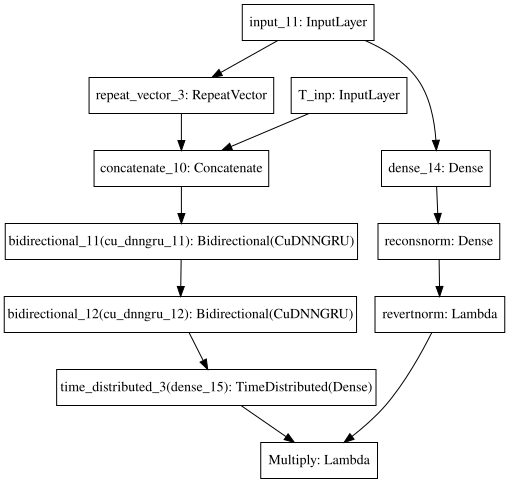

In [23]:
##### INPUTS ENCODER ######
x_lc = Input(shape = (T, channels) , name="LC_inp")
x_t = Input(shape = (T, 1) , name ="T_inp")
s_lc = Input(shape= (1,), name="scale_inp") #para pesar loss
x_lc_s = Lambda(Div_L, name="Divide")([x_lc, s_lc]) #NEW: quitar escala del dato (o escalar a una version normal)

##### CODIFY LIGHT CURVE ######
x = Concatenate(axis=-1)([x_t, x_lc_s]) 
f1 = Bidirectional(get_GRU(64, return_sequences=True))(x)
f1 = Bidirectional(get_GRU(64, return_sequences=False))(f1) 

##### CODIFY SCALE AND CONCATENATE ######
f1_s = Lambda(Norm_L, arguments={'mu':Slog_mu,'std':Slog_std}, name="norm")(s_lc) #mas capas?
f1_s = Dense(2, activation='tanh')(f1_s) #o tanh

f1 = Concatenate(axis=-1)([f1, f1_s]) #NEW: agregar escala a codificar

##### GET THE LATENT VARIABLE ######
z_mean = Dense(latent_dim,activation='linear')(f1)
z_log_var = Dense(latent_dim,activation='linear')(f1)
encoder = Model([x_t, x_lc, s_lc], [z_mean,z_log_var], name="encoder")
samp_model = define_samp_model(latent_dim) #model to sample


##### INPUTS DECODER ######
decoder_input = Input(shape=(latent_dim,))

##### RECONSTRCT SCALE ######
s_out = Dense(2, activation='tanh')(decoder_input)
s_out = Dense(1, activation='linear', name="reconsnorm")(s_out) #NEW: aprende s 
s_out = Lambda(RevertNorm_L, arguments={'mu':Slog_mu,'std':Slog_std},name="revertnorm")(s_out) #NEW: volver a escala normal 
s_hat = Model(decoder_input, s_out)(samp_model(encoder([x_t, x_lc, s_lc])))
S_model = Model([x_t, x_lc, s_lc], s_hat)

##### RECONSTRUCT LIGHT CURVE ######
decode = RepeatVector(T)(decoder_input)
decode = Concatenate(axis=-1)([x_t, decode]) #add time decode
decode = Bidirectional(get_GRU(64, return_sequences=True))(decode) #bidirectional
decode = Bidirectional(get_GRU(64, return_sequences=True))(decode) #bidirectional

decode = TimeDistributed(Dense(1, activation='linear'))(decode)
decode = Lambda(Mul_L, name="Multiply")([decode, s_out]) #NEW: recuperar escala de dato (multiplicar por std)
generator = Model([x_t, decoder_input], decode, name="generator")


##### VAE MODEL ######
out = generator([x_t, samp_model(encoder([x_t, x_lc, s_lc])) ])
vae = Model([x_t, x_lc, s_lc], out)

vae.get_layer("encoder").load_weights("./models/VAE_S_%dT_%dD_%de_E.h5"%(T,latent_dim,EPOCHS))
vae.get_layer("generator").load_weights("./models/VAE_S_%dT_%dD_%de_D.h5"%(T,latent_dim,EPOCHS))

vae.summary()
SVG(model_to_dot(generator).create(prog='dot', format='svg'))

----- EVALUANDO RECONSTRUCCION DE LA CURVA -----


/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


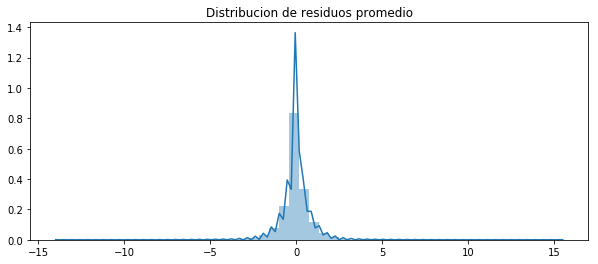

------------- Error -------------
RMSE (+-) =  0.6983228740910228
MAE  (+-) =  0.48470123980721896
------------- Smoothness -------------
AutoCorr lag-one =  0.6120249966367607
Diff MEAN =  0.069276323270278
------------- Residual -------------
AutoCorr lag-one =  -0.041034712788620684
Mean (+) STD = 0.002888 (+) 0.697792
Spectral H =  0.8991426698723484
---------------------------------------
MSE de escala escalado=  0.2637106441458444
Real scale = 0.000016
Pred scale = 0.000016


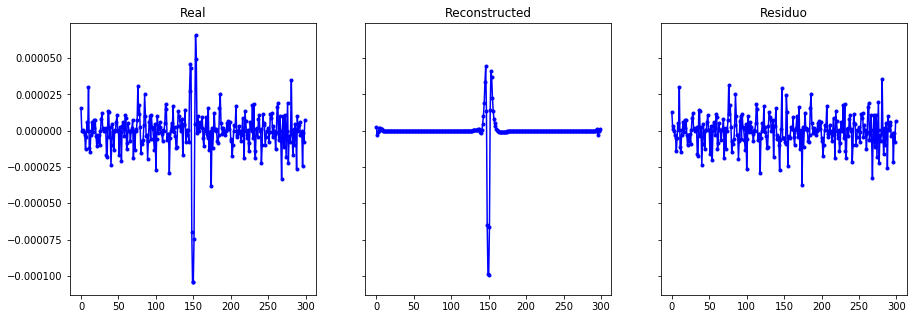

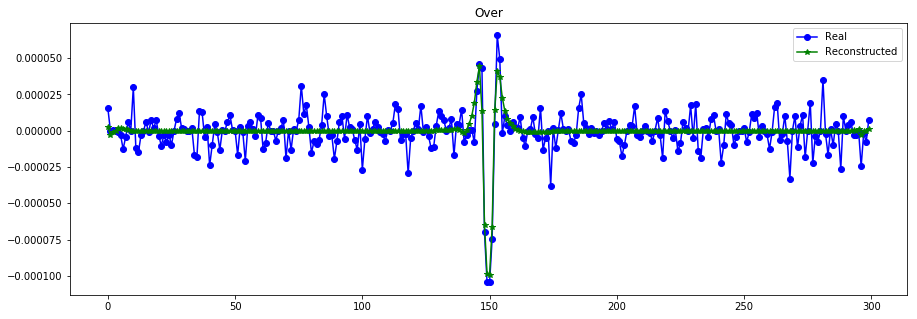

----------------------------------------------------------------
Real scale = 0.000011
Pred scale = 0.000010


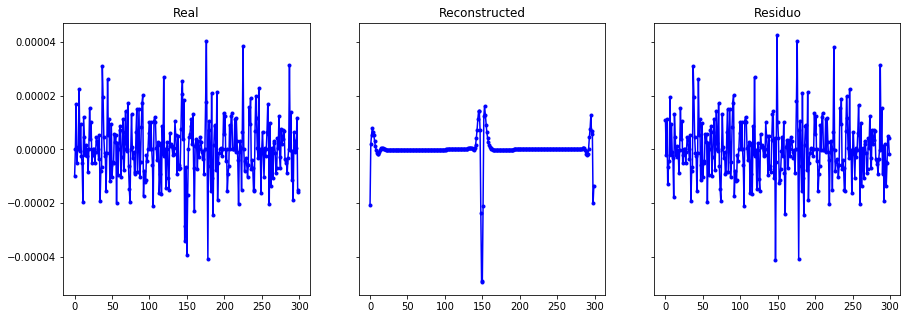

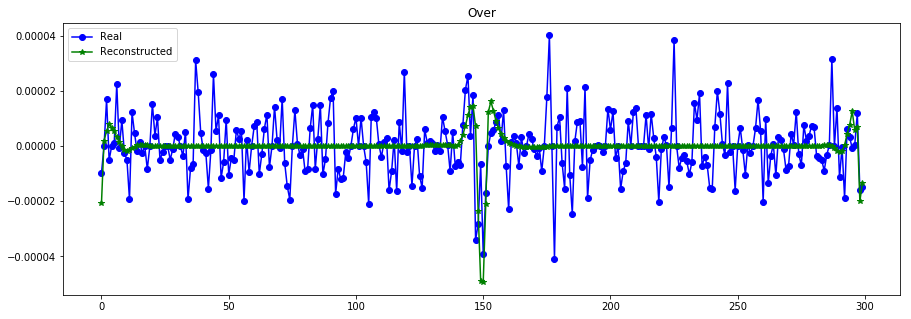

----------------------------------------------------------------
Real scale = 0.000013
Pred scale = 0.000014


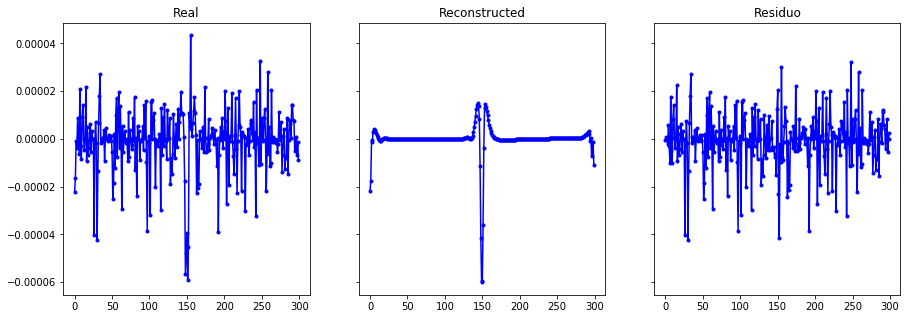

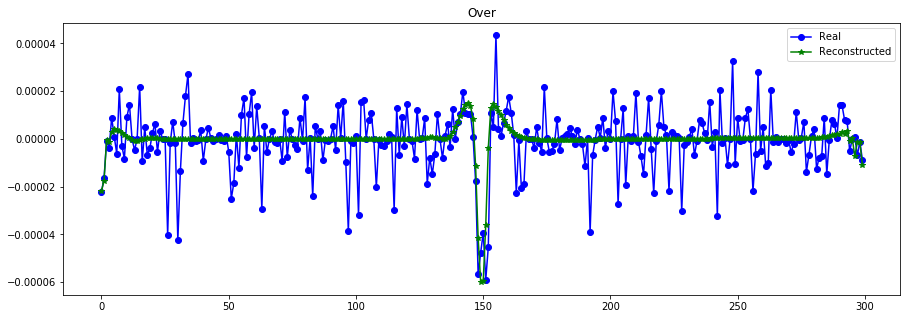

----------------------------------------------------------------
Real scale = 0.000069
Pred scale = 0.000072


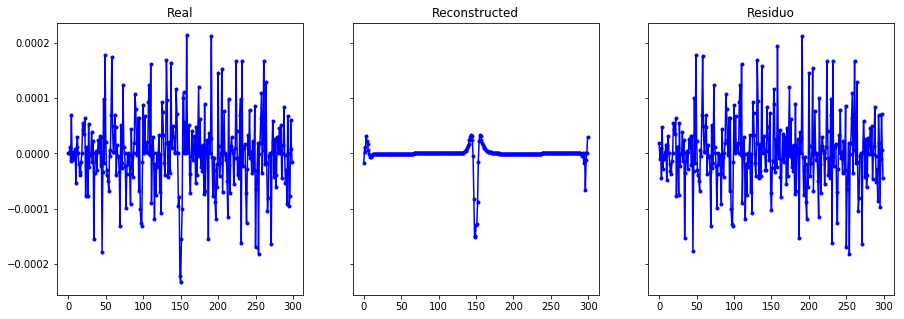

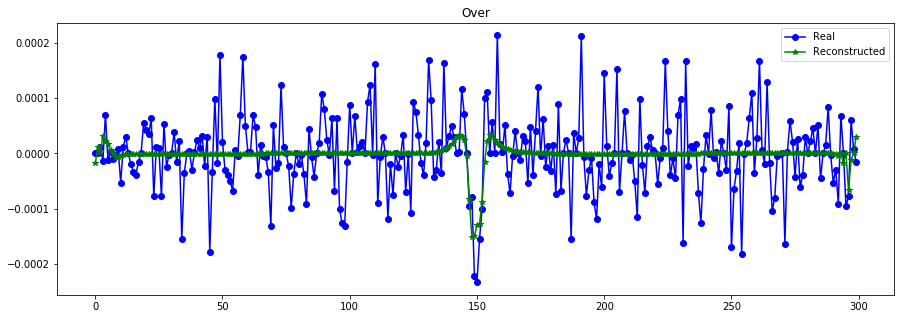

----------------------------------------------------------------
Real scale = 0.000019
Pred scale = 0.000022


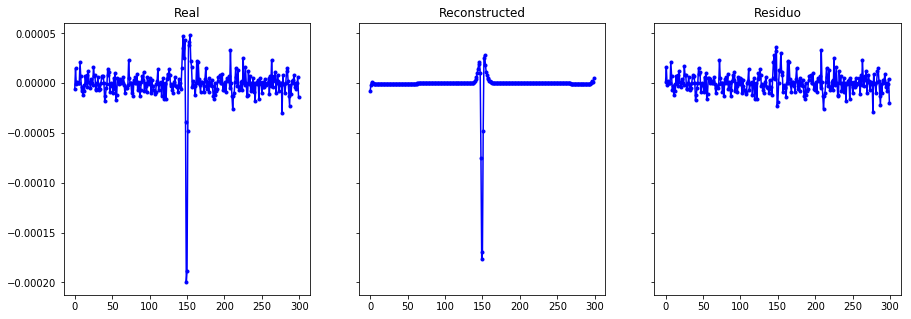

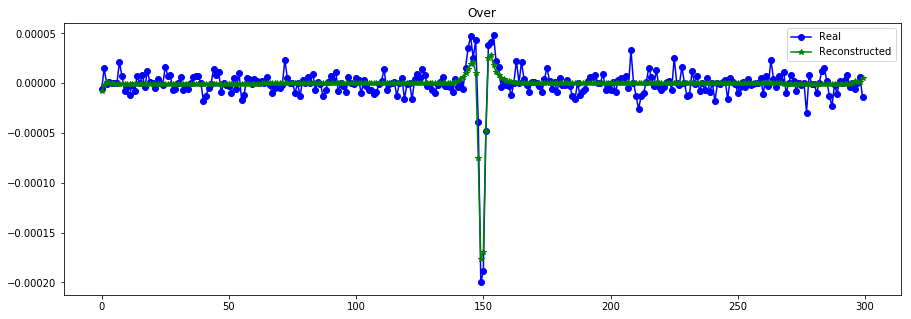

----------------------------------------------------------------
Real scale = 0.000030
Pred scale = 0.000033


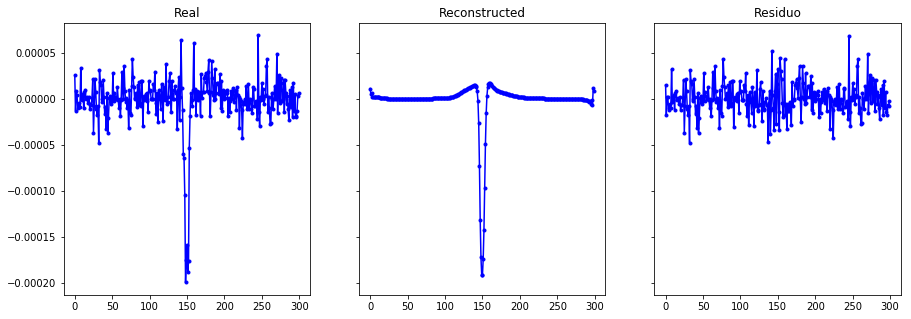

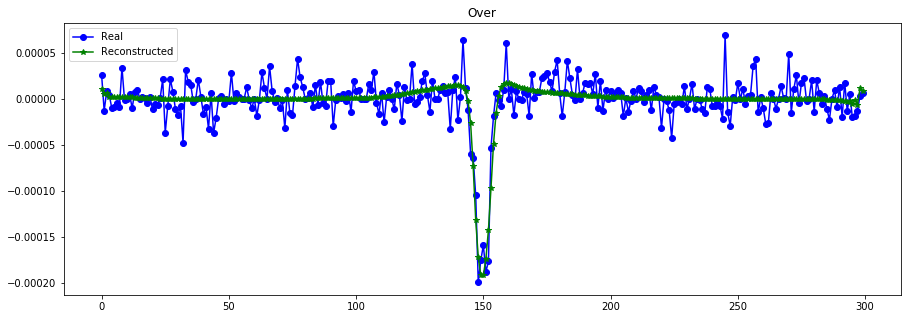

----------------------------------------------------------------
Real scale = 0.000047
Pred scale = 0.000052


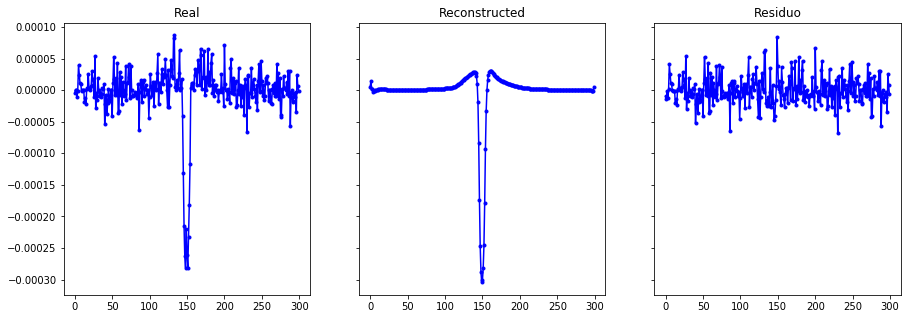

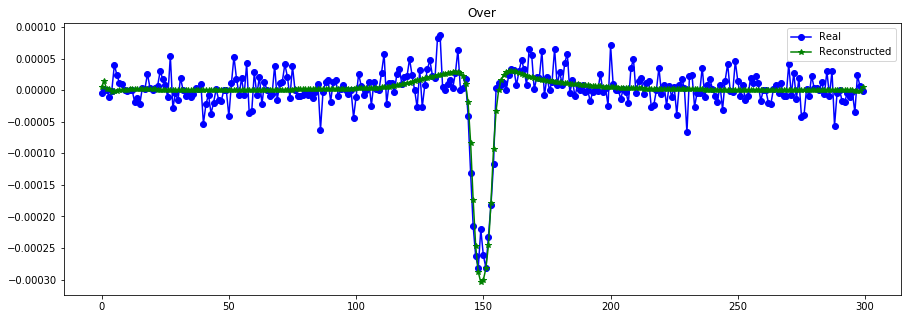

----------------------------------------------------------------
Real scale = 0.000009
Pred scale = 0.000009


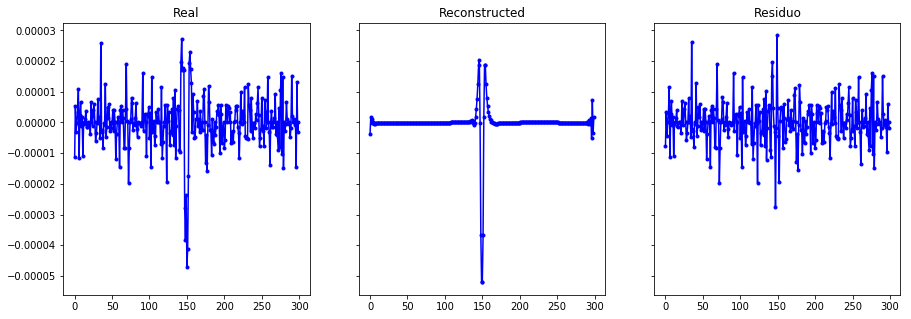

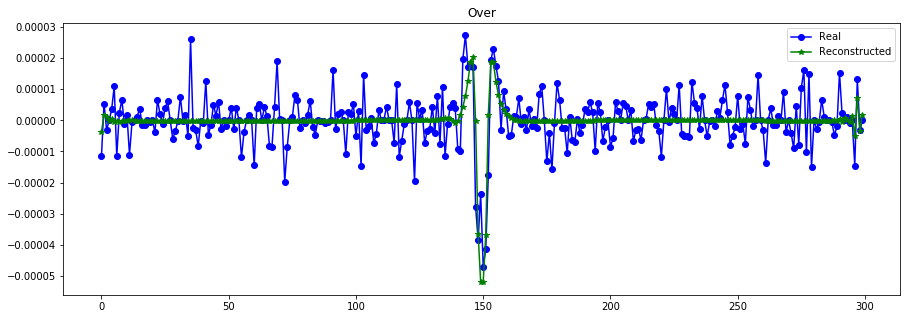

----------------------------------------------------------------
Real scale = 0.000032
Pred scale = 0.000034


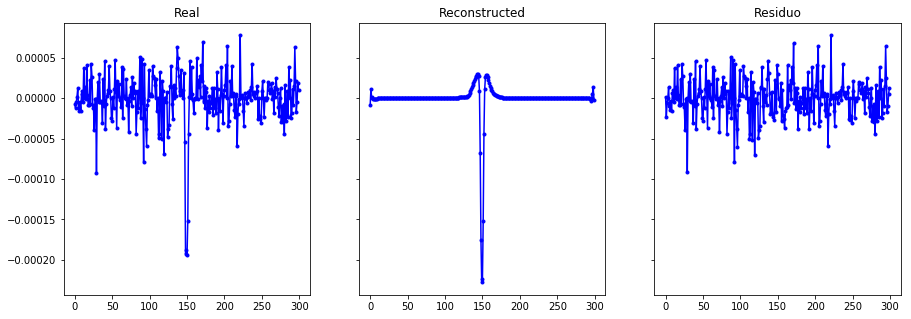

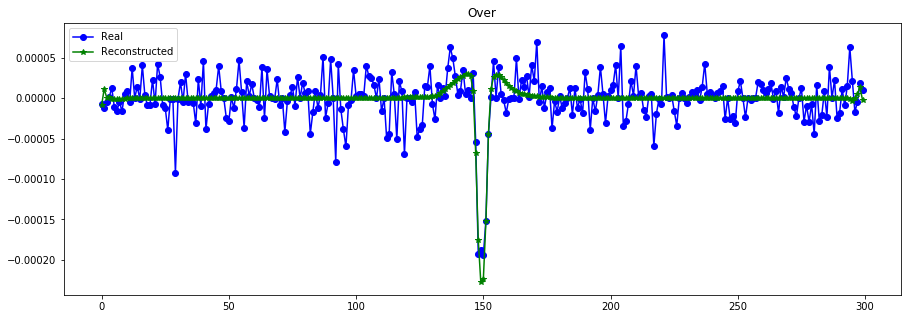

----------------------------------------------------------------
Real scale = 0.000010
Pred scale = 0.000010


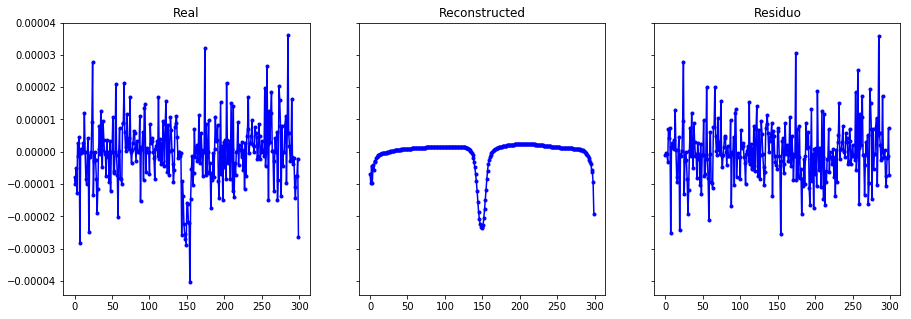

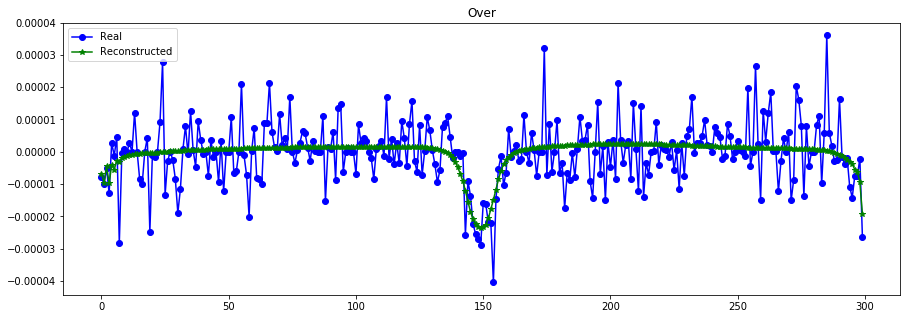

----------------------------------------------------------------
Real scale = 0.000023
Pred scale = 0.000021


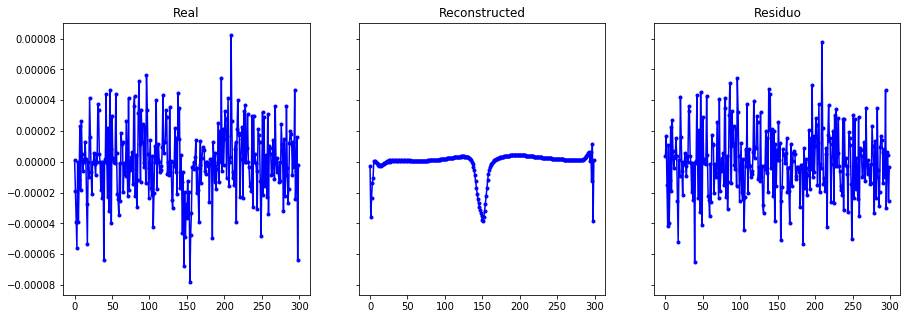

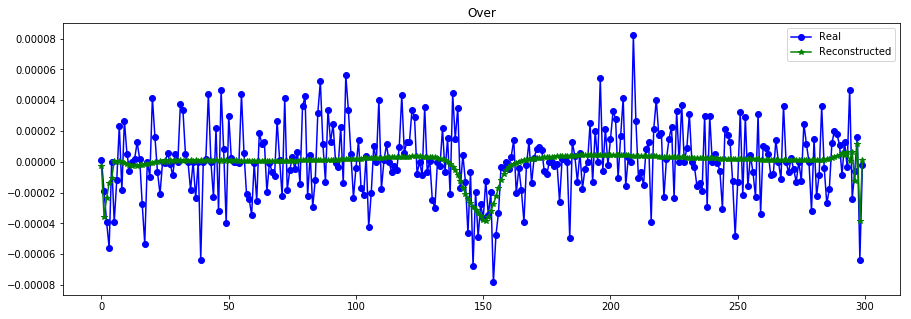

----------------------------------------------------------------
Real scale = 0.000017
Pred scale = 0.000017


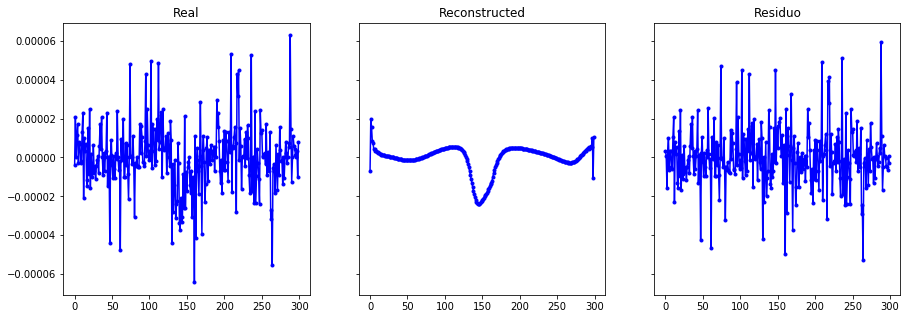

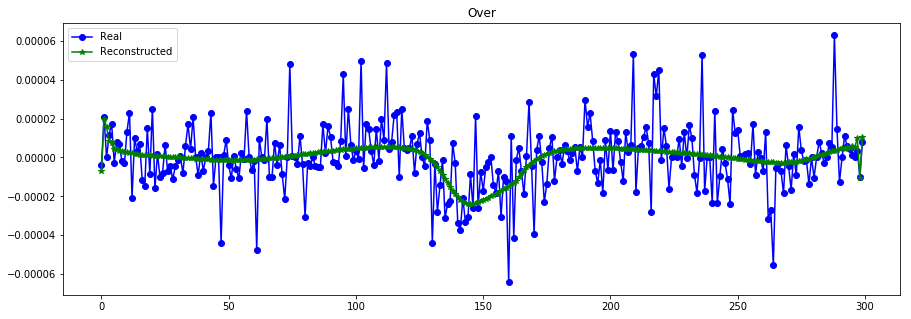

----------------------------------------------------------------
Real scale = 0.000013
Pred scale = 0.000015


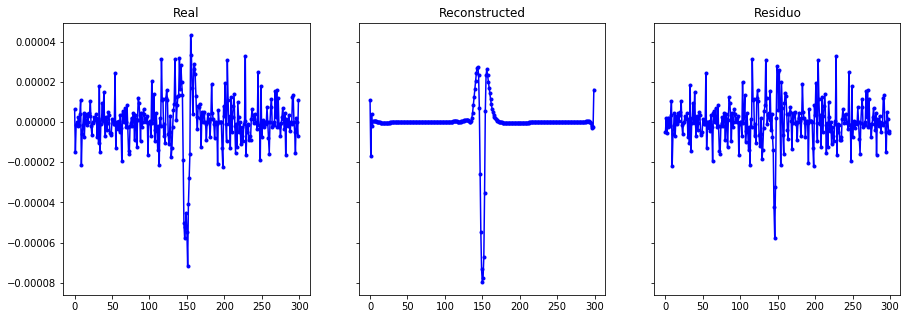

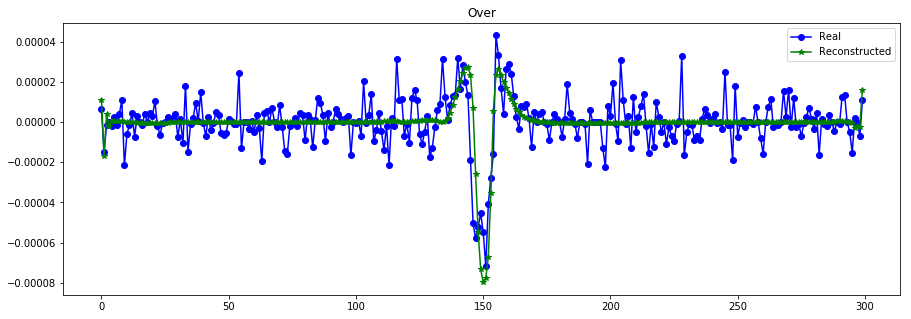

----------------------------------------------------------------
Real scale = 0.000013
Pred scale = 0.000014


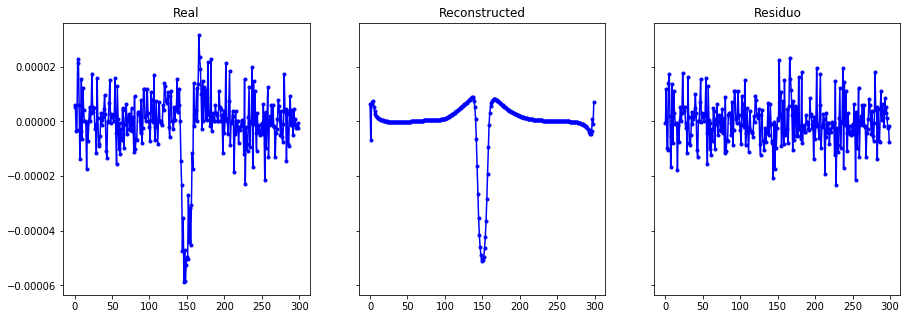

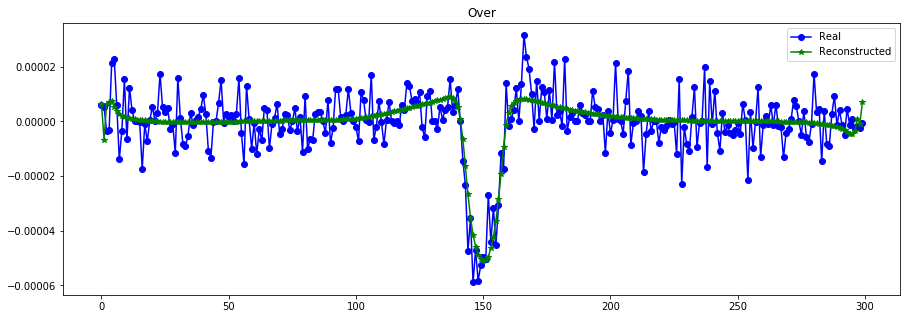

----------------------------------------------------------------
Real scale = 0.000068
Pred scale = 0.000082


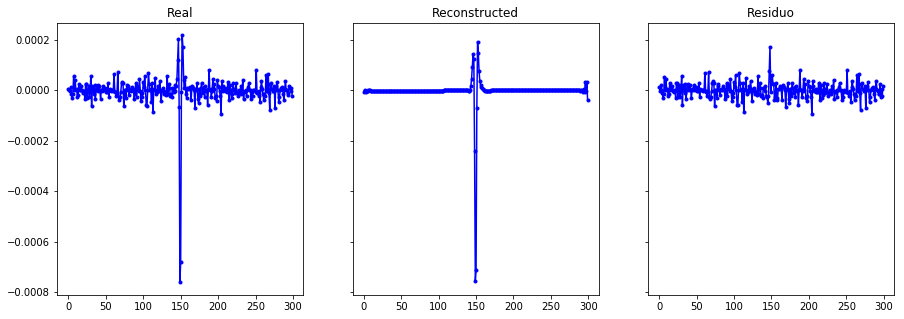

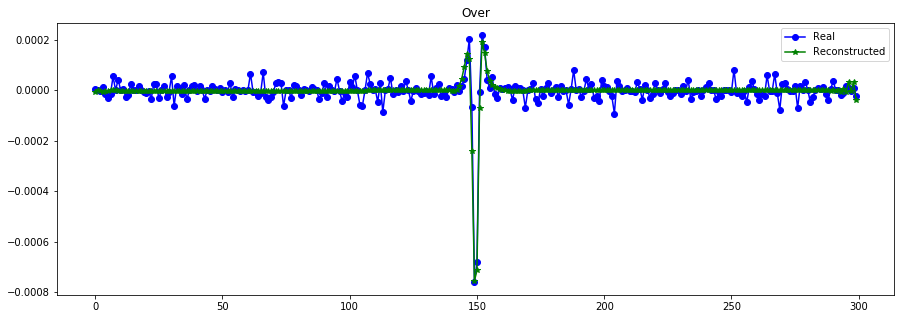

----------------------------------------------------------------


In [17]:
X_train_hat = vae.predict([X_train_t[:N], X_train[:N], S_train[:N]], batch_size=512)
evaluate_reconst(X_train[:N]/S_train[:N,None,:], X_train_hat/S_train[:N,None,:])

S_train_hat = S_model.predict([X_train_t[:N],X_train[:N], S_train[:N]], batch_size=512)
print("MSE de escala escalado= ",mean_squared_error(S_train[:N], S_train_hat)*(1/S_std)**2)

plot_n_lc(X_train[:N,:,0], X_train_hat, n= 15, s=[S_train[:N],S_train_hat]) #

----- EVALUANDO RECONSTRUCCION DE LA CURVA -----


/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


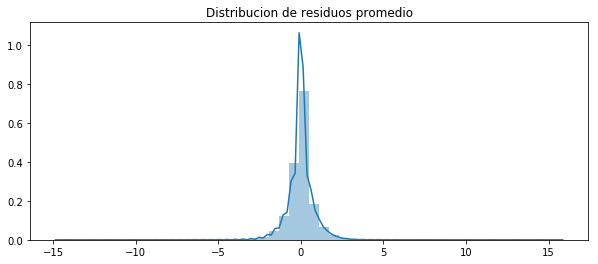

------------- Error -------------
RMSE (+-) =  0.7248961392506232
MAE  (+-) =  0.4891263880765751
------------- Smoothness -------------
AutoCorr lag-one =  0.611758735050012
Diff MEAN =  0.06369971793802165
------------- Residual -------------
AutoCorr lag-one =  -0.01195036333399215
Mean (+) STD = -0.001578 (+) 0.724511
Spectral H =  0.8979366481576887
---------------------------------------
MSE de escala escalado=  0.23453824589376923
Real scale = 0.000011
Pred scale = 0.000008


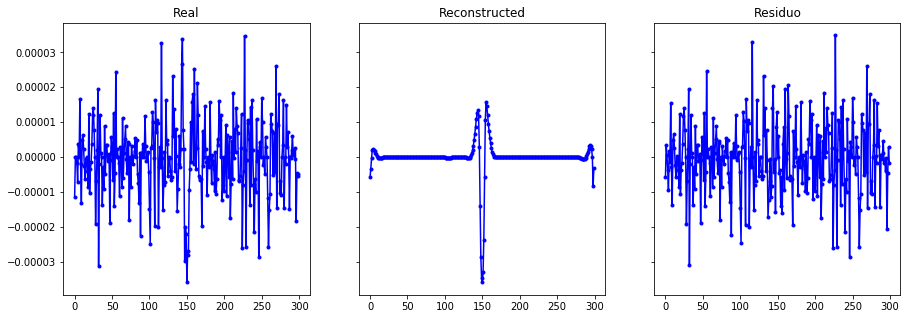

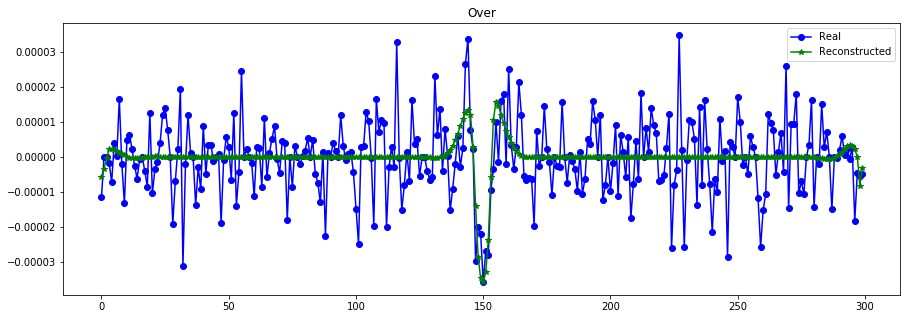

----------------------------------------------------------------
Real scale = 0.000011
Pred scale = 0.000014


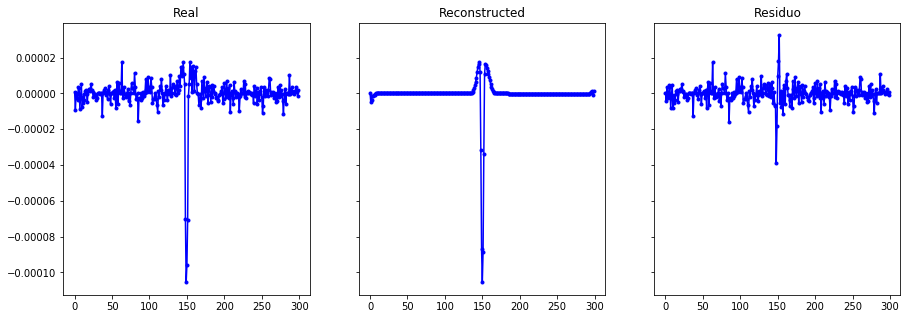

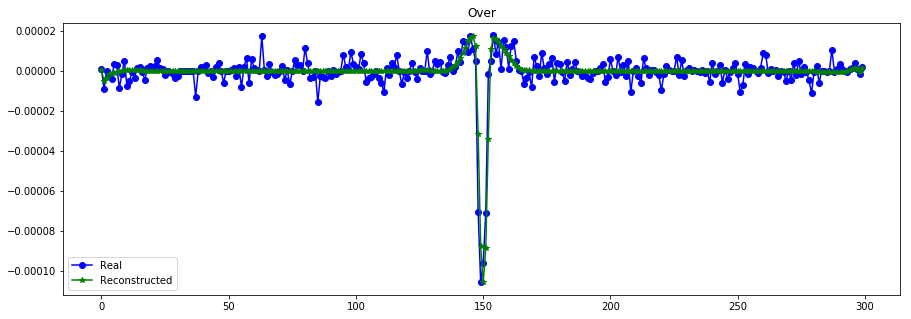

----------------------------------------------------------------
Real scale = 0.000009
Pred scale = 0.000009


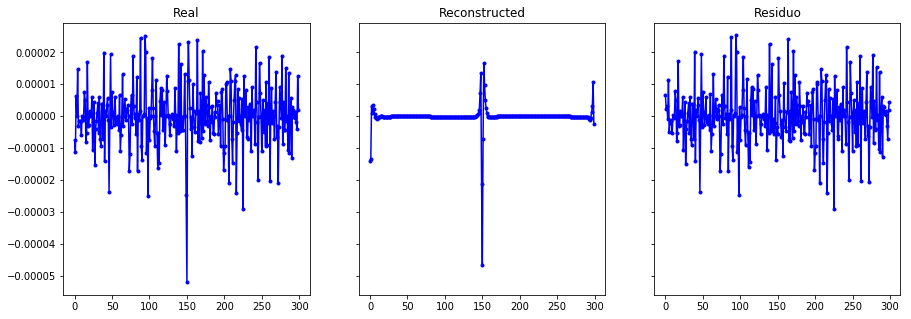

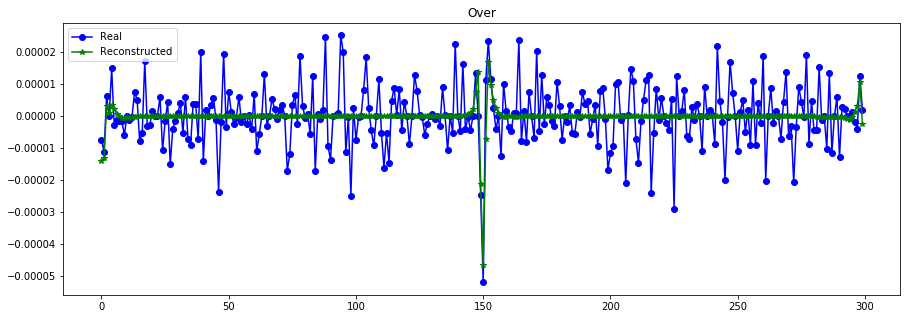

----------------------------------------------------------------
Real scale = 0.000020
Pred scale = 0.000022


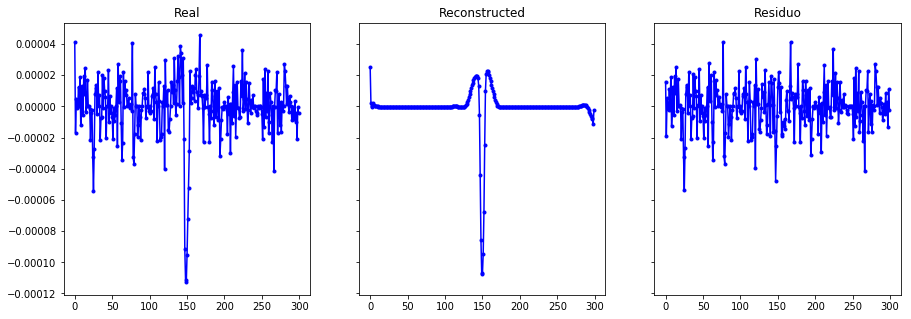

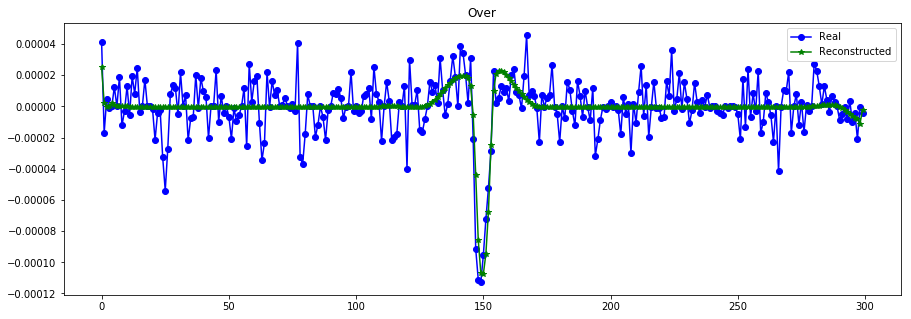

----------------------------------------------------------------
Real scale = 0.000007
Pred scale = 0.000007


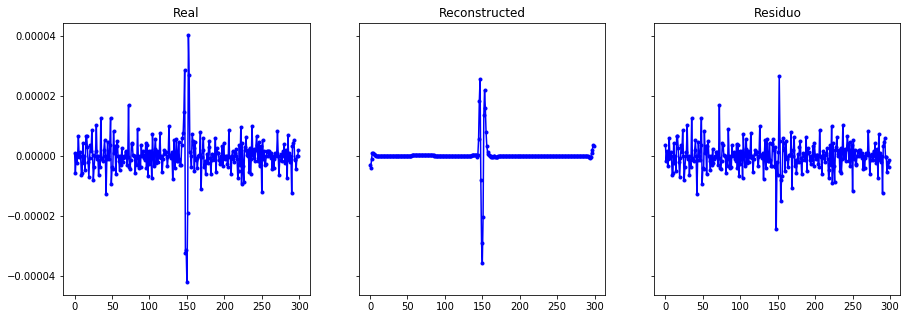

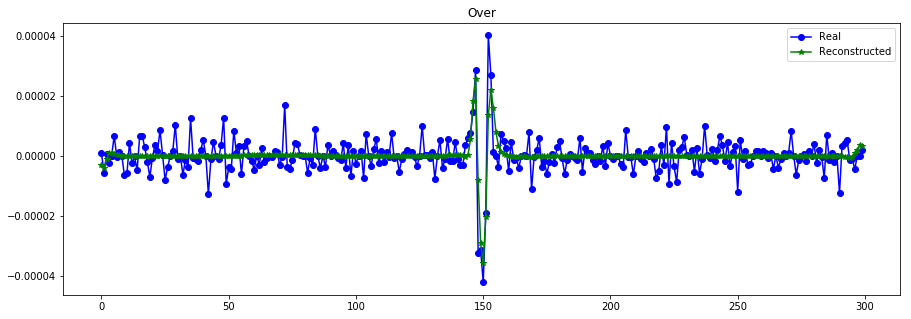

----------------------------------------------------------------
Real scale = 0.000111
Pred scale = 0.000137


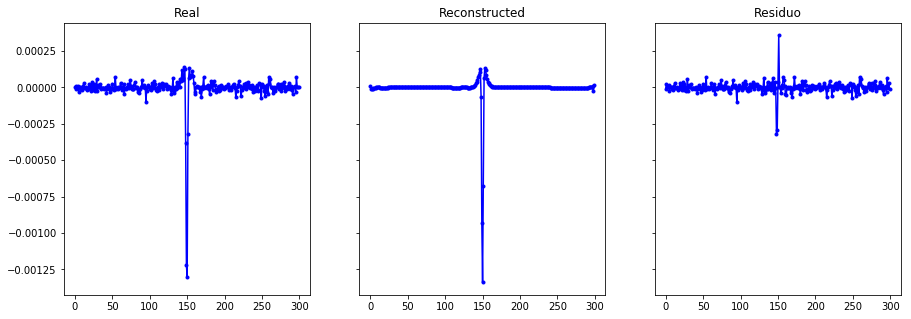

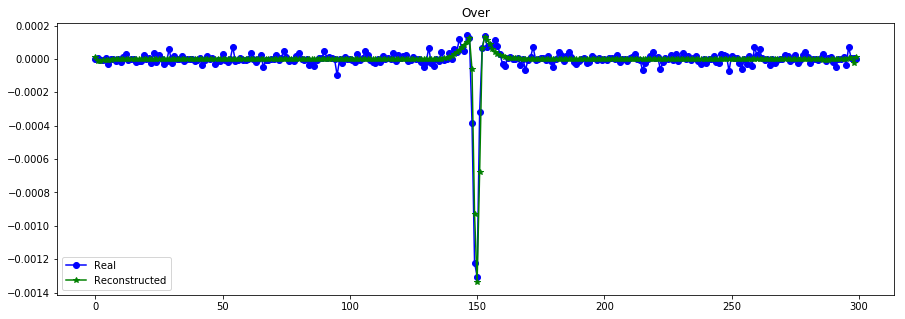

----------------------------------------------------------------
Real scale = 0.000063
Pred scale = 0.000072


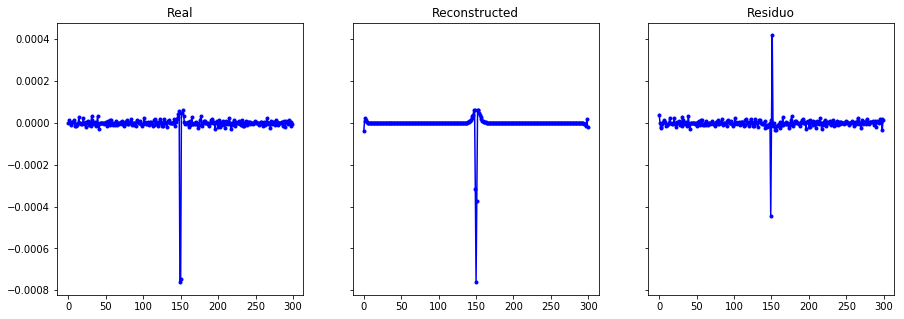

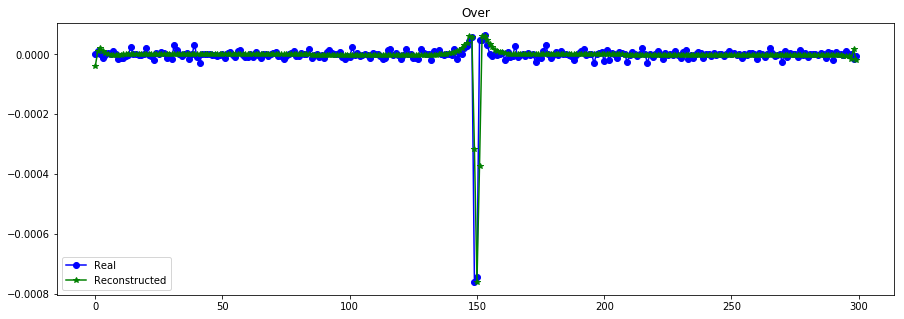

----------------------------------------------------------------
Real scale = 0.000014
Pred scale = 0.000013


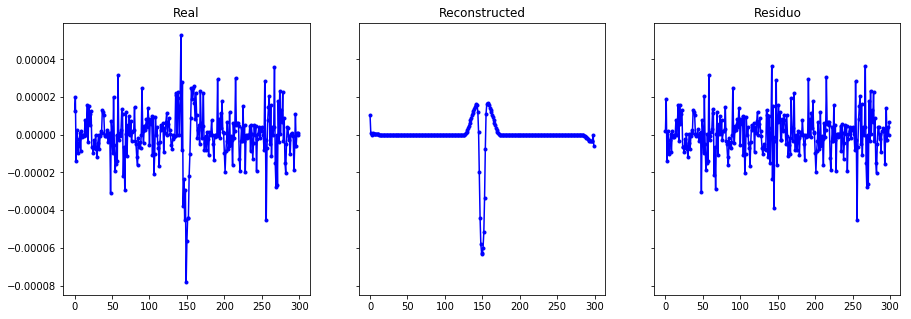

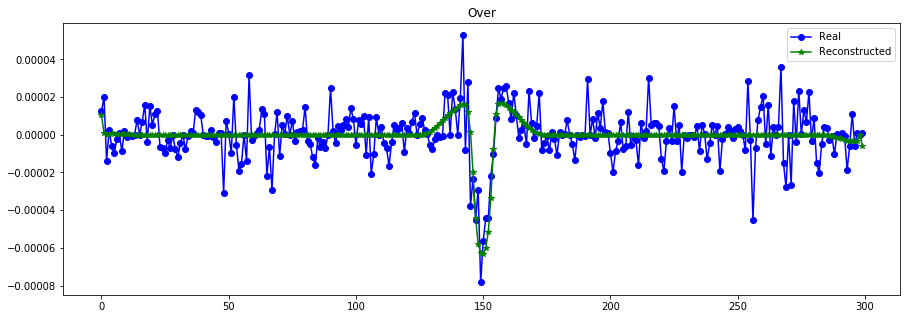

----------------------------------------------------------------
Real scale = 0.000024
Pred scale = 0.000026


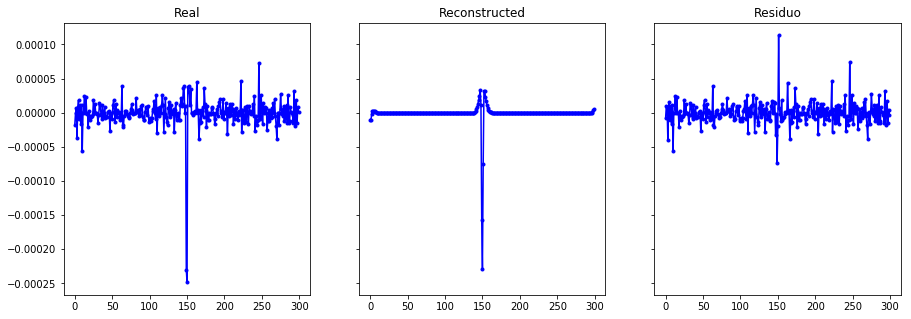

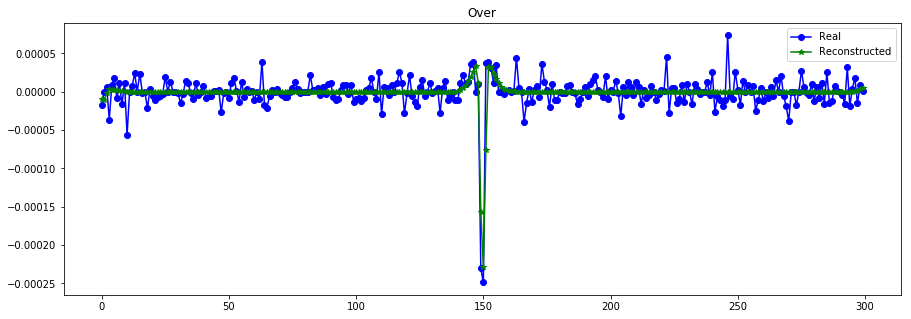

----------------------------------------------------------------
Real scale = 0.000012
Pred scale = 0.000011


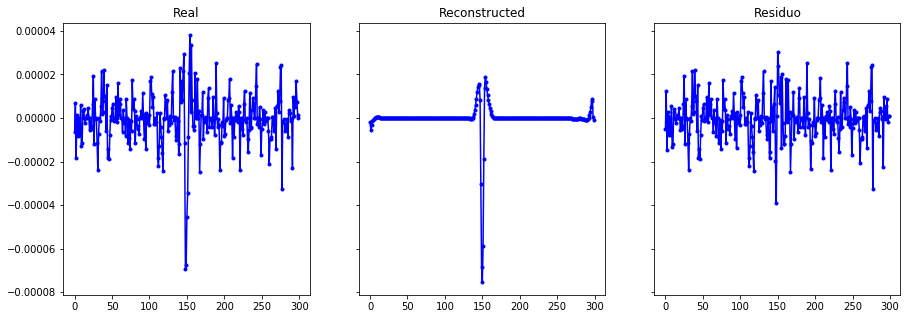

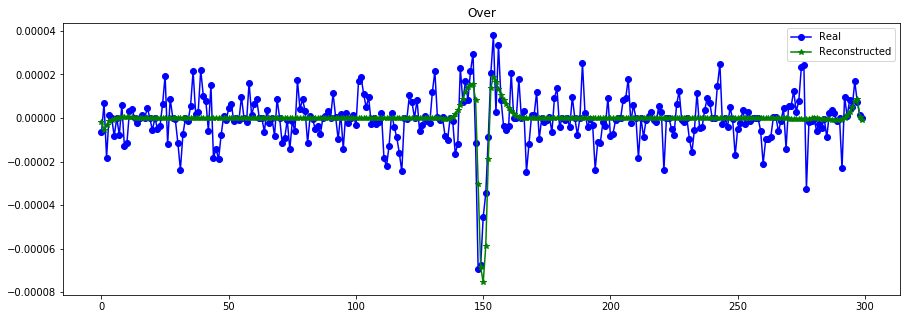

----------------------------------------------------------------
Real scale = 0.000006
Pred scale = 0.000006


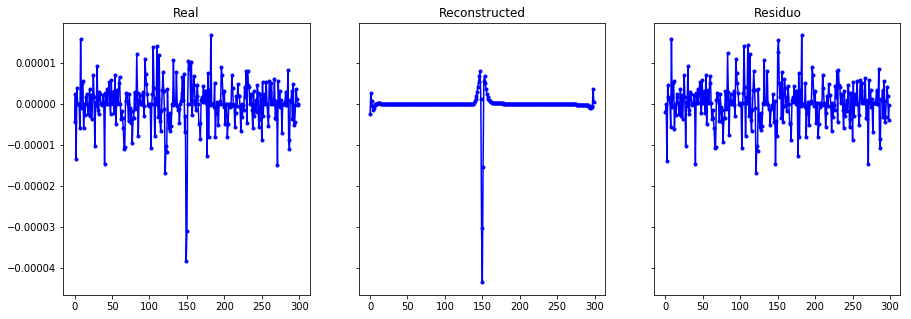

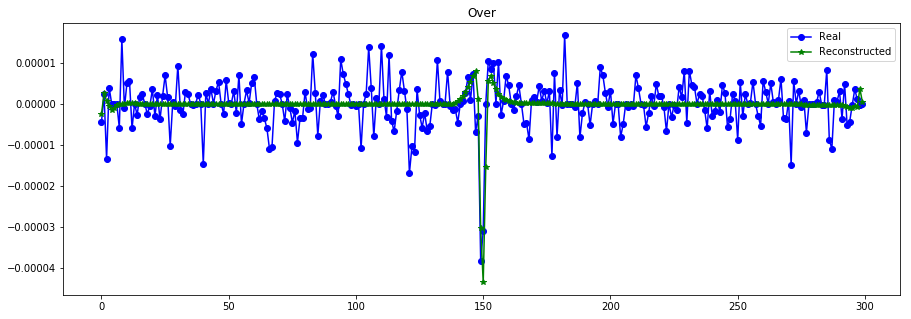

----------------------------------------------------------------
Real scale = 0.000020
Pred scale = 0.000017


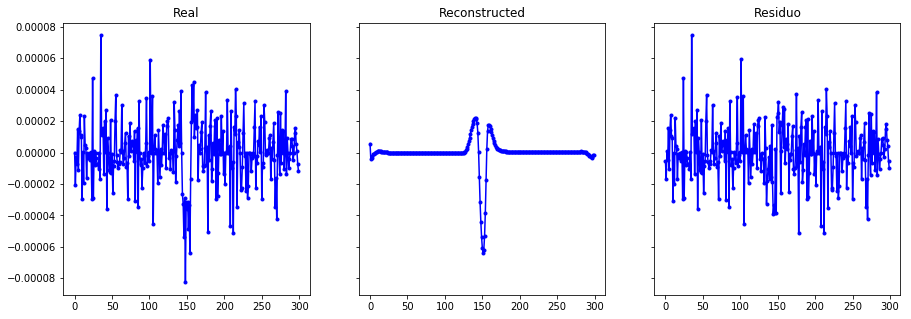

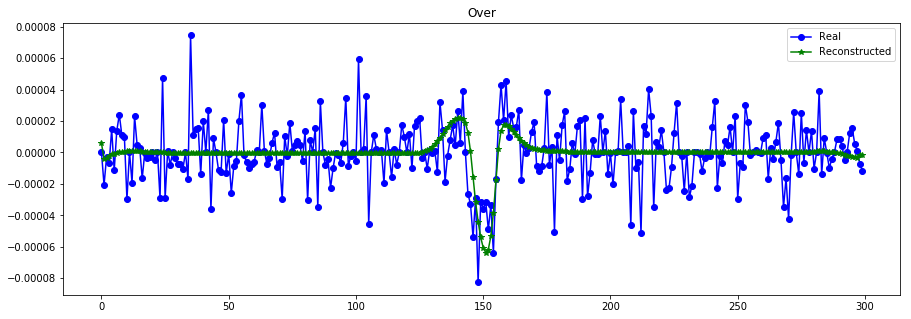

----------------------------------------------------------------
Real scale = 0.000706
Pred scale = 0.000747


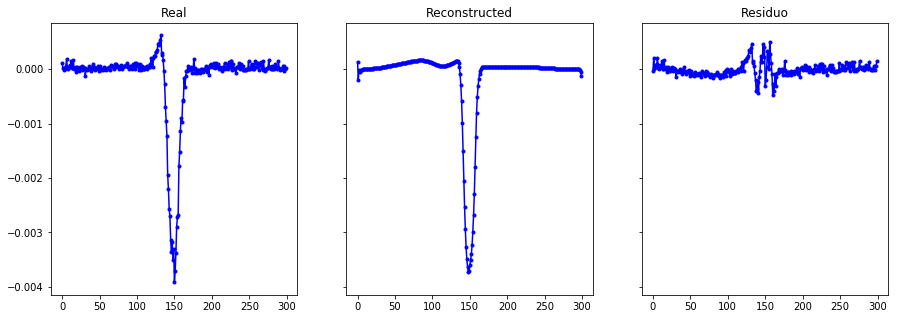

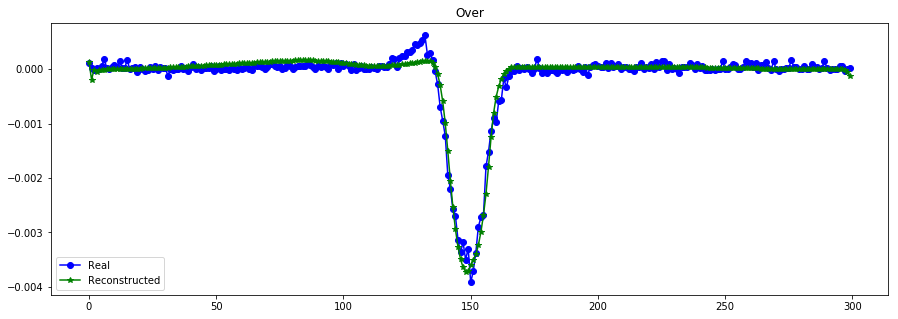

----------------------------------------------------------------
Real scale = 0.000009
Pred scale = 0.000007


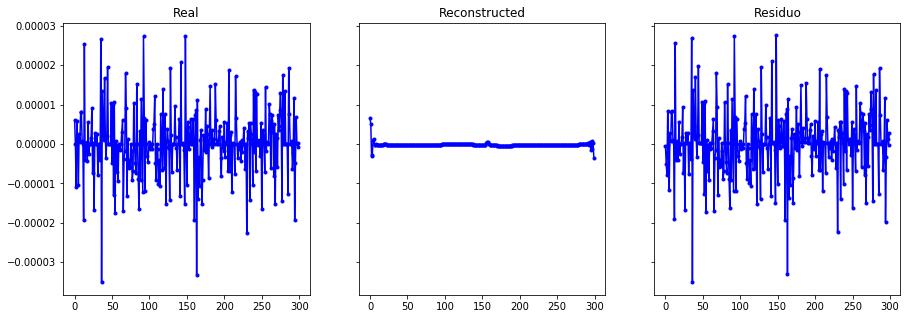

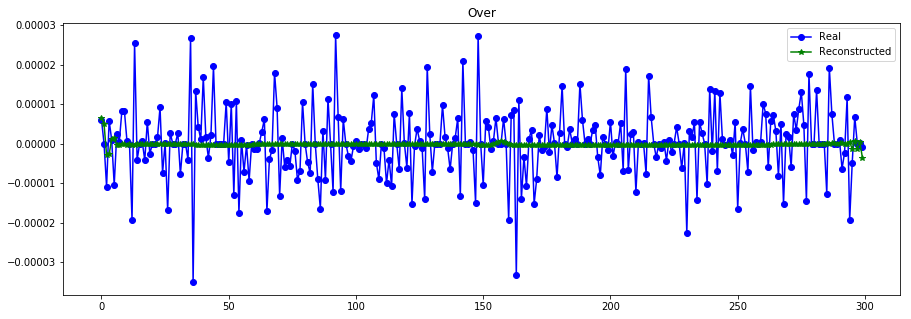

----------------------------------------------------------------
Real scale = 0.000074
Pred scale = 0.000087


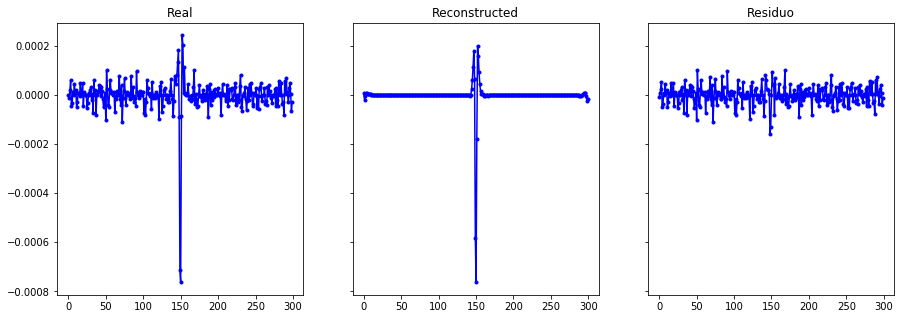

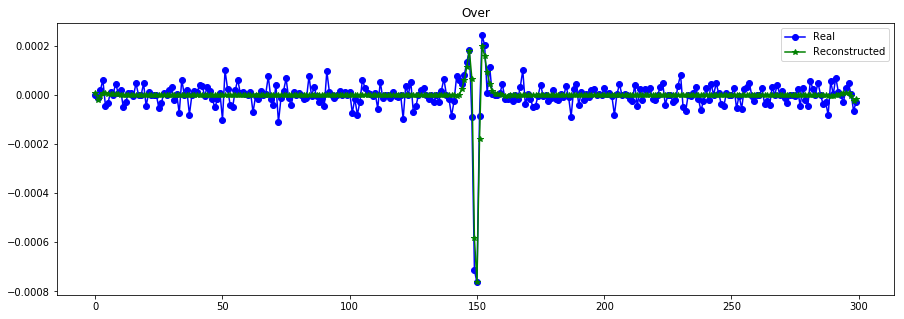

----------------------------------------------------------------


In [24]:
X_train_hat = vae.predict([X_train_t[:N], X_train[:N], S_train[:N]], batch_size=512)
evaluate_reconst(X_train[:N]/S_train[:N,None,:], X_train_hat/S_train[:N,None,:])

S_train_hat = S_model.predict([X_train_t[:N],X_train[:N], S_train[:N]], batch_size=512)
print("MSE de escala escalado= ",mean_squared_error(S_train[:N], S_train_hat)*(1/S_std)**2)

plot_n_lc(X_train[:N,:,0], X_train_hat, n= 15, s=[S_train[:N],S_train_hat]) # 16

### Vizualize encoded

In [25]:
def transform_plot(model, data, just_plot=False):
    if just_plot:
        to_plot = data
    else:
        to_plot = model.fit_transform(data)
        
    plt.figure(figsize=(10,7))
    plt.scatter(to_plot[:,0],to_plot[:,1])
    plt.show()
    return to_plot

df_meta = pd.read_csv("../../KOI_Data/kepler_dataset.csv")
labels_transit = df_meta["NExScI Disposition"].values[mask_transit]
all_labels = df_meta["NExScI Disposition"].values

In [26]:
X_train_all = X_fold_lc
X_train_t_all = X_fold_time

S_train_all = np.std(X_train_all, axis=1) #all data

X_train_all = np.expand_dims(X_train_all, axis=-1)
X_train_t_all = np.expand_dims(X_train_t_all, axis=-1)
X_train_t_all.shape

(8054, 300, 1)

/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


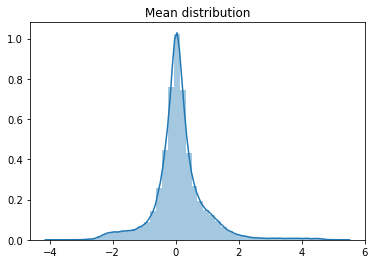

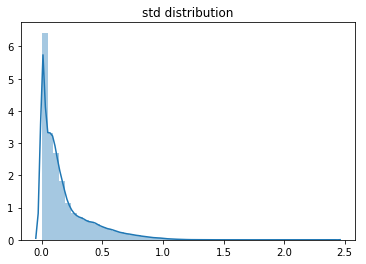

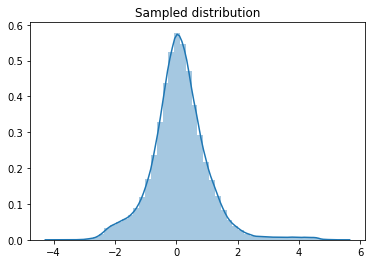

In [27]:
encoder_all = vae.get_layer("encoder")
z_aux, z_var_aux = encoder_all.predict([X_train_t_all,X_train_all, S_train_all], batch_size=512)

samp_model = define_samp_model(latent_dim) #model to sample
samp_encoder = Model(encoder_all.inputs, samp_model(encoder_all.outputs) )
z_samp = samp_encoder.predict([X_train_t_all, X_train_all, S_train_all], batch_size=512)

sns.distplot(z_aux.flatten())
plt.title("Mean distribution")
plt.show()

sns.distplot(np.exp(z_var_aux.flatten()))
plt.title("std distribution")
plt.show()

sns.distplot(z_samp.flatten())
plt.title("Sampled distribution")
plt.show()

/home/fmena/.local/lib/python3.5/site-packages/sklearn/utils/extmath.py:530: RuntimeWarning: invalid value encountered in multiply
  v *= signs[:, np.newaxis]


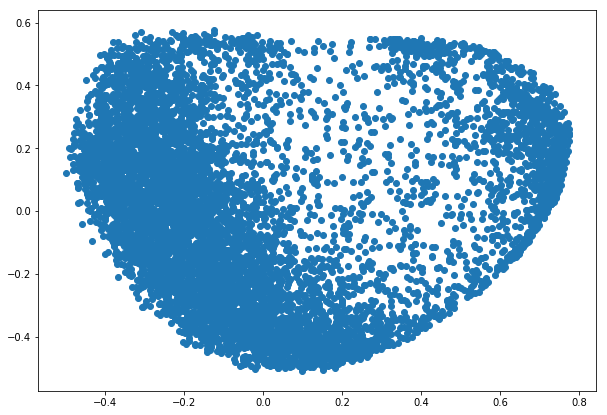

In [43]:
from sklearn.decomposition import KernelPCA
model = KernelPCA(2, kernel='rbf', gamma=None, n_jobs=-1)
    
to_plot = transform_plot(model, z_aux)

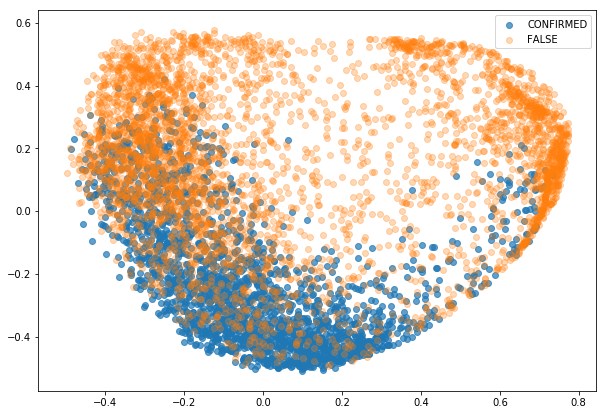

In [44]:
plt.figure(figsize=(10,7))
mask_ = (all_labels=="CONFIRMED")
plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="CONFIRMED", alpha=0.7)

mask_ = (all_labels=="FALSE POSITIVE")
plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="FALSE", alpha=0.3)

plt.legend()
plt.show()

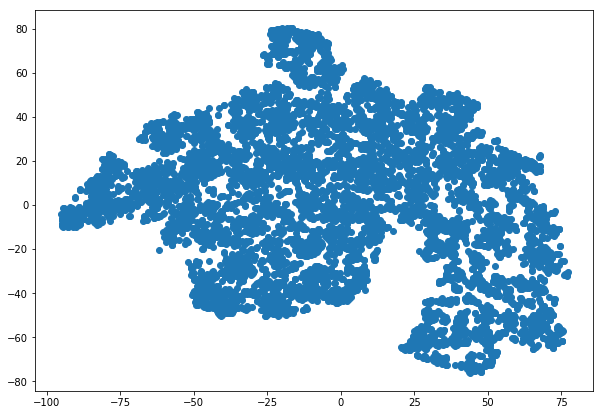

In [35]:
#tsne
from sklearn.manifold import TSNE
model = TSNE(2, metric='euclidean', n_jobs=-1)

to_plot = transform_plot(model, z_aux)

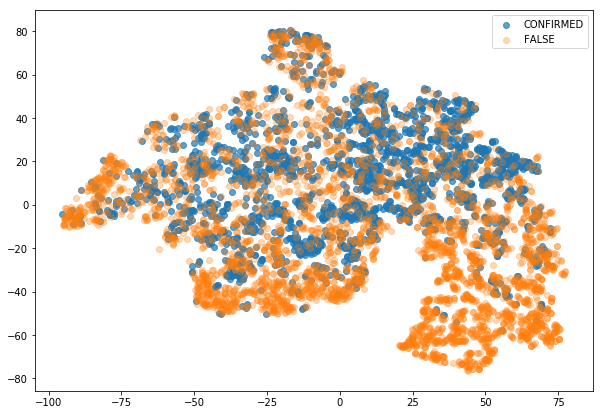

In [36]:
plt.figure(figsize=(10,7))
mask_ = (all_labels=="CONFIRMED")
plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="CONFIRMED", alpha=0.7)

mask_ = (all_labels=="FALSE POSITIVE")
plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="FALSE", alpha=0.3)

plt.legend()
plt.show()

In [28]:
np.save("./LC_features/VAE_S_%dT_%dD.npy"%(T,latent_dim), z_aux)
np.save("./LC_features/VAE_S_%dT_%dD_var.npy"%(T,latent_dim), z_var_aux)
#np.save("./LC_features/VAE_S_%dT_%dD_samp.npy"%(T,latent_dim), z_samp)
!ls ./LC_features

AE_300T_16D.npy		   MetadataLC.npy	 VAE_S_300T_16D.npy
AE_300T_32D.npy		   old			 VAE_S_300T_16D_var.npy
FourierICA_300T_32D.npy    VAE_300T_16D.npy	 VAE_S_300T_32D.npy
FourierICA_71427T_32D.npy  VAE_300T_16D_var.npy  VAE_S_300T_32D_var.npy
FourierPCA_300T_32D.npy    VAE_300T_32D.npy
FourierPCA_71427T_32D.npy  VAE_300T_32D_var.npy


In [19]:
z_aux = np.load("./LC_features/VAE_S_%dT_%dD.npy"%(T,latent_dim))
z_aux.shape

(8054, 32)

### Clustering

In [34]:
#NEW METADATA SELECTED!
metadata_used = ["Period", "Duration", "Time of Transit Epoch", "r/R", "a/R",
                 "Inclination", "Impact Parameter", 
                 "Fitted Stellar Density","Teq",
                 "Limb Darkening Coeff1", "Limb Darkening Coeff2",
                "Teff","Stellar Radius", "Stellar Mass"]
df_meta["Duration"] = df_meta["Duration"]/24

df_meta_obj = df_meta[metadata_used]

#df_meta_obj = impute_on_pandas(df_meta_obj)

from sklearn.preprocessing import StandardScaler, RobustScaler
scaler_meta = StandardScaler()
scaler_meta.fit(df_meta_obj.values[mask_transit])

StandardScaler(copy=True, with_mean=True, with_std=True)

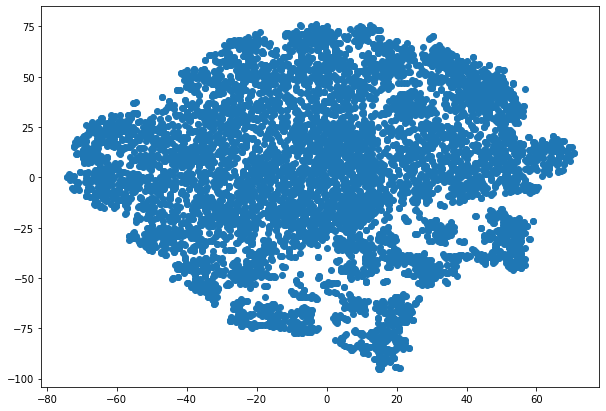

In [20]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import KernelPCA
from sklearn.manifold import TSNE

to_clu = StandardScaler().fit_transform(z_aux)

model = TSNE(2, metric='euclidean', n_jobs=-1)
#model = KernelPCA(2, kernel='rbf', gamma=None, n_jobs=-1)

to_plot = transform_plot(model, to_clu)

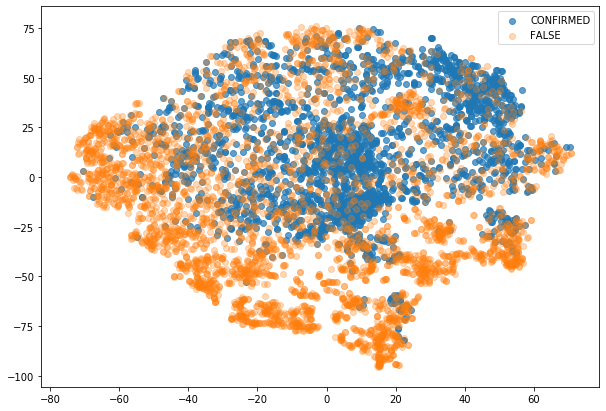

In [21]:
plt.figure(figsize=(10,7))
mask_ = (all_labels=="CONFIRMED")
plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="CONFIRMED", alpha=0.7)

mask_ = (all_labels=="FALSE POSITIVE")
plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="FALSE", alpha=0.3)

plt.legend()
plt.show()

In [51]:
from sklearn.cluster import DBSCAN
#model = DBSCAN(eps=0.8, min_samples=10, metric='euclidean', n_jobs=-1)
model = DBSCAN(eps=0.1, min_samples=10, metric='cosine', n_jobs=-1)

model.fit(to_clu)
clus_l = model.labels_
K = clus_l.max()+1

print("Cluster encontrados =",K)
clus_l

Cluster encontrados = 6


array([ 0, -1, -1, ..., -1, -1, -1])

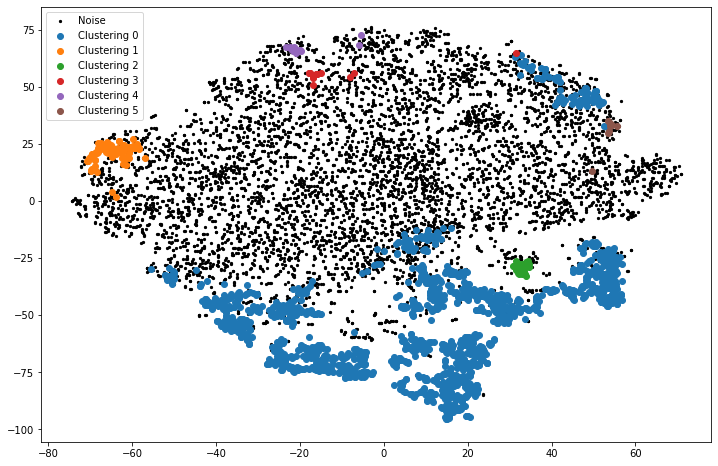

In [52]:
plt.figure(figsize=(12,8))
mask_ = (clus_l==-1)
plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="Noise", s=5, c='black')

for i in range(K):
    mask_ = (clus_l==i)
    plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="Clustering "+str(i))
plt.legend()
plt.show() ## euclidean

In [ ]:
plt.figure(figsize=(12,8))
mask_ = (clus_l==-1)
plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="Noise", s=5, c='black')

for i in range(K):
    mask_ = (clus_l==i)
    plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="Clustering "+str(i))
plt.legend()
plt.show() ## COSINE

In [25]:
from sklearn.cluster import DBSCAN
model = DBSCAN(eps=2.5, min_samples=10, metric='euclidean', n_jobs=-1)

model.fit(to_clu)
clus_l = model.labels_
K = clus_l.max()+1

print("Cluster encontrados =",K)
clus_l

Cluster encontrados = 2


array([ 0, -1, -1, ..., -1, -1, -1])

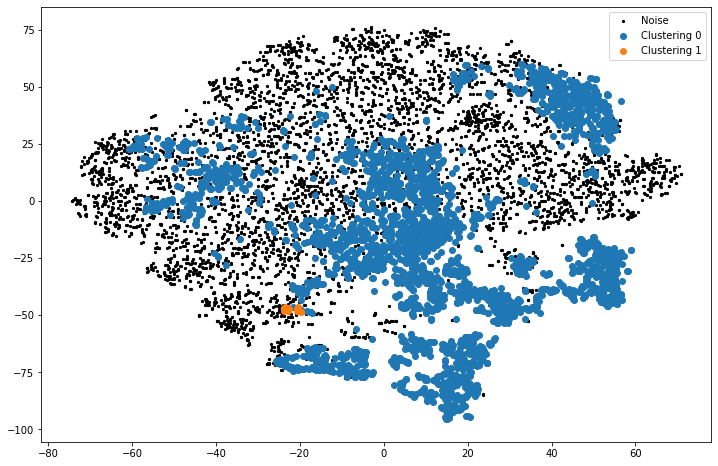

In [26]:
plt.figure(figsize=(12,8))
mask_ = (clus_l==-1)
plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="Noise", s=5, c='black')

for i in range(K):
    mask_ = (clus_l==i)
    plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="Clustering "+str(i))
plt.legend()
plt.show()

#### clustering sobre FP


In [136]:
mask_FP = df_meta["NExScI Disposition"].values ==  "FALSE POSITIVE"
z_FP = z_aux[mask_FP]
aux = StandardScaler().fit_transform(z_FP)

Ks = []
for e in np.arange(0.1,3, 0.1):
    model = DBSCAN(eps=e, min_samples=5, metric='euclidean', n_jobs=-1)

    clus_l = model.fit(aux).labels_
    K = clus_l.max()+1
    Ks.append(K)

(2281, 32)

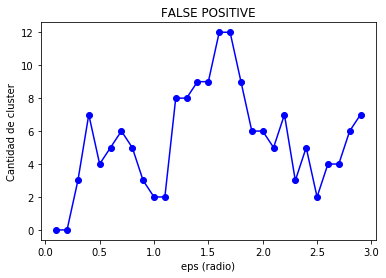

In [135]:
plt.plot(np.arange(0.1,3, 0.1),Ks , 'bo-')
plt.ylabel("Cantidad de cluster")
plt.xlabel("eps (radio)")
plt.title("FALSE POSITIVE")
plt.show()

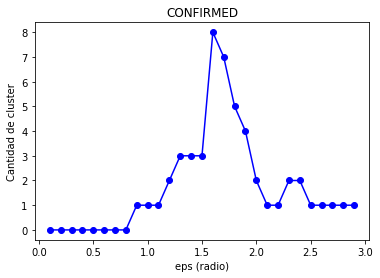

In [138]:
plt.plot(np.arange(0.1,3, 0.1),Ks, 'bo-')
plt.ylabel("Cantidad de cluster")
plt.xlabel("eps (radio)")
plt.title("CONFIRMED")
plt.show()

### Visualizar info de clusters

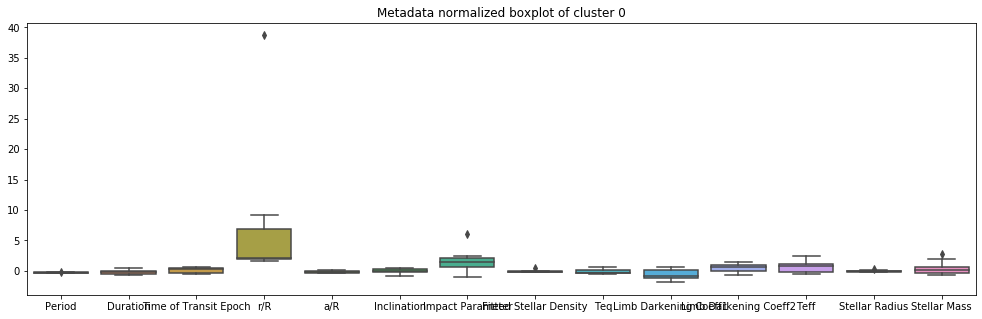

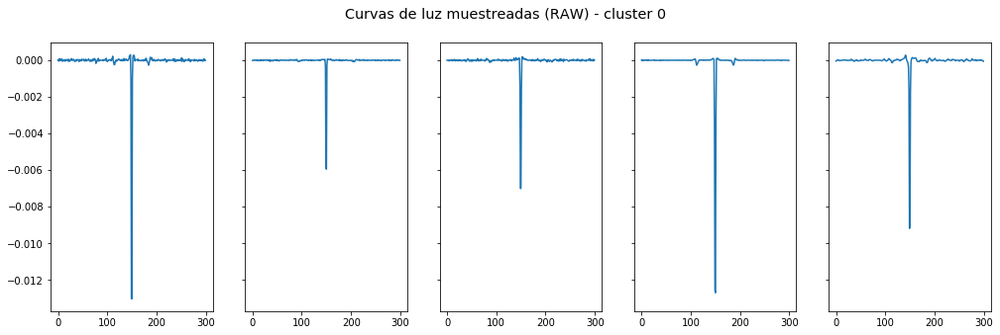

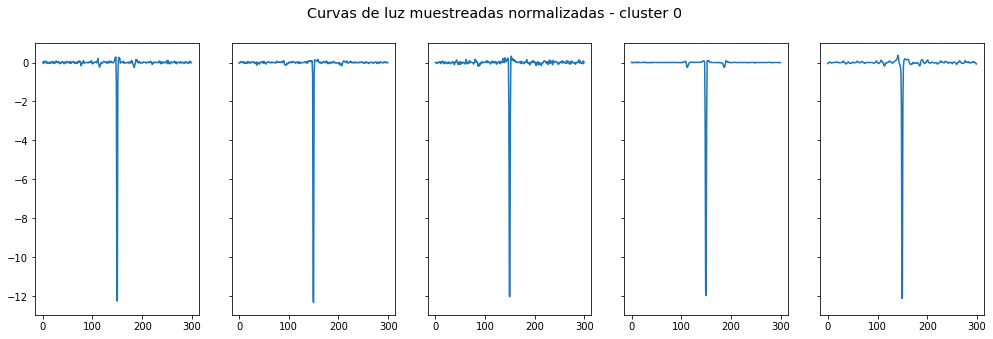

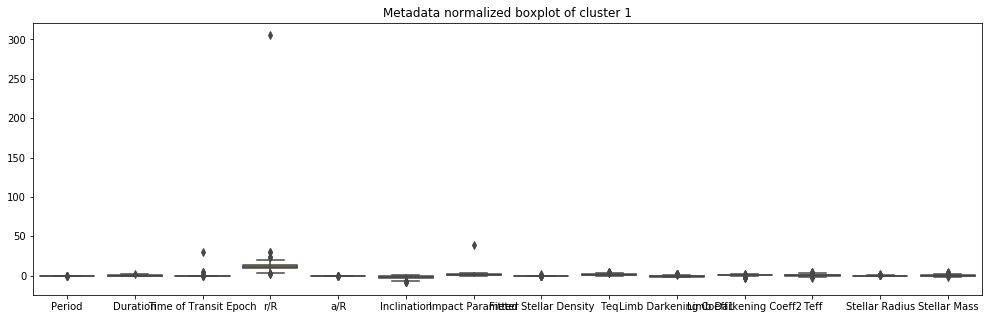

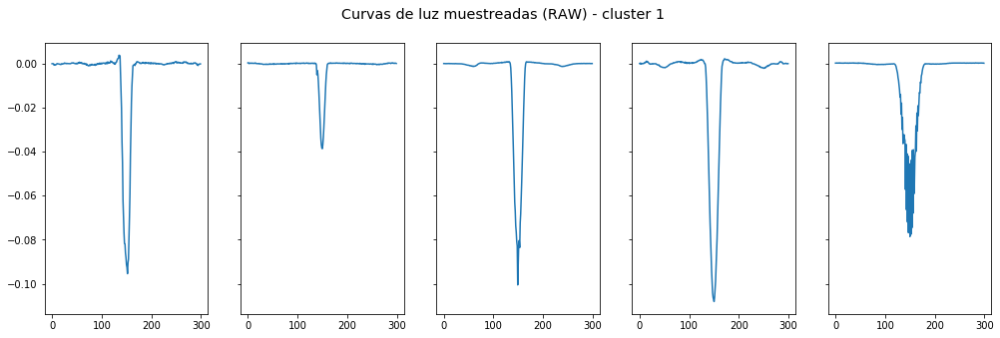

...

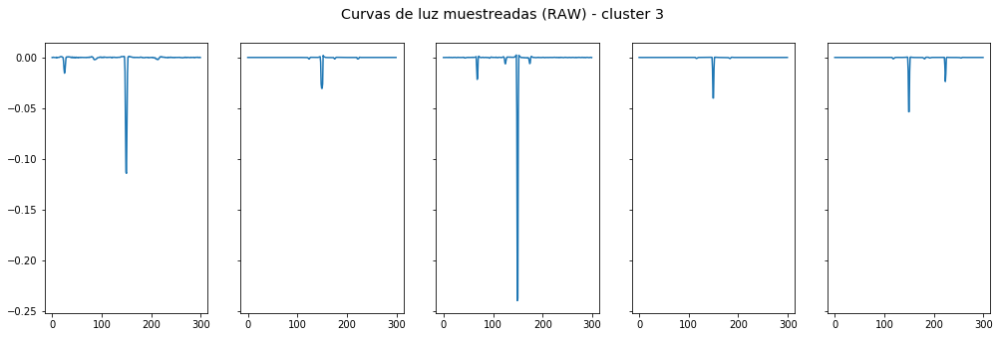

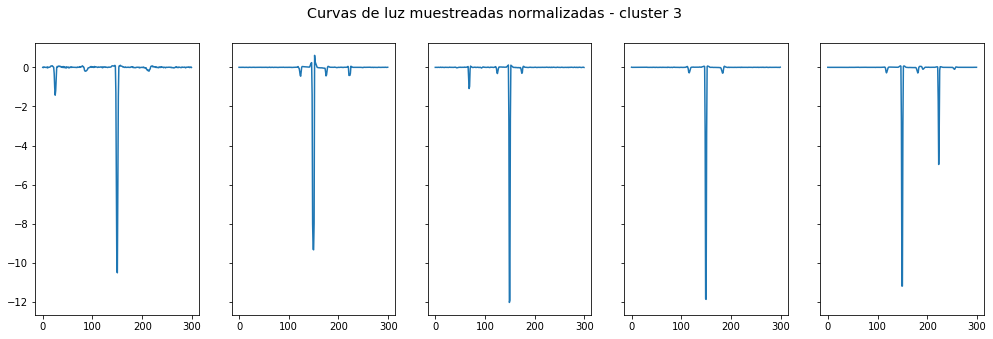

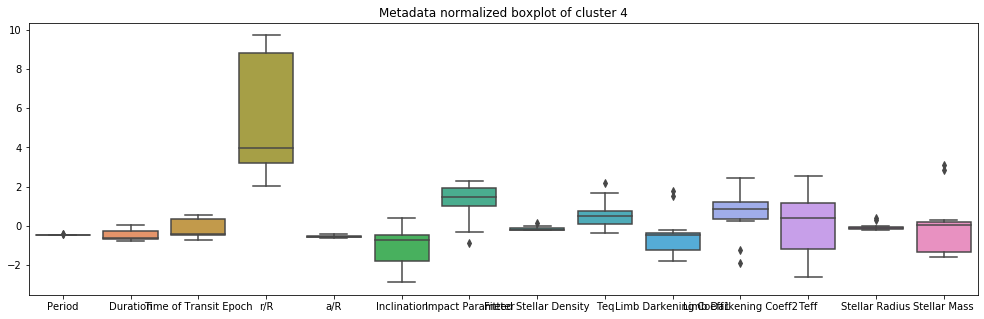

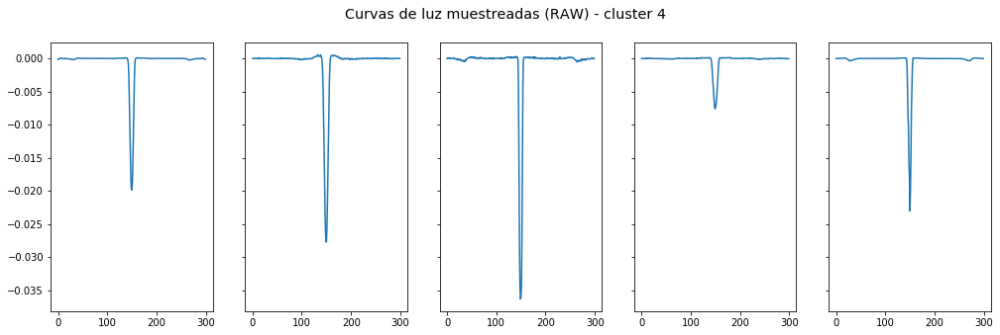

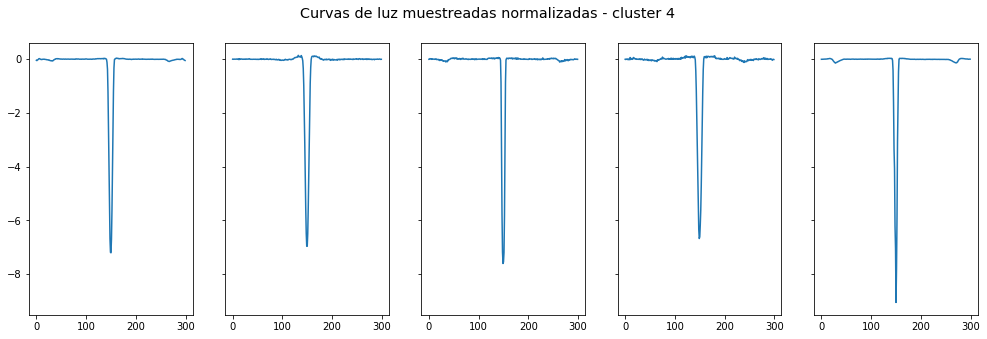

In [42]:
mask_noise = (clus_l==-1)


n_s = 5

N_is = []
conf_ratios = []
cand_ratios = []
mean_metadatas = []
for i in range(K):
    mask_i = (clus_l==i)

    N_i = np.sum(mask_i*1)
    N_is.append(N_i)
    conf_ratio = np.sum(all_labels[mask_i]=="CONFIRMED") 
    CONF_ratio = conf_ratio/(conf_ratio+np.sum(all_labels[mask_i]=="FALSE POSITIVE")) #over conf and FP
    conf_ratios.append(CONF_ratio)
    CAND_ratio = np.sum(all_labels[mask_i]=="CANDIDATE")/N_i #total
    cand_ratios.append(CAND_ratio)
    metadata_i = df_meta_obj[mask_i]
    mean_metadata = metadata_i.mean().to_frame().T
    mean_metadatas.append(mean_metadata)

    #display(df_clus_i)

    aux = metadata_i.copy()
    aux[:] = scaler_meta.transform(metadata_i)
    plt.figure(figsize=(17,5))
    sns.boxplot(data=aux)
    plt.title("Metadata normalized boxplot of cluster "+str(i))
    plt.show()

    idx_i = np.arange(X_train_all.shape[0])[mask_i]
    idx_i_sampled = np.random.choice(idx_i,size=n_s,replace=False)

    f, axx = plt.subplots(1, n_s, sharex=False, sharey=True,figsize= (17,5))
    for n in range(n_s):
        axx[n].plot(X_train_all[idx_i_sampled[n]])
    #plt.ylim(-1)
    f.suptitle("Curvas de luz muestreadas (RAW) - cluster "+str(i), fontsize="x-large")
    plt.show()

    X_aux = X_train_all[:,:,0]/S_train_all[:,None]
    f, axx = plt.subplots(1, n_s, sharex=False, sharey=True,figsize= (17,5))
    for n in range(n_s):
        axx[n].plot(X_aux[idx_i_sampled[n]])
    f.suptitle("Curvas de luz muestreadas normalizadas - cluster "+str(i), fontsize="x-large")
    plt.show()

In [43]:
df_clus_i = pd.DataFrame({'#data':N_is, 'CONF_ratio':conf_ratios,'CAND_ratio':cand_ratios})
df_clus_i = pd.concat([df_clus_i, pd.concat(mean_metadatas,ignore_index=True)], axis=1)
df_clus_i

,#data,CONF_ratio,CAND_ratio,Period,Duration,Time of Transit Epoch,r/R,a/R,Inclination,Impact Parameter,Fitted Stellar Density,Teq,Limb Darkening Coeff1,Limb Darkening Coeff2,Teff,Stellar Radius,Stellar Mass
0,11,0.444444,0.181818,11.860904,0.136144,157.473932,0.313636,22.630091,87.135455,0.956000,2.478501,886.000000,0.368364,0.275364,6003.000000,1.149182,1.069273
1,188,0.011299,0.058511,1.626363,0.181598,142.492173,0.573011,3.859011,74.488085,0.881963,0.819438,1873.750000,0.361995,0.277043,5991.101064,1.305340,1.027037
2,132,0.087302,0.045455,27.884384,0.206135,161.340810,0.423758,45.200621,88.697727,0.892977,3.430112,668.719697,0.375909,0.272864,5835.795455,1.175811,0.990788
3,27,0.000000,0.000000,14.289256,0.225885,137.469571,0.498222,25.642778,88.287407,0.757000,2.285721,847.925926,0.371111,0.270963,5923.703704,1.229667,0.990185
4,13,0.307692,0.000000,2.859495,0.108868,145.057766,0.251846,7.313231,81.934615,0.843846,1.473725,1292.615385,0.375308,0.282846,5516.461538,1.126154,0.960231


#### Coseno

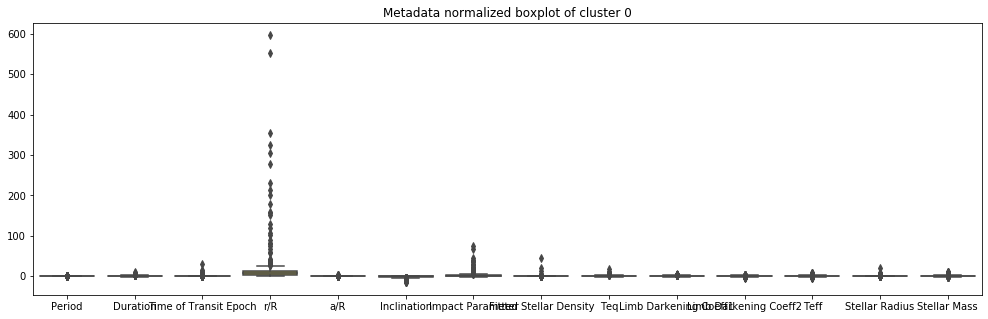

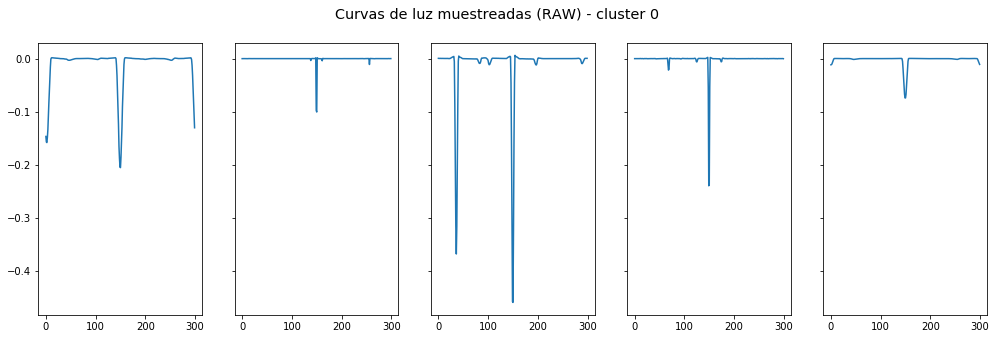

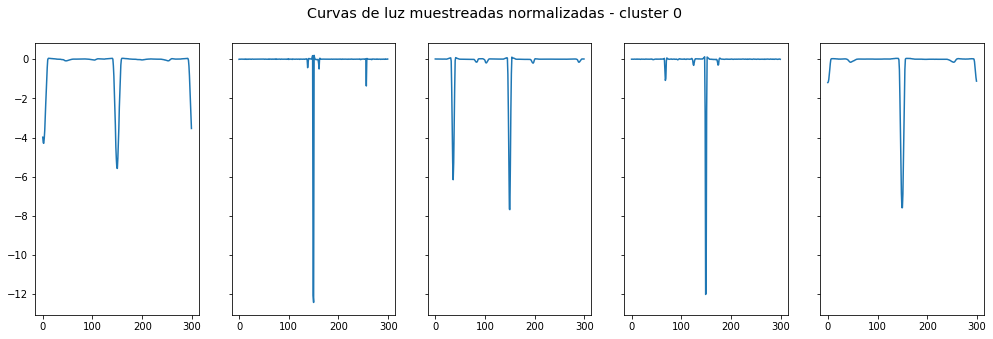

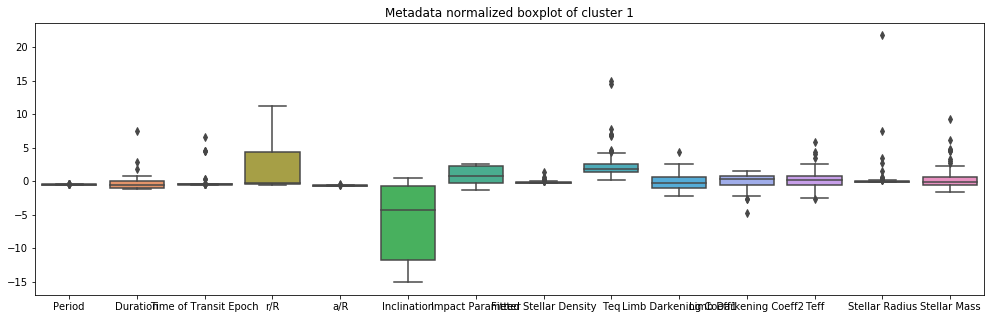

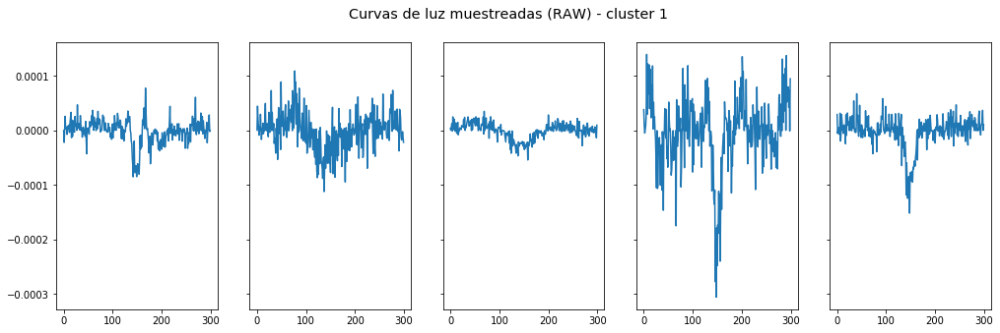

...

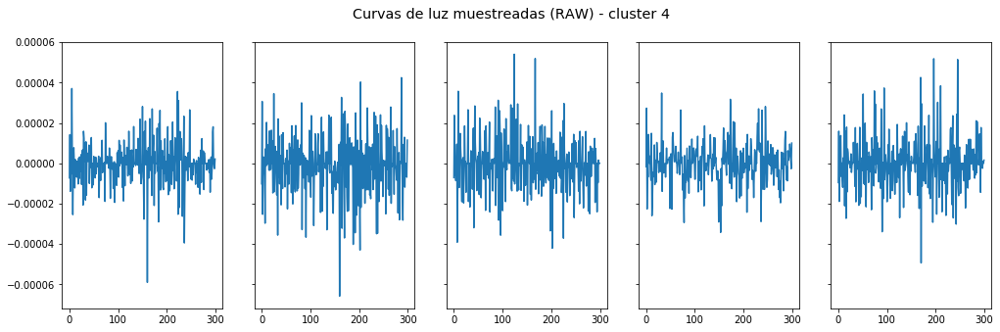

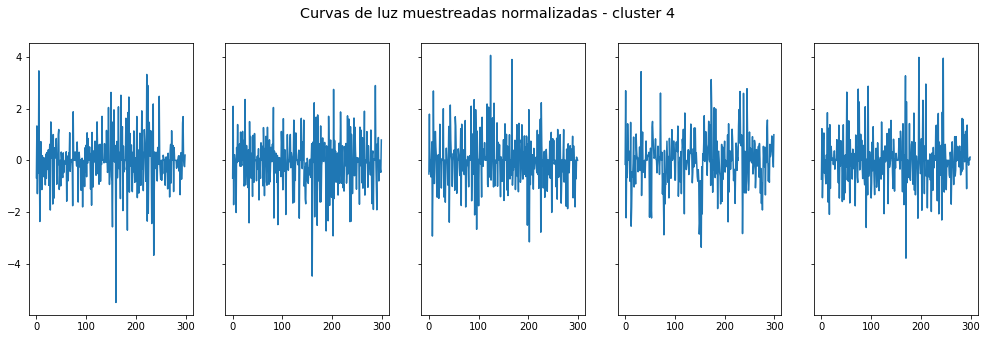

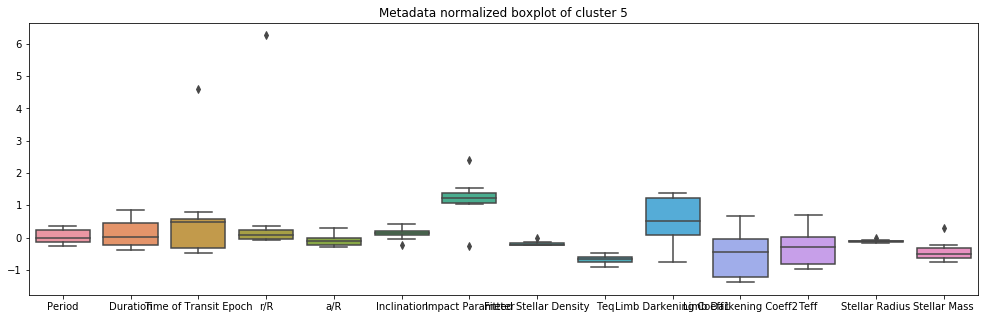

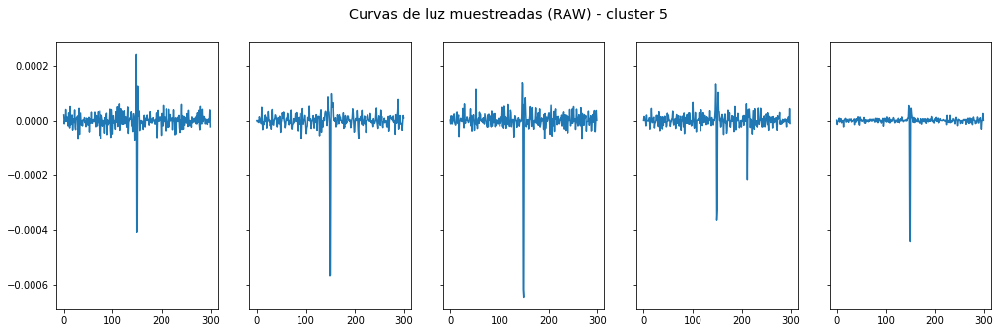

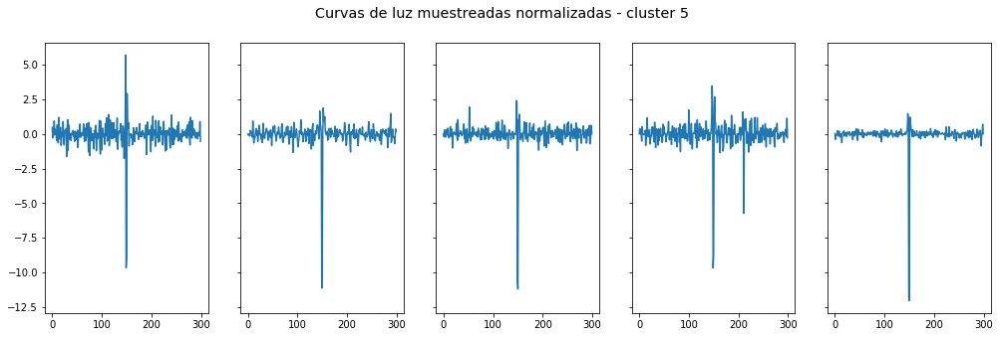

In [54]:
mask_noise = (clus_l==-1)


n_s = 5

N_is = []
conf_ratios = []
cand_ratios = []
mean_metadatas = []
for i in range(K):
    mask_i = (clus_l==i)

    N_i = np.sum(mask_i*1)
    N_is.append(N_i)
    conf_ratio = np.sum(all_labels[mask_i]=="CONFIRMED") 
    CONF_ratio = conf_ratio/(conf_ratio+np.sum(all_labels[mask_i]=="FALSE POSITIVE")) #over conf and FP
    conf_ratios.append(CONF_ratio)
    CAND_ratio = np.sum(all_labels[mask_i]=="CANDIDATE")/N_i #total
    cand_ratios.append(CAND_ratio)
    metadata_i = df_meta_obj[mask_i]
    mean_metadata = metadata_i.mean().to_frame().T
    mean_metadatas.append(mean_metadata)

    #display(df_clus_i)

    aux = metadata_i.copy()
    aux[:] = scaler_meta.transform(metadata_i)
    plt.figure(figsize=(17,5))
    sns.boxplot(data=aux)
    plt.title("Metadata normalized boxplot of cluster "+str(i))
    plt.show()

    idx_i = np.arange(X_train_all.shape[0])[mask_i]
    idx_i_sampled = np.random.choice(idx_i,size=n_s,replace=False)

    f, axx = plt.subplots(1, n_s, sharex=False, sharey=True,figsize= (17,5))
    for n in range(n_s):
        axx[n].plot(X_train_all[idx_i_sampled[n]])
    #plt.ylim(-1)
    f.suptitle("Curvas de luz muestreadas (RAW) - cluster "+str(i), fontsize="x-large")
    plt.show()

    X_aux = X_train_all[:,:,0]/S_train_all[:,None]
    f, axx = plt.subplots(1, n_s, sharex=False, sharey=True,figsize= (17,5))
    for n in range(n_s):
        axx[n].plot(X_aux[idx_i_sampled[n]])
    f.suptitle("Curvas de luz muestreadas normalizadas - cluster "+str(i), fontsize="x-large")
    plt.show()

In [55]:
df_clus_i = pd.DataFrame({'#data':N_is, 'CONF_ratio':conf_ratios,'CAND_ratio':cand_ratios})
df_clus_i = pd.concat([df_clus_i, pd.concat(mean_metadatas,ignore_index=True)], axis=1)
df_clus_i

,#data,CONF_ratio,CAND_ratio,Period,Duration,Time of Transit Epoch,r/R,a/R,Inclination,Impact Parameter,Fitted Stellar Density,Teq,Limb Darkening Coeff1,Limb Darkening Coeff2,Teff,Stellar Radius,Stellar Mass
0,1712,0.160173,0.055491,9.669726,0.187538,147.789748,0.435292,15.762959,79.718637,0.839143,2.518578,1388.155699,0.383967,0.266305,5870.941246,1.521435,1.045075
1,89,0.075949,0.112360,0.711474,0.123908,144.097512,0.088852,2.282602,56.933977,0.717909,1.539323,2502.863636,0.423795,0.241614,5713.318182,2.847000,1.082636
2,37,0.000000,0.000000,68.975859,0.397242,176.881845,0.798703,81.565432,88.959189,1.086838,6.343856,466.594595,0.395946,0.262216,5715.216216,0.984270,0.914622
3,14,0.600000,0.285714,74.263975,0.246240,178.179443,0.021643,72.618571,88.115000,0.654857,2.546756,512.857143,0.412429,0.253929,5692.285714,1.001500,0.957429
4,15,0.200000,0.333333,224.343194,0.369570,247.278755,0.046467,231.866000,89.610667,0.393467,12.582538,446.333333,0.411400,0.253467,5672.866667,2.093067,1.027667
5,8,0.625000,0.000000,28.663320,0.183787,186.504263,0.061750,27.828750,88.026250,0.840625,0.982650,541.500000,0.482500,0.210375,5339.125000,0.867000,0.852000
